In [540]:

#1.import and warehouse data
#import all the given datasets and explore the shape and size
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

data1= pd.read_json("Part1 - Car-Attributes.json")
data2=pd.read_csv("Part1 - Car name.csv")


In [541]:
#data1 shape
shape1=data1.shape
print("The shape of data1:",shape1)


The shape of data1: (398, 8)


In [542]:
#data1 size
size1= data1.size
print("The size of data1:",size1)

The size of data1: 3184


In [543]:
data1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 8 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      398 non-null    object 
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    int64  
 7   origin  398 non-null    int64  
dtypes: float64(3), int64(4), object(1)
memory usage: 25.0+ KB


In [544]:
data1.head() #prints the first 5 rows of data1

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [545]:
#data2 shape and size
shape2=data2.shape
print("The shape of the data2:",shape2)


The shape of the data2: (398, 1)


In [546]:
#size of data2
size2= data2.size
print("The size of data2:",size2)

The size of data2: 398


In [547]:
#Merge all datasets onto one and explore final shape and size.
cdata=pd.concat([data1,data2],axis=1)

In [548]:
cdata.head() #prints the first 5 rows of the dataset

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


In [549]:
#shape of the final dataset
shape=cdata.shape
print("The shape of the final merged dataset:",shape)

The shape of the final merged dataset: (398, 9)


In [550]:
#size of the final dataset
size=cdata.size
print("The size of the final merged dataset:",size)

The size of the final merged dataset: 3582


In [551]:
#Export the final dataset and store it on local machine in .csv, .xlsx and .json format for future use.
cdata.to_csv('car.csv', index=False)
cdata.to_excel('car.xlsx', index = False)
cdata.to_json('car.json', orient = 'split', compression = 'infer', index = 'true')

In [552]:
#data cleansing
#missing/incomplete data
cdata.info()
cdata.isnull().sum() 

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mpg       398 non-null    float64
 1   cyl       398 non-null    int64  
 2   disp      398 non-null    float64
 3   hp        398 non-null    object 
 4   wt        398 non-null    int64  
 5   acc       398 non-null    float64
 6   yr        398 non-null    int64  
 7   origin    398 non-null    int64  
 8   car_name  398 non-null    object 
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
car_name    0
dtype: int64

In [553]:
#Drop attribute/s if required using relevant functional knowledge
cdata = cdata.drop('car_name', axis=1)


In [554]:
#Perform another kind of corrections/treatment on the data.
#replacing the values of origin with actual values
cdata['origin'] = cdata['origin'].replace({1: 'america', 2: 'europe', 3: 'asia'})
cdata.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,america
1,15.0,8,350.0,165,3693,11.5,70,america
2,18.0,8,318.0,150,3436,11.0,70,america
3,16.0,8,304.0,150,3433,12.0,70,america
4,17.0,8,302.0,140,3449,10.5,70,america


In [555]:
#3. Data Analysis and Visualization
#perform detailed statistical analysis
cdata.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0


In [556]:
# checking for missing values of 'hp'
hpisdigit = pd.DataFrame(cdata.hp.str.isdigit()) 

#print isDigit = False
cdata[hpisdigit['hp'] == False]  

,mpg,cyl,disp,hp,wt,acc,yr,origin
32,25.0,4,98.0,?,2046,19.0,71,america
126,21.0,6,200.0,?,2875,17.0,74,america
330,40.9,4,85.0,?,1835,17.3,80,europe
336,23.6,4,140.0,?,2905,14.3,80,america
354,34.5,4,100.0,?,2320,15.8,81,europe
374,23.0,4,151.0,?,3035,20.5,82,america


In [557]:
#Replacing the missing values with nan.
cdata = cdata.replace('?', np.nan)
cdata[hpisdigit['hp'] == False] 

,mpg,cyl,disp,hp,wt,acc,yr,origin
32,25.0,4,98.0,NaN,2046,19.0,71,america
126,21.0,6,200.0,NaN,2875,17.0,74,america
330,40.9,4,85.0,NaN,1835,17.3,80,europe
336,23.6,4,140.0,NaN,2905,14.3,80,america
354,34.5,4,100.0,NaN,2320,15.8,81,europe
374,23.0,4,151.0,NaN,3035,20.5,82,america


In [558]:
#Replace the nan values with the median of hp
cdata.median()

mpg       23.0
cyl        4.0
disp     148.5
hp        93.5
wt      2803.5
acc       15.5
yr        76.0
dtype: float64

In [559]:
#Replacing the values of hp
cdata['hp'].fillna((cdata['hp'].median()), inplace=True)

In [560]:
#checking for missing values in hp
cdata.isnull().sum()              # hence, there are no missing values

mpg       0
cyl       0
disp      0
hp        0
wt        0
acc       0
yr        0
origin    0
dtype: int64

In [561]:
#mean
print("Data mean:",cdata.mean())
#median
print("Data Median:",cdata.median())
#data quantile (25%)
print("Data quantile(25%):",cdata.quantile(q=0.25)) 
#data quantile (50%)
print("Data quantile(50%):",cdata.quantile(q=0.50)) 
#data quantile (75%)
print("Data quantile(75%):",cdata.quantile(q=0.75))  

Data mean: mpg       23.514573
cyl        5.454774
disp     193.425879
hp       104.304020
wt      2970.424623
acc       15.568090
yr        76.010050
dtype: float64
Data Median: mpg       23.0
cyl        4.0
disp     148.5
hp        93.5
wt      2803.5
acc       15.5
yr        76.0
dtype: float64
Data quantile(25%): mpg       17.500
cyl        4.000
disp     104.250
hp        76.000
wt      2223.750
acc       13.825
yr        73.000
Name: 0.25, dtype: float64
Data quantile(50%): mpg       23.0
cyl        4.0
disp     148.5
hp        93.5
wt      2803.5
acc       15.5
yr        76.0
Name: 0.5, dtype: float64
Data quantile(75%): mpg       29.000
cyl        8.000
disp     262.000
hp       125.000
wt      3608.000
acc       17.175
yr        79.000
Name: 0.75, dtype: float64


In [562]:
#lower fence,upperfence,median,IQR,lower quartile,upperquartile of the data for mpg
import numpy as np

CSM = np.median(cdata['mpg']) #CSM- median
CS_UQ=np.percentile(cdata['mpg'],75) #CS_UQ= mpg Upperquartile
CS_LQ=np.percentile(cdata['mpg'],25) #CS_LQ= mpg lowequartile
CS_IQR= CS_UQ-CS_LQ #CS_IQR= IQR of mpg
CS_LF=CS_LQ-(1.5*CS_IQR) #CS_LF=lower fence of mpg
CS_UF=CS_UQ+(1.5*CS_IQR) #CS_UF= upperfence of mpg
Outliers_CS=[i for i in cdata['mpg'] if i < CS_LF or i > CS_UF] #outliers of mpg

In [563]:
print("Median:",CSM)
print("Upper quartile:",CS_UQ)
print("Lower quartile:",CS_LQ)
print("IQR:",CS_IQR)
print("Lower fence:",CS_LF)
print("Upper fence:",CS_UF)
print("Outliers:",Outliers_CS)

Median: 23.0
Upper quartile: 29.0
Lower quartile: 17.5
IQR: 11.5
Lower fence: 0.25
Upper fence: 46.25
Outliers: [46.6]


In [564]:
#datatype checking
cdata.dtypes

mpg       float64
cyl         int64
disp      float64
hp        float64
wt          int64
acc       float64
yr          int64
origin     object
dtype: object

In [565]:
#Lower, upper, IQR for cyl
import numpy as np

CYL = np.median(cdata['cyl']) #CYL- median
CYL_UQ=np.percentile(cdata['cyl'],75) #CYL_UQ= cyl Upperquartile
CYL_LQ=np.percentile(cdata['cyl'],25) #CYL_LQ= cyl lowequartile
CYL_IQR= CYL_UQ-CYL_LQ #CYL_IQR= IQR of cyl
CYL_LF=CYL_LQ-(1.5*CYL_IQR) #CYL_LF=lower fence of cyl
CYL_UF=CYL_UQ+(1.5*CYL_IQR) #CYL_UF= upperfence of cyl
Outliers_CYL=[i for i in cdata['cyl'] if i < CYL_LF or i > CYL_UF] #outliers of cyl

In [566]:
print("Median:",CYL)
print("Upper quartile:",CYL_UQ)
print("Lower quartile:",CYL_LQ)
print("IQR:",CYL_IQR)
print("Lower fence:",CYL_LF)
print("Upper fence:",CYL_UF)
print("Outliers:",Outliers_CYL)

Median: 4.0
Upper quartile: 8.0
Lower quartile: 4.0
IQR: 4.0
Lower fence: -2.0
Upper fence: 14.0
Outliers: []


In [567]:
#Lower, upper, IQR for disp
import numpy as np

DM = np.median(cdata['disp']) #DM- median
DISP_UQ=np.percentile(cdata['disp'],75) #DISP_UQ= disp Upperquartile
DISP_LQ=np.percentile(cdata['disp'],25) #DISP_LQ= disp lowequartile
DISP_IQR= DISP_UQ-DISP_LQ #DISP_IQR= IQR of disp
DISP_LF=DISP_LQ-(1.5*DISP_IQR) #DSP_LF=lower fence of disp
DISP_UF=DISP_UQ+(1.5*DISP_IQR) #DSP_UF= upperfence of disp
Outliers_DISP=[i for i in cdata['disp'] if i < DISP_LF or i > DISP_UF] #outliers of disp

In [568]:
print("Median:",DM)
print("Upper quartile:",DISP_UQ)
print("Lower quartile:",DISP_LQ)
print("IQR:",DISP_IQR)
print("Lower fence:",DISP_LF)
print("Upper fence:",DISP_UF)
print("Outliers:",Outliers_DISP)

Median: 148.5
Upper quartile: 262.0
Lower quartile: 104.25
IQR: 157.75
Lower fence: -132.375
Upper fence: 498.625
Outliers: []


Hence, it can be stated that there are no outliers for disp

In [569]:
#Lower, upper, IQR for hp
import numpy as np

HPM = np.median(cdata['hp']) #HPM- median
HP_UQ=np.percentile(cdata['hp'],75) #HP_UQ= hp Upperquartile
HP_LQ=np.percentile(cdata['hp'],25) #HP_LQ= hp lowequartile
HP_IQR= HP_UQ-HP_LQ #HP_IQR= IQR of hp
HP_LF=HP_LQ-(1.5*HP_IQR) #HP_LF=lower fence of hp
HP_UF=HP_UQ+(1.5*HP_IQR) #HP_UF= upperfence of hp
Outliers_HP=[i for i in cdata['hp'] if i < HP_LF or i > HP_UF] #outliers of hp

In [570]:
print("Median:",HPM)
print("Upper quartile:",HP_UQ)
print("Lower quartile:",HP_LQ)
print("IQR:",HP_IQR)
print("Lower fence:",HP_LF)
print("Upper fence:",HP_UF)
print("Outliers:",Outliers_HP)

Median: 93.5
Upper quartile: 125.0
Lower quartile: 76.0
IQR: 49.0
Lower fence: 2.5
Upper fence: 198.5
Outliers: [220.0, 215.0, 225.0, 225.0, 215.0, 200.0, 210.0, 208.0, 215.0, 225.0, 230.0]


In [571]:
#lower fence,upperfence,median,IQR,lower quartile,upperquartile of the data for wt
import numpy as np

WTM = np.median(cdata['wt']) #WTM- median
WT_UQ=np.percentile(cdata['wt'],75) #WT_UQ= wt Upperquartile
WT_LQ=np.percentile(cdata['wt'],25) #WT_LQ= wt lowequartile
WT_IQR= WT_UQ-WT_LQ #WT_IQR= IQR of wt
WT_LF=WT_LQ-(1.5*WT_IQR) #WT_LF=lower fence of wt
WT_UF=WT_UQ+(1.5*WT_IQR) #WT_UF= upperfence of wt
Outliers_WT=[i for i in cdata['wt'] if i < WT_LF or i > WT_UF] #outliers of wt

In [572]:
print("Median:",WTM)
print("Upper quartile:",WT_UQ)
print("Lower quartile:",WT_LQ)
print("IQR:",WT_IQR)
print("Lower fence:",WT_LF)
print("Upper fence:",WT_UF)
print("Outliers:",Outliers_WT)

Median: 2803.5
Upper quartile: 3608.0
Lower quartile: 2223.75
IQR: 1384.25
Lower fence: 147.375
Upper fence: 5684.375
Outliers: []


In [573]:
#lower fence,upperfence,median,IQR,lower quartile,upperquartile of the data for acc
import numpy as np

ACM = np.median(cdata['acc']) #ACM- median
AC_UQ=np.percentile(cdata['acc'],75) #AC_UQ= acc Upperquartile
AC_LQ=np.percentile(cdata['acc'],25) #AC_LQ= acc lowequartile
AC_IQR= AC_UQ-AC_LQ #AC_IQR= IQR of acc
AC_LF=AC_LQ-(1.5*AC_IQR) #AC_LF=lower fence of acc
AC_UF=AC_UQ+(1.5*AC_IQR) #AC_UF= upperfence of acc
Outliers_AC=[i for i in cdata['acc'] if i < AC_LF or i > AC_UF] #outliers of acc

In [574]:
print("Median:",ACM)
print("Upper quartile:",AC_UQ)
print("Lower quartile:",AC_LQ)
print("IQR:",AC_IQR)
print("Lower fence:",AC_LF)
print("Upper fence:",AC_UF)
print("Outliers:",Outliers_AC)

Median: 15.5
Upper quartile: 17.175
Lower quartile: 13.825000000000001
IQR: 3.3499999999999996
Lower fence: 8.8
Upper fence: 22.2
Outliers: [8.5, 8.5, 8.0, 23.5, 24.8, 23.7, 24.6]


In [575]:
#lower fence,upperfence,median,IQR,lower quartile,upperquartile of the data for yr
import numpy as np

YRM = np.median(cdata['yr']) #YRM- median
YR_UQ=np.percentile(cdata['yr'],75) #YR_UQ= yr Upperquartile
YR_LQ=np.percentile(cdata['yr'],25) #YR_LQ= yr lowequartile
YR_IQR= YR_UQ-YR_LQ #YR_IQR= IQR of yr
YR_LF=YR_LQ-(1.5*YR_IQR) #YR_LF=lower fence of yr
YR_UF=YR_UQ+(1.5*YR_IQR) #YR_UF= upperfence of yr
Outliers_YR=[i for i in cdata['yr'] if i < YR_LF or i > YR_UF] #outliers of YR

In [576]:
print("Median:",YRM)
print("Upper quartile:",YR_UQ)
print("Lower quartile:",YR_LQ)
print("IQR:",YR_IQR)
print("Lower fence:",YR_LF)
print("Upper fence:",YR_UF)
print("Outliers:",Outliers_YR)

Median: 76.0
Upper quartile: 79.0
Lower quartile: 73.0
IQR: 6.0
Lower fence: 64.0
Upper fence: 88.0
Outliers: []


In [577]:
#range for all attributes
df1=cdata[['mpg', 'cyl','disp','hp','wt','acc','yr']]
df1
print('Range of data:',df1.max()-df1.min())
df1.info()


Range of data: mpg       37.6
cyl        5.0
disp     387.0
hp       184.0
wt      3527.0
acc       16.8
yr        12.0
dtype: float64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   mpg     398 non-null    float64
 1   cyl     398 non-null    int64  
 2   disp    398 non-null    float64
 3   hp      398 non-null    float64
 4   wt      398 non-null    int64  
 5   acc     398 non-null    float64
 6   yr      398 non-null    int64  
dtypes: float64(4), int64(3)
memory usage: 21.9 KB


In [578]:
#variance
print('variance:',df1.var())

variance: mpg         61.089611
cyl          2.893415
disp     10872.199152
hp        1460.969052
wt      717140.990526
acc          7.604848
yr          13.672443
dtype: float64


In [579]:
#standard deviation
print('std:',df1.std())

std: mpg       7.815984
cyl       1.701004
disp    104.269838
hp       38.222625
wt      846.841774
acc       2.757689
yr        3.697627
dtype: float64


In [580]:
#covariance
df1.cov()

,mpg,cyl,disp,hp,wt,acc,yr
mpg,61.089611,-10.308911,-655.402318,-231.067162,-5505.211745,9.058930,16.741163
cyl,-10.308911,2.893415,168.623214,54.697663,1290.695575,-2.370842,-2.193499
disp,-655.402318,168.623214,10872.199152,3570.094379,82368.423240,-156.332976,-142.717137
hp,-231.067162,54.697663,3570.094379,1460.969052,27915.978893,-72.370753,-58.474096
wt,-5505.211745,1290.695575,82368.423240,27915.978893,717140.990526,-974.899011,-959.946344
acc,9.058930,-2.370842,-156.332976,-72.370753,-974.899011,7.604848,2.938105
yr,16.741163,-2.193499,-142.717137,-58.474096,-959.946344,2.938105,13.672443


In [581]:
#correlation
df1.corr()

,mpg,cyl,disp,hp,wt,acc,yr
mpg,1.000000,-0.775396,-0.804203,-0.773453,-0.831741,0.420289,0.579267
cyl,-0.775396,1.000000,0.950721,0.841284,0.896017,-0.505419,-0.348746
disp,-0.804203,0.950721,1.000000,0.895778,0.932824,-0.543684,-0.370164
hp,-0.773453,0.841284,0.895778,1.000000,0.862442,-0.686590,-0.413733
wt,-0.831741,0.896017,0.932824,0.862442,1.000000,-0.417457,-0.306564
acc,0.420289,-0.505419,-0.543684,-0.686590,-0.417457,1.000000,0.288137
yr,0.579267,-0.348746,-0.370164,-0.413733,-0.306564,0.288137,1.000000


In [582]:
#describing statistical features of the data
cdata.describe().T


,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
hp,398.0,104.304020,38.222625,46.0,76.000,93.5,125.000,230.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0


From the above,
1. It is clear that the mean and median of the mpg attribute are nearly equal to 23.
2. The mean of 'cyl' is greater than the median
3. The mean of'disp' is greater than the median
4. The mean of'hp' is highly greater than median
5. The mean of 'wt'is greater than the median of it.
6. The mean and median of 'acc' attribute are nearly same.
7. The mean and median of 'yr' attribute are nearly equal.

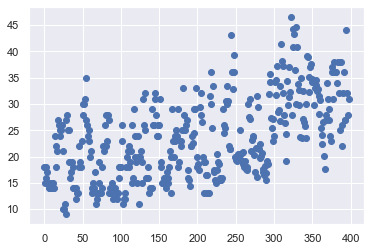

In [583]:
#univariate 
#scatter plots
#mpg
plt.scatter(cdata.index,cdata['mpg']) # scatter plot for continuous data
plt.show()


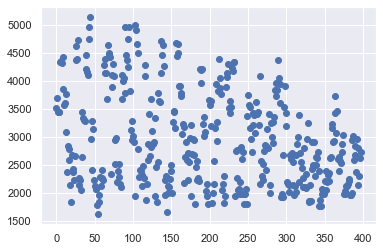

In [584]:
#wt
plt.scatter(cdata.index,cdata['wt']) # scatter plot for continuous data
plt.show()


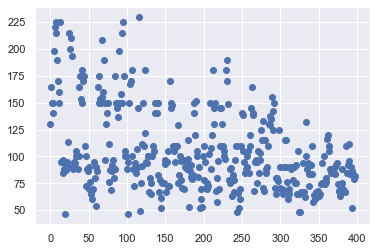

In [585]:
#hp
plt.scatter(cdata.index,cdata['hp']) # scatter plot for continuous data
plt.show()


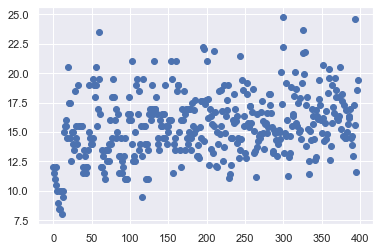

In [586]:
#acc
plt.scatter(cdata.index,cdata['acc']) # scatter plot for continuous data
plt.show()


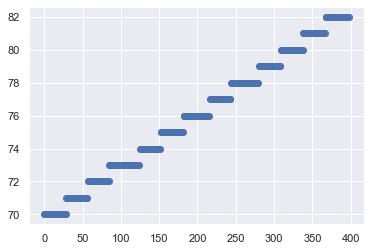

In [587]:
#yr
plt.scatter(cdata.index,cdata['yr']) # scatter plot for continuous data
plt.show()

In [588]:
#creating a new dataset to perform different statistical analysis
car=pd.concat([data1,data2],axis=1)

In [589]:
#creating MPGL (MPg level) attribute using the 25% and 75% of mpg values( <  17 as lower, > 29 as higher and other values as medium )
car['MPGL'] = cdata['mpg'].apply(lambda x: 'lower' if x<17 else 'higher' if x>29 else 'medium')
car.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name,MPGL
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu,medium
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320,lower
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite,medium
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst,lower
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino,medium


In [590]:
car['origin'] = car['origin'].replace({1: 'america', 2: 'europe', 3: 'asia'})
car.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name,MPGL
0,18.0,8,307.0,130,3504,12.0,70,america,chevrolet chevelle malibu,medium
1,15.0,8,350.0,165,3693,11.5,70,america,buick skylark 320,lower
2,18.0,8,318.0,150,3436,11.0,70,america,plymouth satellite,medium
3,16.0,8,304.0,150,3433,12.0,70,america,amc rebel sst,lower
4,17.0,8,302.0,140,3449,10.5,70,america,ford torino,medium


In [591]:
car.dtypes

mpg         float64
cyl           int64
disp        float64
hp           object
wt            int64
acc         float64
yr            int64
origin       object
car_name     object
MPGL         object
dtype: object

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='yr', ylabel='count'>

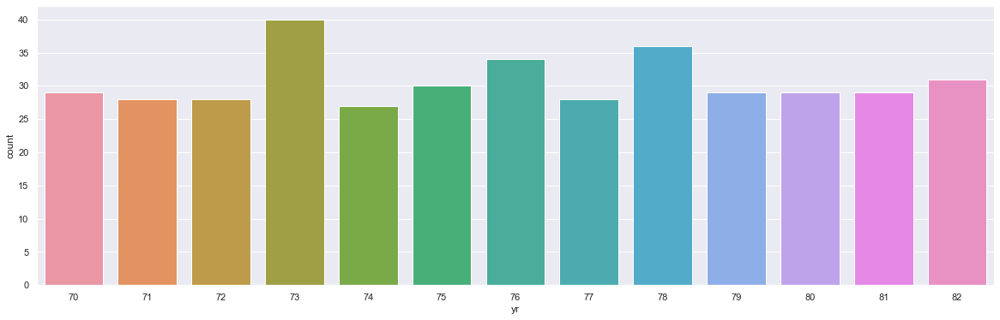

In [592]:
#Distribution of yr
#count plot
import seaborn as sns
plt.figure(figsize=(20,6))
sns.countplot(car['yr'])

The above plot depicts the distribution of yr attribute. It displays the count of values which has the above model yr. From the above plot, it is evident that in yr 73, the city-fuel consumption per gallon are higher and greater than any other model yr mentioned above.

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='origin', ylabel='count'>

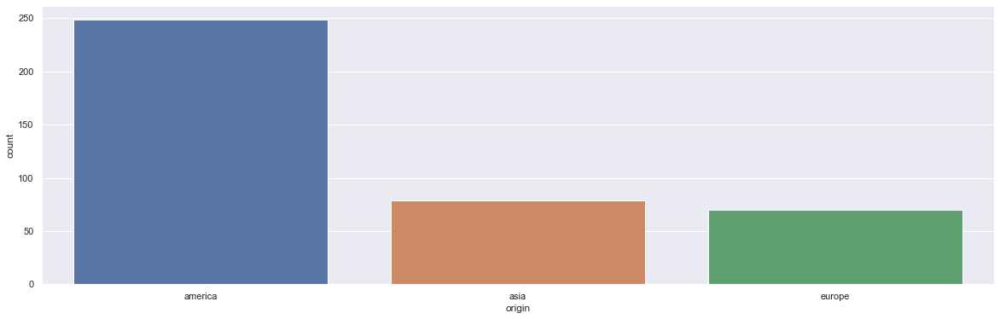

In [593]:
#Distribution of origin
plt.figure(figsize=(20,6))
sns.countplot(car['origin'])

From the above count plot, it is clearly evident that the count of america orgin are greater than asia and europe. Europe has the least count

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='MPGL', ylabel='count'>

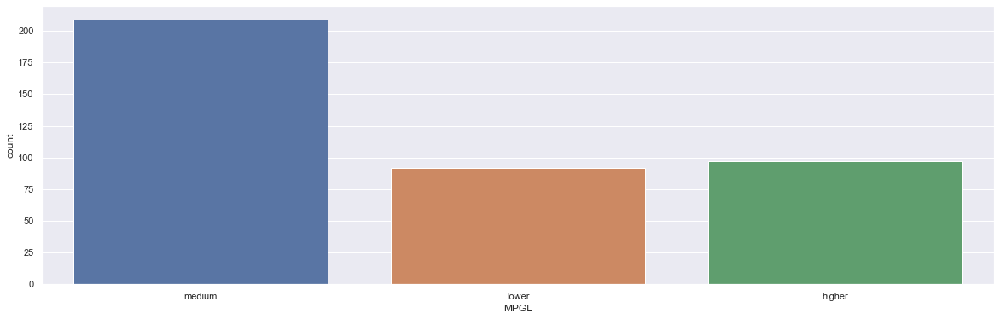

In [594]:
# distribution of mpgl
plt.figure(figsize=(20,6))
sns.countplot(car['MPGL'])

From the above count plot, it is clearly evident that the mpg values with level medium are greater than lower and higher. Here, medium level represents the values of mpg lying between 17 and 29.

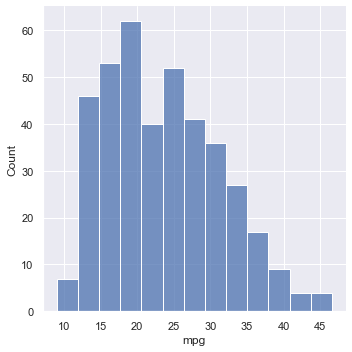

In [595]:
#histogram
#mpg
sns.displot(car, x="mpg")

The above histogram depicts the distribution of 'mpg' data points.

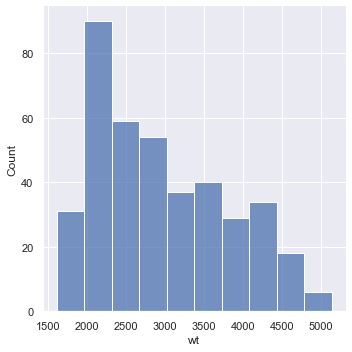

In [596]:
#wt
sns.displot(car, x="wt")

The above histogram depicts the distribution of 'wt' data points.

D:\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='disp', ylabel='Density'>

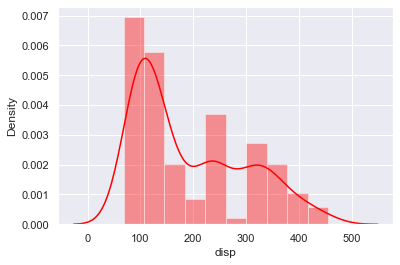

In [597]:
#dist plots
#disp
#graph for disp (univariate graph) and it depicts the distribution of the data points.
sns.distplot(car['disp'],color='Red')

The above plot is the density curve of the disp. The density plots uses Kernel density Estimation.

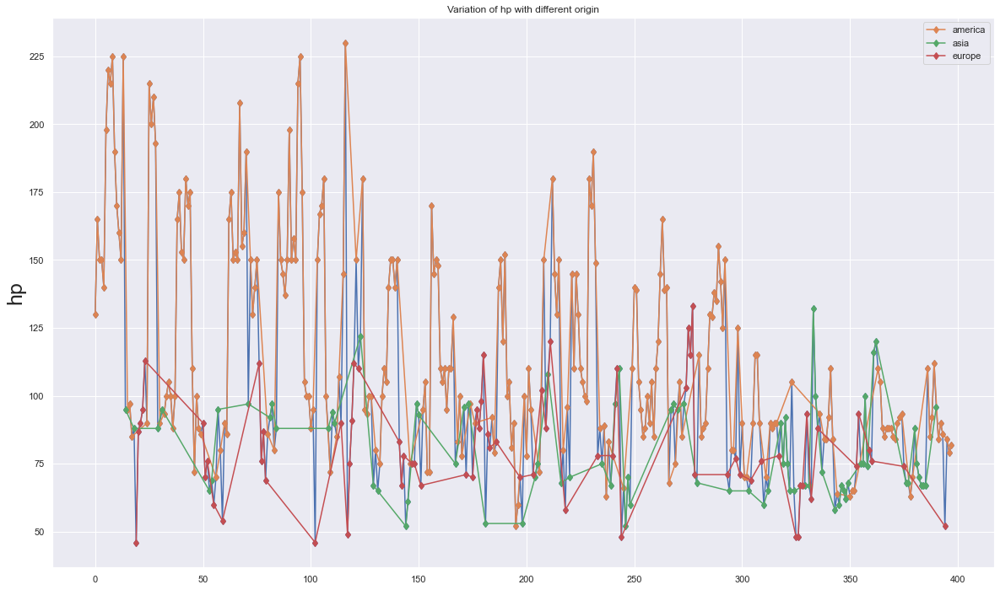

In [598]:
#line plot
# graph- hp vs index and hue= origin
plt.figure(figsize=(20,12))
plt.title('Variation of hp with different origin')
plt.ylabel('hp',fontsize=25)
plt.plot(cdata.index,cdata['hp'],markevery=1,marker='d')
for name1,group in cdata.groupby('origin'):
    plt.plot(group.index,group['hp'],label=name1,markevery=1,marker='d')
plt.legend()
plt.show()

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='acc'>

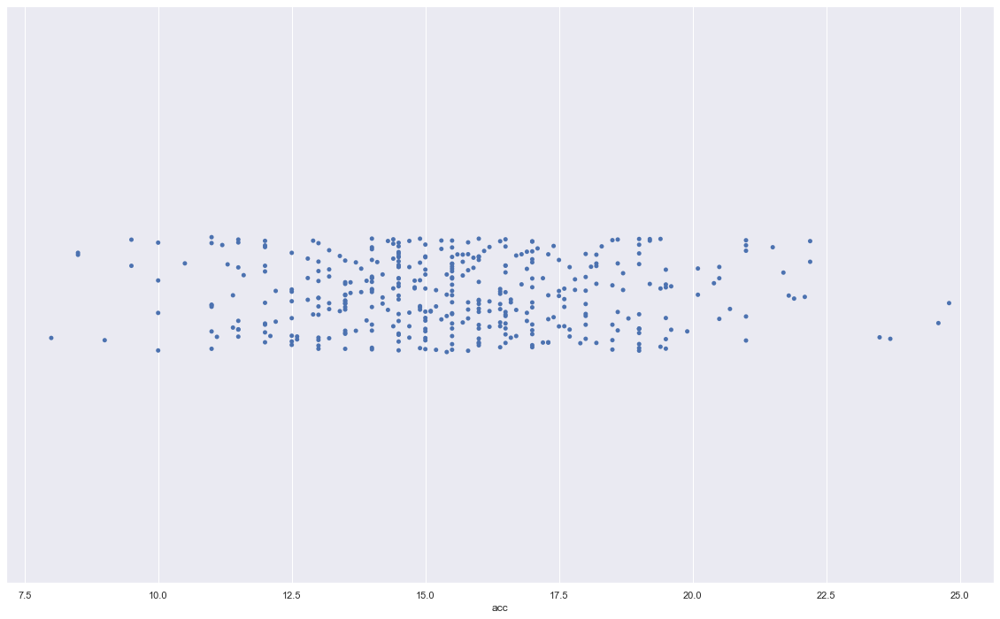

In [599]:
#strip plot
#graph for acc (univariate graph) and it depicts the distribution of the data points.
plt.figure(figsize=(20,12))
sns.stripplot(car['acc'])

D:\anaconda\lib\site-packages\seaborn\categorical.py:1296: UserWarning: 35.7% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


<AxesSubplot:xlabel='cyl'>

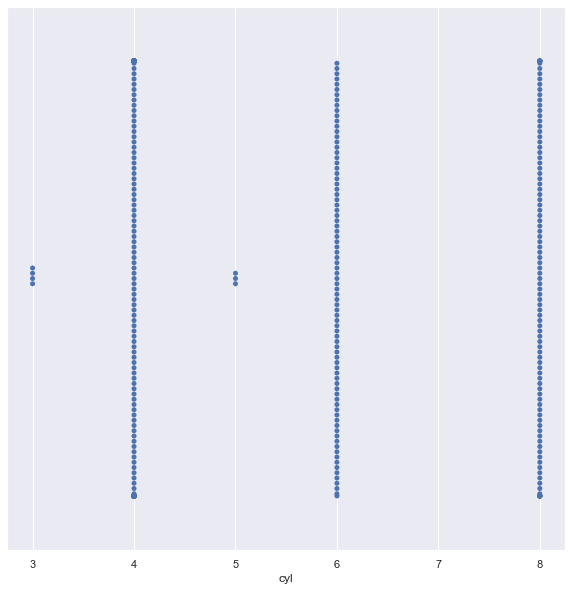

In [600]:
#swarm plot
#cyl distribution (univariate) 
sns.set(rc={'figure.figsize':(10,10)})
sns.swarmplot(x=car['cyl'])


(array([31., 90., 59., 54., 37., 40., 29., 34., 18.,  6.]),
 array([1613. , 1965.7, 2318.4, 2671.1, 3023.8, 3376.5, 3729.2, 4081.9,
        4434.6, 4787.3, 5140. ]),
 <BarContainer object of 10 artists>)

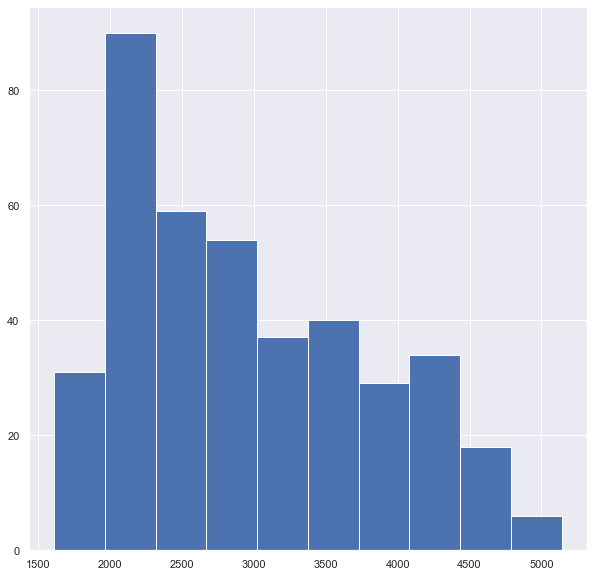

In [601]:
#histogram
plt.hist(x=cdata['wt']) # distribution of wt

<AxesSubplot:ylabel='Density'>

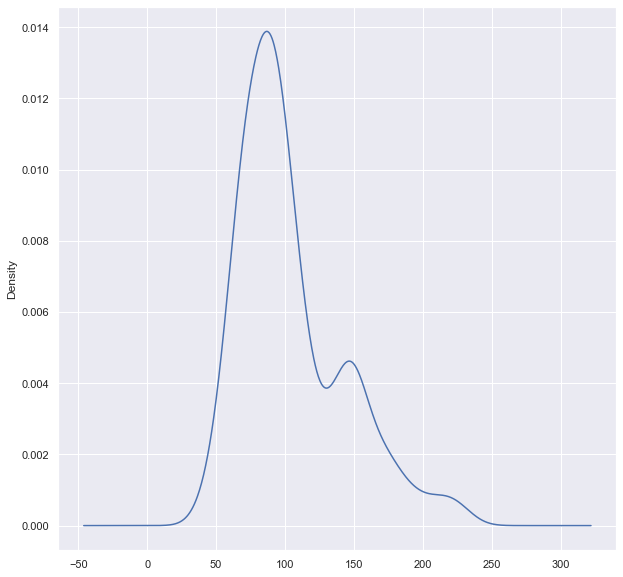

In [602]:
#density plot
plt.figure(figsize=(10,10))
cdata['hp'].plot(kind='density')

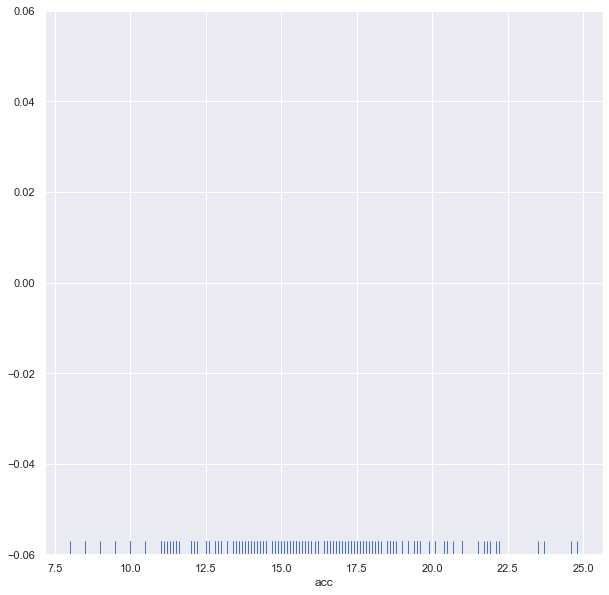

In [603]:
#rug plot
fig,ax=plt.subplots()
sns.rugplot(cdata['acc'])
plt.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x1ec1d199790>,
 'caps': [<matplotlib.lines.Line2D at 0x1ec1d199e50>,
 'boxes': [<matplotlib.lines.Line2D at 0x1ec1d199430>],
 'medians': [<matplotlib.lines.Line2D at 0x1ec1dc73550>],
 'fliers': [<matplotlib.lines.Line2D at 0x1ec1dc738b0>],
 'means': []}

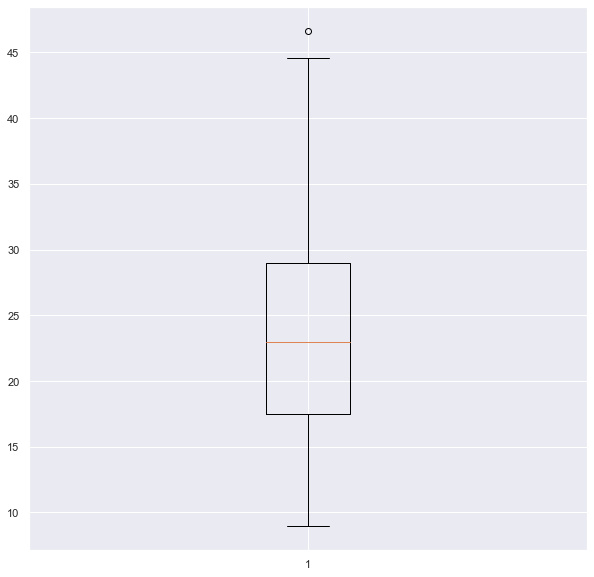

In [604]:
#box plot
plt.boxplot(car['mpg'])


From the above box plot of 'mpg', The min,max and the median of mpg are identified.

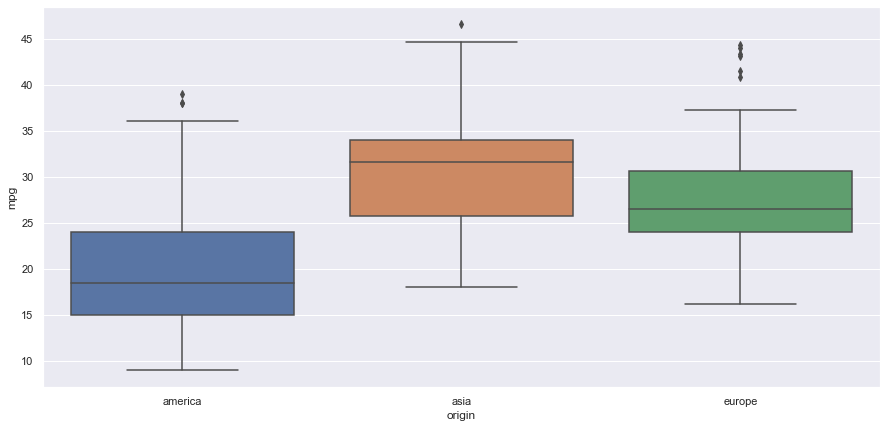

In [605]:
#bivariate plots
#mpg vs origin
plt.figure(figsize=(15,7))
sns.boxplot(x='origin', y='mpg', data= cdata)
plt.show()

From the above boxplot, it is clearly evident that the 'mpg' are comparitively higher/greater with origin 'asia' when compared to 'america' and 'europe'.

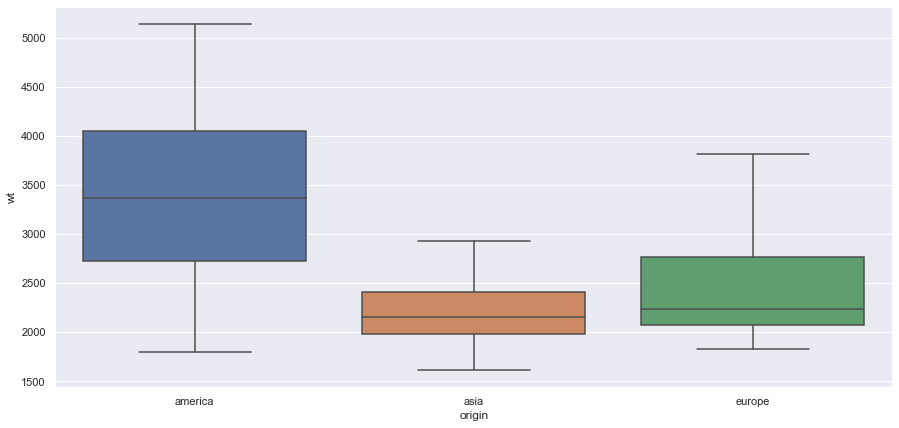

In [606]:
#wt vs origin
#boxplot
plt.figure(figsize=(15,7))
sns.boxplot(x='origin', y='wt', data= cdata)
plt.show()

From the above plot, it is clearly evident that the values of 'wt' are comparatively higher/greater when the origin is 'america' than the origin ' asia' and 'europe'

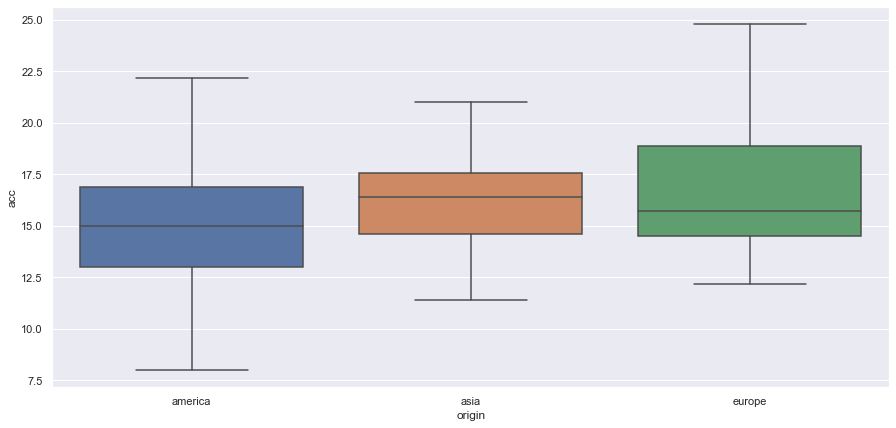

In [607]:
#origin vs acc
plt.figure(figsize=(15,7))
sns.boxplot(x='origin', y='acc', data= cdata)
plt.show()

According to the above plot, the values of 'acc' are higher with origin 'europe' when compared to asia and america.

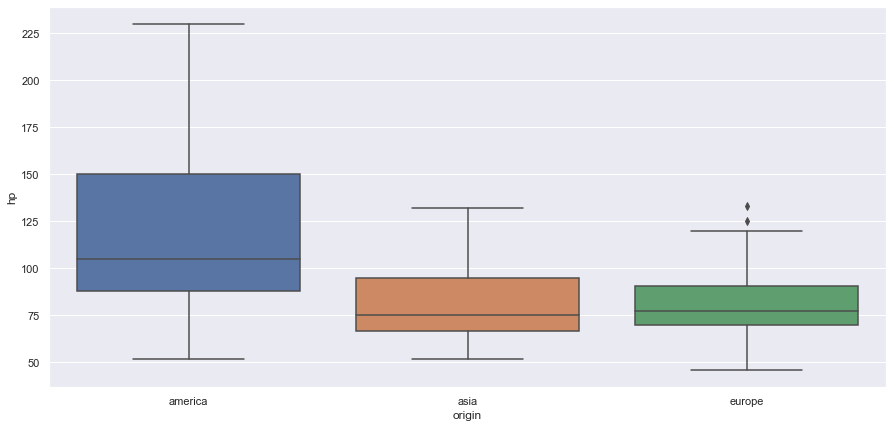

In [608]:
#hp vs origin
#boxplot
plt.figure(figsize=(15,7))
sns.boxplot(x='origin', y='hp', data= cdata)
plt.show()

From the above plot, it is clearly evident that the values of 'hp'(horse power) are higher/greater with origin as 'america' and least with 'europe'.

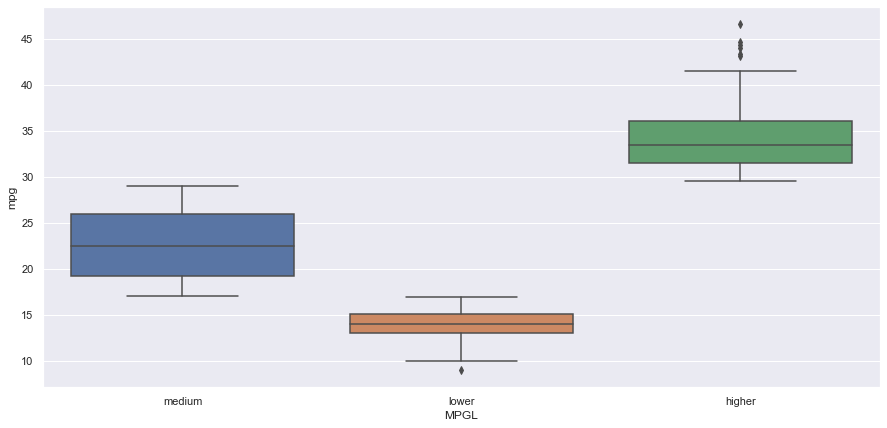

In [609]:
#mpg vs MPGL
#boxplot
plt.figure(figsize=(15,7))
sns.boxplot(x='MPGL', y='mpg', data= car)
plt.show()

From the above box plot, it is clearly evident that the values of mpg with lower level lie between 10 and 17. The values of mpg with level medium lie between 17 and 30. The highe level includes the values of mpg greater than 29.

<Figure size 3600x2160 with 0 Axes>

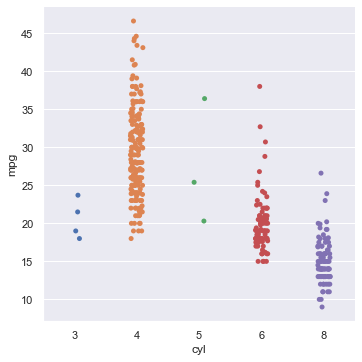

In [610]:
#catplot
#mpg vs cyl
plt.figure(figsize=(50,30))
sns.catplot(x="cyl", y="mpg", data=cdata)

From the above plot, it is evident that there is a kind of linear relationship between mpg and cyl.

<Figure size 3600x2160 with 0 Axes>

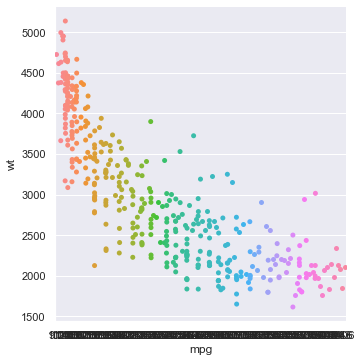

In [611]:
#mpg vs wt
#catplot
plt.figure(figsize=(50,30))
sns.catplot(x="mpg", y="wt", data=cdata)

From the plot, it is clearly evident that as the mpg is increasing, the wt values is decreasing and viceversa.

<Figure size 10800x2160 with 0 Axes>

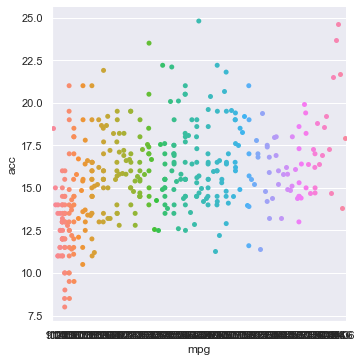

In [612]:
#mpg vs acc
#catplot
plt.figure(figsize=(150,30))
sns.catplot(x="mpg", y="acc", data=cdata)

From above, it is clearly evident that their no relationship between mpg and acc.

<Figure size 10800x2160 with 0 Axes>

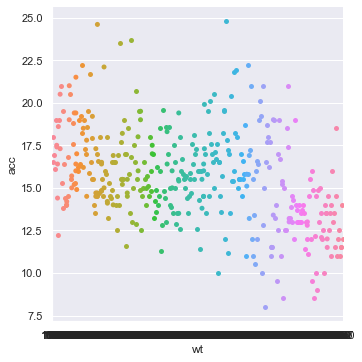

In [613]:
#wt vs acc
#catplot
plt.figure(figsize=(150,30))
sns.catplot(x="wt", y="acc", data=cdata)

<Figure size 10800x2160 with 0 Axes>

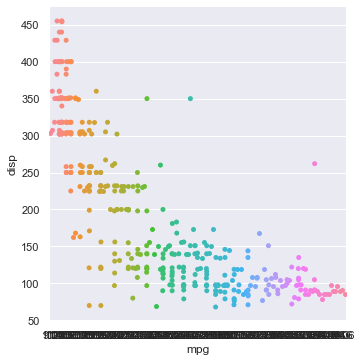

In [614]:
#catplot
#mpg vs disp
plt.figure(figsize=(150,30))
sns.catplot(x="mpg", y="disp", data=cdata)

From the above, it is clearly evident that there is some kind of relationship between mpg and disp

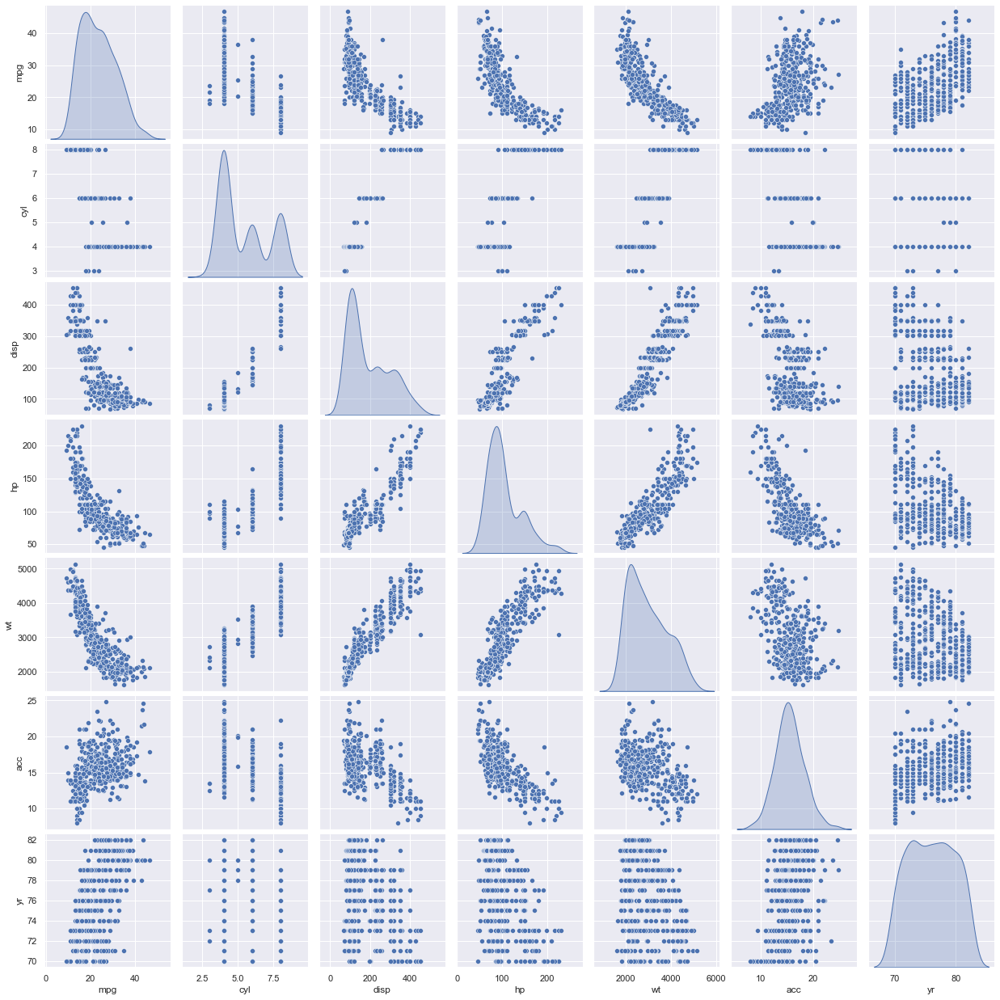

In [615]:
#multivariate plot
#pair plot
sns.pairplot(cdata, diag_kind='kde')

There appears to be a linear relationship between the variables

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning

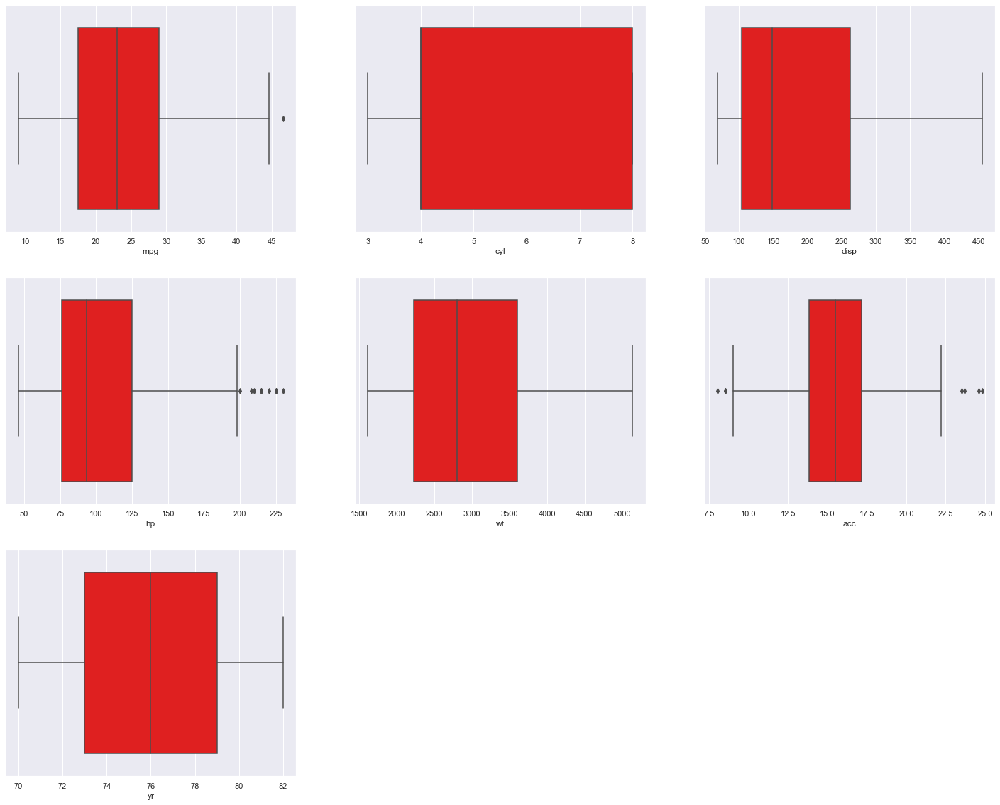

In [616]:
#checking for outliers and replacing them.
car2=cdata.drop(['origin'],axis=1)
plt.figure(figsize=(25, 20))
col = 1
for i in car2.columns:
    plt.subplot(3, 3, col)
    sns.boxplot(car2[i],color='red')
    col += 1

In [617]:
columns1=['mpg','cyl','disp','hp','wt','acc','yr']

In [618]:
for col in columns1:
    #getting upper lower quartile values
    q25,q75=np.percentile(cdata[col],25),np.percentile(cdata[col],75)
    IQR=q75-q25
    Threshold=IQR*1.5
    lower,upper=q25-Threshold,q75+Threshold
    Outliers=[i for i in cdata[col] if i < lower or i > upper]
    print('{} Total Number of outliers in {} Before Imputing : {}'.format('\033[1m',col,len(Outliers)))
    print('\n')
    #taking mean of a column without considering outliers
    cdata_mean = cdata.loc[(cdata[col] >= lower) & (cdata[col] <= upper)]
    mean=int(cdata_mean[col].mean())
    print('{} Mean of {} is {}'.format('\033[1m',col,mean))
    print('\n')
    #imputing  the outliers with the mean
    cdata[col]=np.where(cdata[col]>upper,mean,cdata[col])
    cdata[col]=np.where(cdata[col]<lower,mean,cdata[col])
    Outliers=[i for i in cdata[col] if i < lower or i > upper]
    print('{} Total Number of outliers in {} After Imputing : {}'.format('\033[1m',col,len(Outliers)))  
    print('\n')

 Total Number of outliers in mpg Before Imputing : 1


 Mean of mpg is 23


 Total Number of outliers in mpg After Imputing : 0


 Total Number of outliers in cyl Before Imputing : 0


 Mean of cyl is 5


 Total Number of outliers in cyl After Imputing : 0


 Total Number of outliers in disp Before Imputing : 0


 Mean of disp is 193


 Total Number of outliers in disp After Imputing : 0


 Total Number of outliers in hp Before Imputing : 11


 Mean of hp is 101


 Total Number of outliers in hp After Imputing : 0


 Total Number of outliers in wt Before Imputing : 0


 Mean of wt is 2970


 Total Number of outliers in wt After Imputing : 0


 Total Number of outliers in acc Before Imputing : 7


 Mean of acc is 15


 Total Number of outliers in acc After Imputing : 0


 Total Number of outliers in yr Before Imputing : 0


 Mean of yr is 76


 Total Number of outliers in yr After Imputing : 0




Hence, the outliers are replaced with means.

In [619]:
#checking for correlation
# checking for missing values of 'hp'

In [620]:
#Replace the nan values with the median of hp
car.median()

mpg       23.0
cyl        4.0
disp     148.5
wt      2803.5
acc       15.5
yr        76.0
dtype: float64

In [621]:
car = car.replace('?', np.nan)

In [622]:
car['hp'].fillna((car['hp'].median()), inplace=True)

In [623]:
car.isnull().sum()

mpg         0
cyl         0
disp        0
hp          0
wt          0
acc         0
yr          0
origin      0
car_name    0
MPGL        0
dtype: int64

In [624]:
car.dtypes

mpg         float64
cyl           int64
disp        float64
hp          float64
wt            int64
acc         float64
yr            int64
origin       object
car_name     object
MPGL         object
dtype: object

In [625]:
car.drop(['car_name'], axis=1,inplace=True)

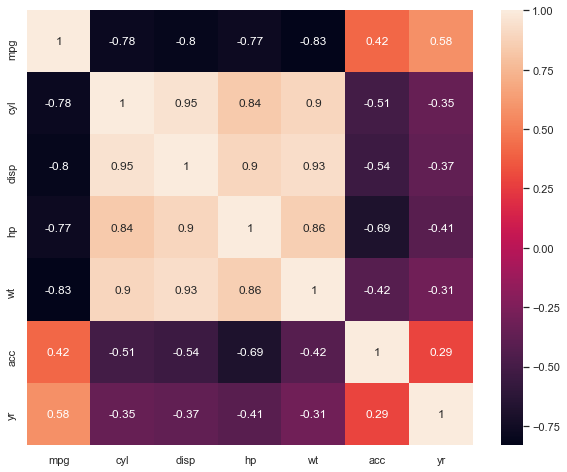

In [626]:
plt.figure(figsize=(10,8))
corr=car.corr()
sns.heatmap(corr,annot=True);

In [627]:
#4. Machine Learning
#Use K Means and Hierarchical clustering to find out the optimal number of clusters in the data.
#Hierarchial clustering
#separating numeric variables
c1 = cdata.iloc[:,0:7] 
c1.head()


,mpg,cyl,disp,hp,wt,acc,yr
0,18.0,8,307.0,130.0,3504,12.0,70
1,15.0,8,350.0,165.0,3693,11.5,70
2,18.0,8,318.0,150.0,3436,11.0,70
3,16.0,8,304.0,150.0,3433,12.0,70
4,17.0,8,302.0,140.0,3449,10.5,70


In [628]:
#Scaling the c1
from scipy.stats import zscore
cDataScaled=c1.apply(zscore)
cDataScaled.head(10)

,mpg,cyl,disp,hp,wt,acc,yr
0,-0.706667,1.498191,1.090604,0.874006,0.630870,-1.388362,-1.627426
1,-1.095281,1.498191,1.503514,1.932326,0.854333,-1.585216,-1.627426
2,-0.706667,1.498191,1.196232,1.478760,0.550470,-1.782069,-1.627426
3,-0.965743,1.498191,1.061796,1.478760,0.546923,-1.388362,-1.627426
4,-0.836205,1.498191,1.042591,1.176383,0.565841,-1.978923,-1.627426
5,-1.095281,1.498191,2.262118,2.930170,1.620492,-2.175776,-1.627426
6,-1.224820,1.498191,2.502182,-0.002887,1.635863,-2.569484,-1.627426
7,-1.224820,1.498191,2.367746,-0.002887,1.586204,-0.207240,-1.627426
8,-1.224820,1.498191,2.511784,-0.002887,1.719809,-2.175776,-1.627426
9,-1.095281,1.498191,1.887617,2.688268,1.039961,-0.207240,-1.627426


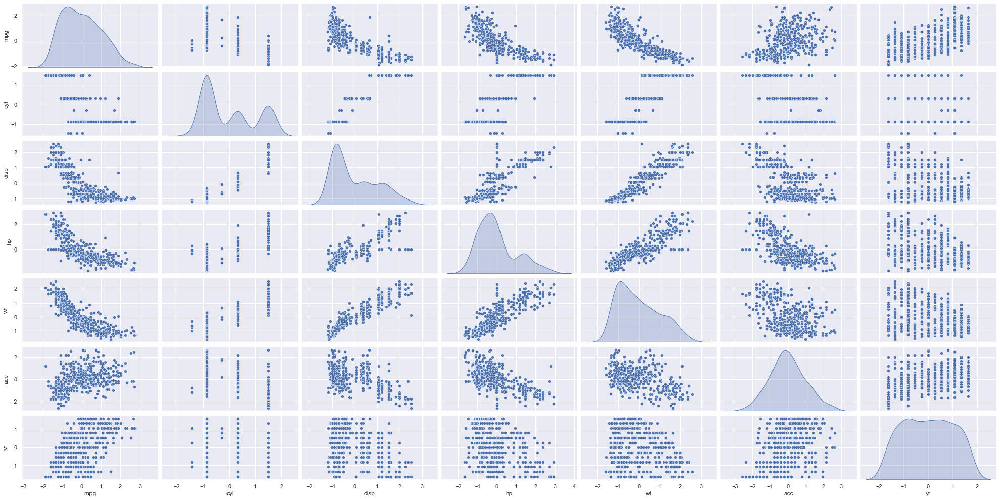

In [629]:
#importing seaborn for statistical plots
sns.pairplot(cDataScaled, height=2,aspect=2 , diag_kind='kde')

In [630]:
#Agglomerative clustering
from sklearn.cluster import AgglomerativeClustering 
model = AgglomerativeClustering(n_clusters=5, affinity='euclidean',  linkage='average')



In [631]:
#finding out the linkage and dendogram
from scipy.cluster.hierarchy import dendrogram, linkage
#choosing linkage method as average
link_method = linkage(cDataScaled.iloc[:,0:7], method = 'average')

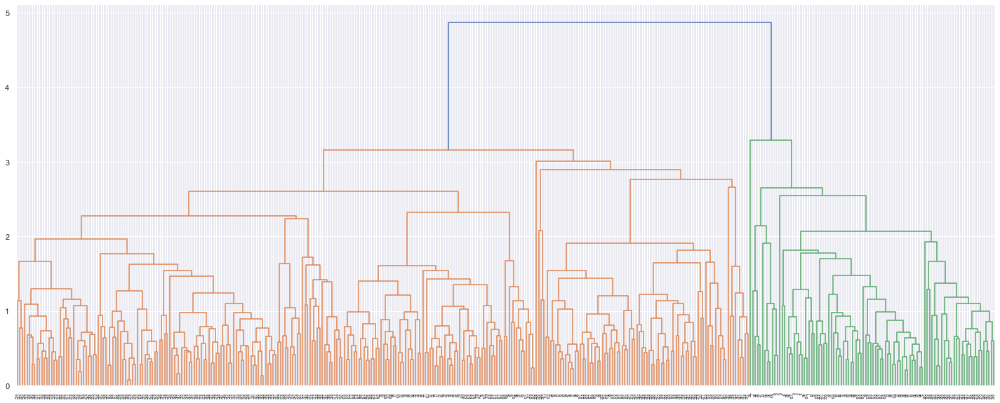

In [632]:
#dendogram
plt.figure(figsize=(25, 10))
dendrogram(link_method)
plt.show()

 The above dendogram appears to be to much of a visual clutter, we'll go ahead and cut down the dendrogram to give us 2 clusters/groups

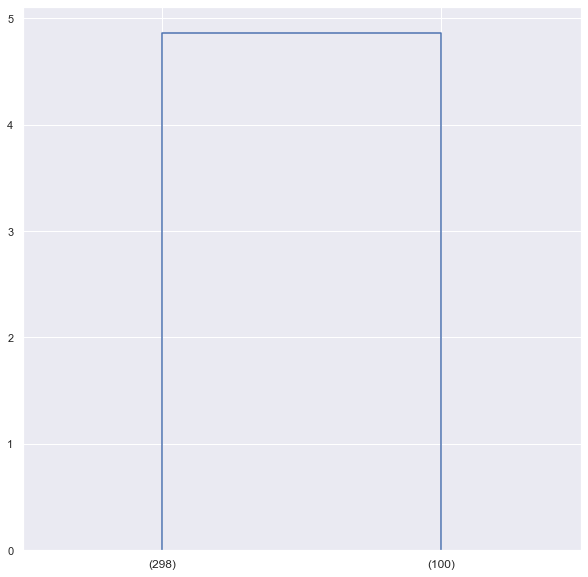

In [633]:
# dendrogram function to arrive at dendrogram
dendrogram(
    link_method,
    truncate_mode='lastp', # show only the last p merged clusters 
    p=2,# show only the last p merged clusters  
)
plt.show()

In [634]:
max_d=198

In [635]:
from scipy.cluster.hierarchy import fcluster
clusters = fcluster(link_method,2, criterion='maxclust')
clusters

array([2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2,
       2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1,
       1, 2, 1, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2,
       2, 2, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2,
       2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1, 1, 1,

In [636]:
cdata.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130.0,3504,12.0,70,america
1,15.0,8,350.0,165.0,3693,11.5,70,america
2,18.0,8,318.0,150.0,3436,11.0,70,america
3,16.0,8,304.0,150.0,3433,12.0,70,america
4,17.0,8,302.0,140.0,3449,10.5,70,america


In [637]:
carh= cdata.copy()

Appending clusters to original dataset

In [638]:
cDataScaled['clusters_H'] = clusters
cDataScaled.head()

,mpg,cyl,disp,hp,wt,acc,yr,clusters_H
0,-0.706667,1.498191,1.090604,0.874006,0.630870,-1.388362,-1.627426,2
1,-1.095281,1.498191,1.503514,1.932326,0.854333,-1.585216,-1.627426,2
2,-0.706667,1.498191,1.196232,1.478760,0.550470,-1.782069,-1.627426,2
3,-0.965743,1.498191,1.061796,1.478760,0.546923,-1.388362,-1.627426,2
4,-0.836205,1.498191,1.042591,1.176383,0.565841,-1.978923,-1.627426,2


In [639]:
#vieweing the distribution of clusters
cDataScaled.clusters_H.value_counts().sort_index()

1    298
2    100
Name: clusters_H, dtype: int64

In [640]:
#attaching the clusters formed to the original data
c1['clusters_H']=clusters
carh['clusters_H']=clusters
c1.head()

,mpg,cyl,disp,hp,wt,acc,yr,clusters_H
0,18.0,8,307.0,130.0,3504,12.0,70,2
1,15.0,8,350.0,165.0,3693,11.5,70,2
2,18.0,8,318.0,150.0,3436,11.0,70,2
3,16.0,8,304.0,150.0,3433,12.0,70,2
4,17.0,8,302.0,140.0,3449,10.5,70,2


In [641]:
#aggregating the numerical variable with the clusters formed with the mean
aggdata=c1.iloc[:,0:8].groupby('clusters_H').mean()
aggdata['Freq']=c1.clusters_H.value_counts().sort_index()
aggdata

,mpg,cyl,disp,hp,wt,acc,yr,Freq
clusters_H,,,,,,,,
1,26.398658,4.607383,142.404362,85.479866,2584.137584,16.407047,76.771812,298
2,14.684000,7.980000,345.470000,147.630000,4121.560000,12.902000,73.740000,100


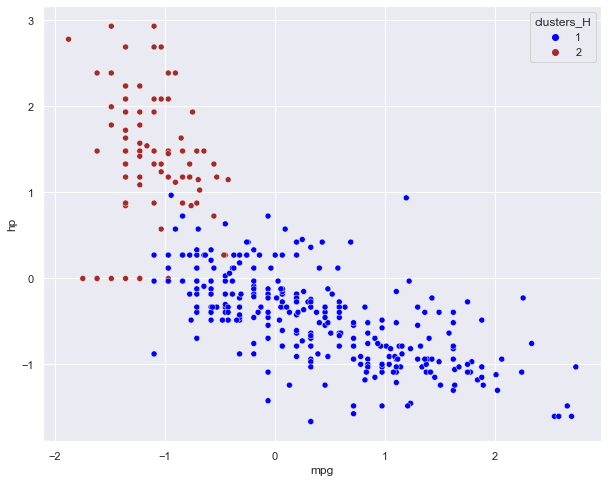

In [642]:

#plotting the clusters formed
plt.figure(figsize=(10, 8))
sns.scatterplot(x="mpg", y="hp", hue="clusters_H",
              data=cDataScaled, 
                    palette=['blue','brown']);

In [643]:
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
from scipy.spatial.distance import pdist 

In [644]:
# cophenet index is a measure of the correlation between the distance of points in feature space and distance on dendrogram
# closer it is to 1, the better is the clustering

Z = linkage(cDataScaled, metric='euclidean', method='average')
c, coph_dists = cophenet(Z , pdist(cDataScaled))
c

0.8101189987194494

From the above, it is evident that the cophonet index with method as 'average' is about 0.81%

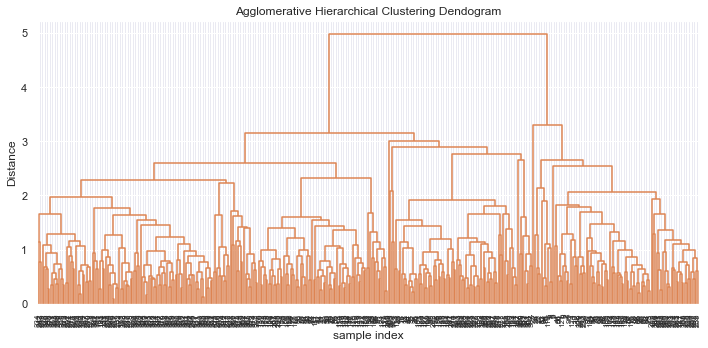

In [645]:
plt.figure(figsize=(10, 5))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z, leaf_rotation=90.,color_threshold = 40, leaf_font_size=8. )
plt.tight_layout()

In [646]:
#linkage method complete
# cophenet index is a measure of the correlation between the distance of points in feature space and distance on dendrogram
# closer it is to 1, the better is the clustering

Z1 = linkage(cDataScaled, metric='euclidean', method='complete')
c1, coph_dists = cophenet(Z1 , pdist(cDataScaled))
print("The cophonet index with method as complete:",c1)

The cophonet index with method as complete: 0.7759175497888969


From above, it is clear that the cophonet index with the method complete is about 77.5%

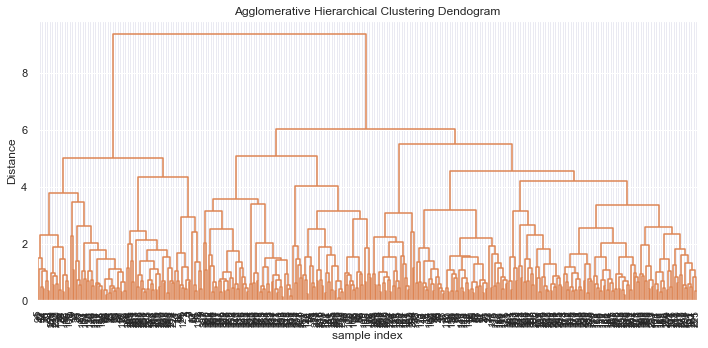

In [647]:
plt.figure(figsize=(10, 5))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z1, leaf_rotation=90.,color_threshold=90,  leaf_font_size=10. )
plt.tight_layout()

In [648]:
#linkage method ward
# cophenet index is a measure of the correlation between the distance of points in feature space and distance on dendrogram
# closer it is to 1, the better is the clustering

Z2 = linkage(cDataScaled, metric='euclidean', method='ward')
c2, coph_dists = cophenet(Z2 , pdist(cDataScaled))
print("The cophenet index with method ward:",c2)

The cophenet index with method ward: 0.7977853145443708


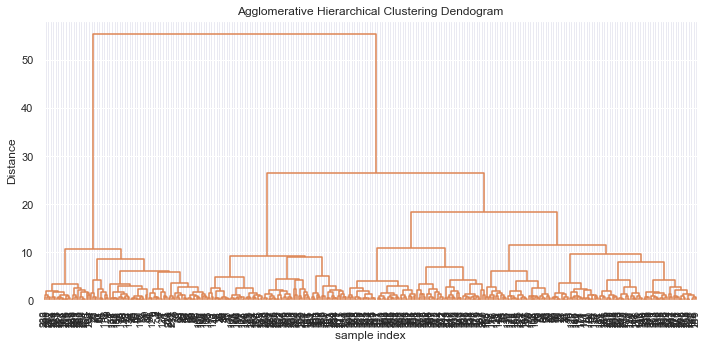

In [649]:
plt.figure(figsize=(10, 5))
plt.title('Agglomerative Hierarchical Clustering Dendogram')
plt.xlabel('sample index')
plt.ylabel('Distance')
dendrogram(Z2, leaf_rotation=90.,color_threshold=600,  leaf_font_size=10. )
plt.tight_layout()


From the above three methods, the cophenet index for method 'average' is high, hence the clustering is better with method average than complete and ward.

In [650]:
#k-means clustering
#seperating the numeric values
cark = cdata.iloc[:,0:7] 
cark_z1 = cark.apply(zscore)
cark_z1.head()

,mpg,cyl,disp,hp,wt,acc,yr
0,-0.706667,1.498191,1.090604,0.874006,0.630870,-1.388362,-1.627426
1,-1.095281,1.498191,1.503514,1.932326,0.854333,-1.585216,-1.627426
2,-0.706667,1.498191,1.196232,1.478760,0.550470,-1.782069,-1.627426
3,-0.965743,1.498191,1.061796,1.478760,0.546923,-1.388362,-1.627426
4,-0.836205,1.498191,1.042591,1.176383,0.565841,-1.978923,-1.627426


In [651]:
# Create K Means cluster and store the result in the object k_means
from sklearn.cluster import KMeans 
k_means = KMeans(n_clusters = 2)
# Fit K means on the scaled_df
k_means.fit(cark_z1)

KMeans(n_clusters=2)

In [652]:
# Get the labels
k_means.labels_

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0,
       0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 1, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1,
       0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 0,
       0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 1, 0, 0,

In [653]:
k_means.inertia_        # Within Cluster Sum of Squares

1310.2484868895283

In [654]:
#Forming clusters with K = 1,3,4,5,6 and comparing the WSS
k_means = KMeans(n_clusters = 3)
k_means.fit(cark_z1)
k_means.inertia_

965.6024817746855

In [655]:
k_means = KMeans(n_clusters = 4)
k_means.fit(cark_z1)
k_means.inertia_

760.6360152159681

In [656]:
k_means = KMeans(n_clusters = 1)
k_means.fit(cark_z1)
k_means.inertia_

D:\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


2786.000000000002

In [657]:
k_means = KMeans(n_clusters = 5)
k_means.fit(cark_z1)
k_means.inertia_

684.0716209412816

In [658]:
k_means = KMeans(n_clusters = 6)
k_means.fit(cark_z1)
k_means.inertia_

630.510571249771

WSS reduces as K keeps increasing

In [659]:
#Calculating WSS for other values of K - Elbow Method
wss =[] 
for i in range(1,5):
    KM = KMeans(n_clusters=i)
    KM.fit(cark_z1)
    wss.append(KM.inertia_)
wss

D:\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


[2786.000000000002, 1310.2484868895283, 965.6369091215445, 760.6360152159681]

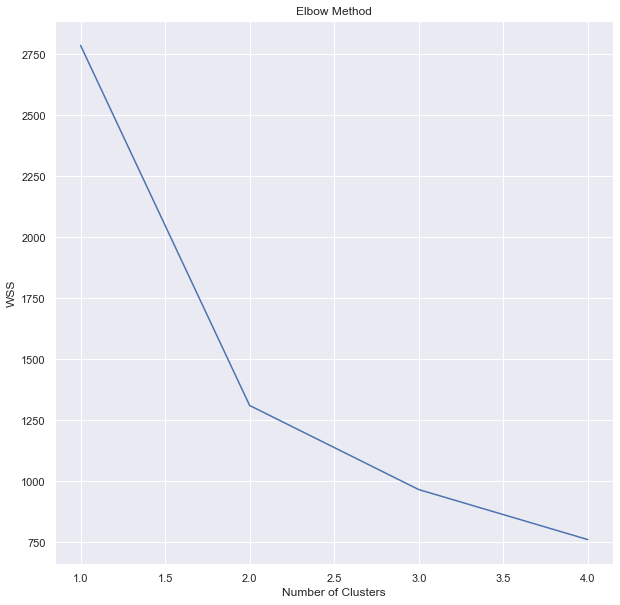

In [660]:
#plotting the WSS against the number of cluster to come up with optimal number of clusters using Elbow-method
plt.plot(range(1,5), wss);
plt.title('Elbow Method');
plt.xlabel("Number of Clusters")
plt.ylabel("WSS");

In [661]:
#using 2 centroids for clustering
k_means = KMeans(n_clusters = 2)
k_means.fit(cark_z1)
labels1 = k_means.labels_

In [662]:
# Calculating silhouette_score
from sklearn.metrics import silhouette_samples, silhouette_score
silhouette_score(cark_z1,labels1)

0.45418810792334885

In [663]:
k_means = KMeans(n_clusters = 4,random_state=0)
k_means.fit(cark_z1)
labels = k_means.labels_
silhouette_score(cark_z1,labels)


0.34244464268849

From the above silhouette scores it is evident that with k=2, the silhouette score is higher than k=4. Hence, K=2.

In [664]:
#calculating silhouette score for different centroids
kmeans_kwargs = {
   "init": "random",
   "n_init": 10,
   "max_iter": 300,
   "random_state": 42,
}


silhouette_coefficients = []

 # Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 7):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(cark_z1)
    score = silhouette_score(cark_z1,kmeans.labels_)
    silhouette_coefficients.append(score)
    

 

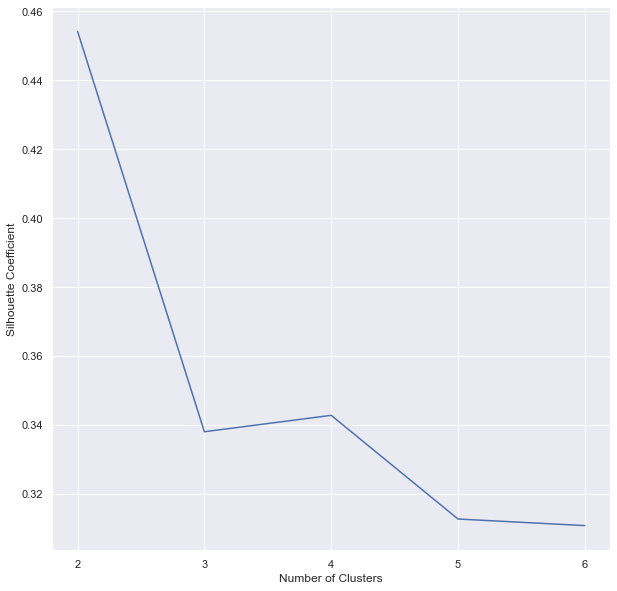

In [665]:
#plotting silhouette score for different centroids
plt.plot(range(2, 7), silhouette_coefficients)
plt.xticks(range(2, 7))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

In [666]:
#attaching the labels to the datasets
cark["cluster_K"] = labels1
cark_z1['cluster_K']=labels1
Kclus=cark
Kclus.head()


,mpg,cyl,disp,hp,wt,acc,yr,cluster_K
0,18.0,8,307.0,130.0,3504,12.0,70,1
1,15.0,8,350.0,165.0,3693,11.5,70,1
2,18.0,8,318.0,150.0,3436,11.0,70,1
3,16.0,8,304.0,150.0,3433,12.0,70,1
4,17.0,8,302.0,140.0,3449,10.5,70,1


In [667]:
#vieweing the distribution of clusters
cark.cluster_K.value_counts().sort_index()

0    272
1    126
Name: cluster_K, dtype: int64

In [668]:
#attaching the clsuters to the scaled data
cark_z1["cluster_K"] = labels1
cark_z1.head()


,mpg,cyl,disp,hp,wt,acc,yr,cluster_K
0,-0.706667,1.498191,1.090604,0.874006,0.630870,-1.388362,-1.627426,1
1,-1.095281,1.498191,1.503514,1.932326,0.854333,-1.585216,-1.627426,1
2,-0.706667,1.498191,1.196232,1.478760,0.550470,-1.782069,-1.627426,1
3,-0.965743,1.498191,1.061796,1.478760,0.546923,-1.388362,-1.627426,1
4,-0.836205,1.498191,1.042591,1.176383,0.565841,-1.978923,-1.627426,1


In [669]:
#aggregating the numerical variable with the clusters formed with the mean
aggdata1=cark.iloc[:,0:8].groupby('cluster_K').mean()
aggdata1['Freq']=cark.cluster_K.value_counts().sort_index()
aggdata1

,mpg,cyl,disp,hp,wt,acc,yr,Freq
cluster_K,,,,,,,,
0,27.207353,4.452206,132.487132,83.397059,2499.959559,16.425000,76.985294,272
1,15.355556,7.619048,324.976190,139.301587,3986.031746,13.586508,73.904762,126


Clearly shows two disting group with a difference in average between the clusters and variables

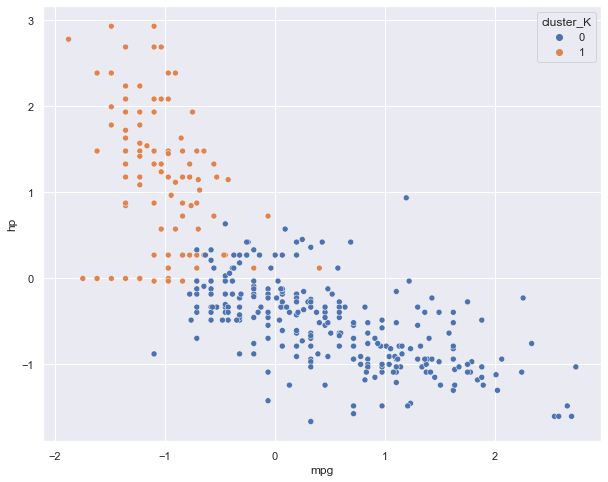

In [670]:
#plotting the clusters
plt.figure(figsize=(10, 8))
sns.scatterplot(x="mpg", y="hp", hue="cluster_K",
              data=cark_z1, 
                   );

In [671]:
carh=cdata.copy()
carh.head()
carh.drop(['origin'],axis=1,inplace=True)

In [672]:
carh['clusters_H']=clusters
carh.clusters_H.value_counts().sort_index()

1    298
2    100
Name: clusters_H, dtype: int64

In [673]:
cark.cluster_K.value_counts().sort_index()

0    272
1    126
Name: cluster_K, dtype: int64

In [674]:
carh.shape

(398, 8)

In [675]:
cark.shape

(398, 8)

In [676]:
cark.head()

,mpg,cyl,disp,hp,wt,acc,yr,cluster_K
0,18.0,8,307.0,130.0,3504,12.0,70,1
1,15.0,8,350.0,165.0,3693,11.5,70,1
2,18.0,8,318.0,150.0,3436,11.0,70,1
3,16.0,8,304.0,150.0,3433,12.0,70,1
4,17.0,8,302.0,140.0,3449,10.5,70,1


In [677]:
carh.head()

,mpg,cyl,disp,hp,wt,acc,yr,clusters_H
0,18.0,8,307.0,130.0,3504,12.0,70,2
1,15.0,8,350.0,165.0,3693,11.5,70,2
2,18.0,8,318.0,150.0,3436,11.0,70,2
3,16.0,8,304.0,150.0,3433,12.0,70,2
4,17.0,8,302.0,140.0,3449,10.5,70,2


In [678]:
#Share your insights about the difference in using these two methods. 


K- Means:

1.In k-means clustering, the number of clusters are taken from initially and then finalized on the basis of the silhouette_coefficients.

2.The greater the silhouette_coefficients, the better the k- value.

3.The k-values and their silhouette_coefficients are plotted in a graph and then with the help of elbow method, the value of optimal k can be determined.

4.The k-means clustering is applied on standardized data and hence, the data is scaled before clustering.

Hierarchial Clustering:

1.In hierarchial clustering number of clusters are not decided initially.

2.The number of clusters could be found by scaling the data first and then finding the linkage method and dendogram.

3.The dendograms are based on the linkage method, it can be average,complete,ward.

4.The dendogram which has the highest cophenet index is to be considered as the best.

5.The number of clusters are then determined from that best dendogram and then the cluster label is added to the scaled data and the original data to view which cluster is assigned to which data.


In [679]:
#5.Answer below questions based on outcomes of using ML based methods. 

In [680]:
#Mention how many optimal clusters are present in the data and what could be the possible reason behind it.


From the pair plot, it is evident that their might be 3 clusters but, while performing the hierarchial clustering it was evident that there are 2 optimal clusters/groups with their cophenet index and liinkage method.
while performing the K-means clustering, it was evident from the elbow method plot that the optimal number of custers are 2 and it was also having the highest silhouette score when k=2. hence, the optimal number of clusters is 2.

In [681]:

#Use linear regression model on different clusters separately and print the coefficients of the models individually
#Linear regression on the original dataset
cdata.head()
X=cdata.drop(['mpg','origin'],axis=1)
y=cdata[['mpg']]

In [682]:
# Split X and y into training and test set in 70:30 ratio
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=15)

In [683]:
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

In [684]:
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_model.coef_[0][idx]))

The coefficient for cyl is -0.027050174356684137
The coefficient for disp is -0.001006340568754949
The coefficient for hp is -0.03233081294005177
The coefficient for wt is -0.0055347517372088244
The coefficient for acc is -0.15675806068446405
The coefficient for yr is 0.7230748314130796


In [685]:
intercept = regression_model.intercept_[0]
print("The intercept for our model is {}".format(intercept))

The intercept for our model is -8.986296964097598


In [686]:
regression_model.score(X_train, y_train)

0.815954865051268

In [687]:
score=regression_model.score(X_test, y_test)
print("Score on testing data:",score)

Score on testing data: 0.8095363092045893


In [688]:
#Linear regression on data with k-means clustering
#renaming the cluster labels to light and heavy vehicles and creating dummy variables of it
cark['cluster_K']=cark['cluster_K'].astype('category')
cark['cluster_K'] = cark['cluster_K'].replace({1: 'heavy', 0: 'light'})
cark = pd.get_dummies(cark, columns=['cluster_K'])

In [689]:
cark.head()

,mpg,cyl,disp,hp,wt,acc,yr,cluster_K_heavy,cluster_K_light
0,18.0,8,307.0,130.0,3504,12.0,70,1,0
1,15.0,8,350.0,165.0,3693,11.5,70,1,0
2,18.0,8,318.0,150.0,3436,11.0,70,1,0
3,16.0,8,304.0,150.0,3433,12.0,70,1,0
4,17.0,8,302.0,140.0,3449,10.5,70,1,0


In [690]:
X = cark.drop(['mpg'], axis=1)
# the dependent variable
y = cark[['mpg']]

In [691]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=12)

In [692]:
regression_modelH = LinearRegression()
regression_modelH.fit(X_train, y_train)

LinearRegression()

In [693]:
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_modelH.coef_[0][idx]))

The coefficient for cyl is -0.20769403135743342
The coefficient for disp is 0.0005066018802027277
The coefficient for hp is -0.03995030355445024
The coefficient for wt is -0.005863859383734894
The coefficient for acc is -0.1869314366798255
The coefficient for yr is 0.7649316286178254
The coefficient for cluster_K_heavy is 0.7256515294440741
The coefficient for cluster_K_light is -0.7256515294440739


In [694]:
interceptH = regression_modelH.intercept_[0]
print("The intercept for our model is {}".format(interceptH))

The intercept for our model is -9.01381056622261


In [695]:
regression_modelH.score(X_train, y_train)

0.8004525903051514

In [696]:
Kscore=regression_modelH.score(X_test, y_test)
print("Score on testing data with k-means clustering:",Kscore)

Score on testing data with k-means clustering: 0.8487533679882507


In [697]:
#Linear regression on data with H-clusters
#renaming the cluster labels to light and heavy vehicles and creating summy variable of it
#renaming the cluster labels to light and heavy vehicles and creating summy variable of it



In [698]:
carh.head()

,mpg,cyl,disp,hp,wt,acc,yr,clusters_H
0,18.0,8,307.0,130.0,3504,12.0,70,2
1,15.0,8,350.0,165.0,3693,11.5,70,2
2,18.0,8,318.0,150.0,3436,11.0,70,2
3,16.0,8,304.0,150.0,3433,12.0,70,2
4,17.0,8,302.0,140.0,3449,10.5,70,2


In [699]:
carh['clusters_H']=clusters

In [700]:
carh['clusters_H']=carh['clusters_H'].astype('category')
carh['clusters_H'] = carh['clusters_H'].replace({1: 'heavy', 2: 'light'})
carh = pd.get_dummies(carh, columns=['clusters_H'])

In [701]:
carh.head()

,mpg,cyl,disp,hp,wt,acc,yr,clusters_H_heavy,clusters_H_light
0,18.0,8,307.0,130.0,3504,12.0,70,0,1
1,15.0,8,350.0,165.0,3693,11.5,70,0,1
2,18.0,8,318.0,150.0,3436,11.0,70,0,1
3,16.0,8,304.0,150.0,3433,12.0,70,0,1
4,17.0,8,302.0,140.0,3449,10.5,70,0,1


In [702]:
X = carh.drop(['mpg','clusters_H_light','clusters_H_heavy'], axis=1)
# the dependent variable
y = carh[['mpg']]

In [703]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=10)

In [704]:
regression_modelH = LinearRegression()
regression_modelH.fit(X_train, y_train)

LinearRegression()

In [705]:
for idx, col_name in enumerate(X_train.columns):
    print("The coefficient for {} is {}".format(col_name, regression_modelH.coef_[0][idx]))

The coefficient for cyl is 0.011340750084725645
The coefficient for disp is -0.0009599260124935622
The coefficient for hp is -0.04132327792306
The coefficient for wt is -0.005497778477317895
The coefficient for acc is -0.18626320935465931
The coefficient for yr is 0.6961987728396881


In [706]:
interceptH = regression_modelH.intercept_[0]
print("The intercept for our model is {}".format(interceptH))

The intercept for our model is -5.7544673973042855


In [707]:
regression_modelH.score(X_train, y_train)

0.8084460787157617

In [708]:
ScoreH=regression_modelH.score(X_test, y_test)
print("Score on test data with Hierarchial:",ScoreH)

Score on test data with Hierarchial: 0.8246459388315992


In [709]:
modellists = []
modellists.append(['Linear Regression on Original Data set', score*100])
modellists.append(['Linear Regression with K means clusters',Kscore*100])
modellists.append(['Linear Regression with Heirarchical clusters', ScoreH*100])
mdl_df = pd.DataFrame(modellists, columns = ['Model','Score on Test'])
mdl_df


,Model,Score on Test
0,Linear Regression on Original Data set,80.953631
1,Linear Regression with K means clusters,84.875337
2,Linear Regression with Heirarchical clusters,82.464594


From the above scores of test data, it can be determined that the Linear regression performed with K-means clustering has the higest accuracy than the linear regression with hierarchial clustering and linear regression performed on original dataset without any clustering.

In [710]:
#How  using  different  models  for  different  clusters  will  be  helpful  in  this  case  and  how  it  will  be  different  than  using  one  single  model  without clustering? Mention how it impacts performance and prediction



From the above, it is clearly evident that the linear regression performed with k-clusters that are from the k-means clustering is having an accuracy of about 85% and the linear regression performed with H-clusters and Hierarchial clustering is having an accuracy of about 82.4%.
For the k-means clustering, we have considered that k=2 as it is having the highest silhouette score than k=3 or 4. For the hierarchial clustering, the number of optimal clusters are considered as 2 with the help of the dendogram and cophenet coefficient.

In [711]:
#6. Improvization

In [712]:
#Detailed  suggestions  or  improvements  or  on  quality,  quantity,  variety,  velocity,  veracity  etc.  on  the  data  points  collected  by  the  company    to perform a better data analysis in future

Conclusion

1.It is observed that the optimal number of clusters/groups for both hierarchial and k-means clustering is 2.

2.By comparing the accuracies of linear regression with original dataset, with k-means clustering and with hierarchial clustering it can be observed that linear regression with k-means clustering has the highest accuracy with 85%.

3.From the pair plot, it can be observed that many attributes has linear relationship with many other attributes but, mpg has no relationship with acc.

4.There are many missing values in 'hp'.

observations-

1. The mpg column for the different brand names are a suspect. It is observed that there are values much larger than the factory values for thosecars. Definition of mpg too may have to be looked at. 
    
2. The weight of the car too is a suspect as they differed from the specifications for those models. There are different types of weights. Was the data collected consistently

3. The HP column too had values different from the factory specifications. There are different types of HP values. Was the a standard definition followed

Suggestions-

1. For those instances where the declared mpg is greater than factory mpg, replace with factory mpg. Similarly for other columns. When this was done the standard distribution for the mpg column fell by 50%

2. There are few attributes such as 'acc' which does not have any relationship with the target variable mpg. hence, they can be replaced with other attributes which has a linear relationship with the target variable.

3.The dataset consists of many missing values in the 'hp' column. hence, they can be replaced for the better analysis of the data.


In [713]:
#Part-2
#Loading the required packages
import numpy as np   
import pandas as pd    
import matplotlib.pyplot as plt 
import seaborn as sns
%matplotlib inline 

In [714]:
#importing tha data
codata=pd.ExcelFile('Part2 - Company.xlsx',engine='openpyxl')
codata.sheet_names
codata = codata.parse("Sheet1")
codata.head()


,A,B,C,D,Quality
0,47,27,45,108,Quality A
1,174,133,134,166,Quality B
2,159,163,135,131,NaN
3,61,23,3,44,Quality A
4,59,60,9,68,Quality A


In [715]:
codata.info()    #it represents information of the dataset

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   A        61 non-null     int64 
 1   B        61 non-null     int64 
 2   C        61 non-null     int64 
 3   D        61 non-null     int64 
 4   Quality  43 non-null     object
dtypes: int64(4), object(1)
memory usage: 2.5+ KB


In [716]:
#shape of the data
codata.shape

(61, 5)

In [717]:
#size of the data
codata.size

305

In [718]:
codata.isnull().sum()   #checking for missing values

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

In [719]:
#make a copy of the data
codata1=codata.copy()

In [720]:
#dropping the target variable
codata=codata.drop('Quality',axis=1)

In [721]:
#data type of each attribute
codata.dtypes

A    int64
B    int64
C    int64
D    int64
dtype: object

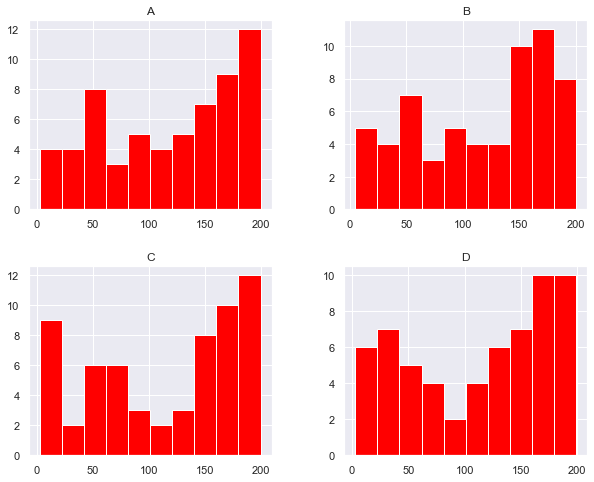

In [722]:
#checking the distribution of the datapoints 
codata.hist(bins = 10, figsize = (10, 8), color = 'red')
plt.show()

D:\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

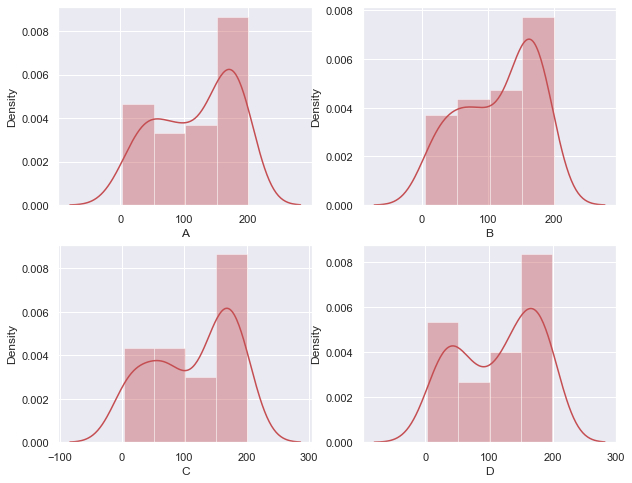

In [723]:
#checking for the density of the variable
plt.figure(figsize=(10, 8))
col = 1
for i in codata.columns:
    plt.subplot(2, 2, col)
    sns.distplot(codata[i], color = 'r')
    col += 1 

In [724]:
#checking for outliers
columns4=['A','B','C','D']
for col in columns4:
    #getting upper lower quartile values
    q25,q75=np.percentile(codata[col],25),np.percentile(codata[col],75)
    IQR1=q75-q25
    Threshold1=IQR1*1.5
    lower1,upper1=q25-Threshold1,q75+Threshold1
    Outliers3=[i for i in codata[col] if i < lower1 or i > upper1]
    print('{} Total Number of outliers in {} Before Imputing : {}'.format('\033[1m',col,len(Outliers3)))
    print('\n')
    #taking mean of a column without considering outliers
    codata_mean = codata.loc[(codata[col] >= lower1) & (codata[col] <= upper1)]
    mean2=int(codata_mean[col].mean())
    print('{} Mean of {} is {}'.format('\033[1m',col,mean2))
    print('\n')
    #imputing  the outliers with the mean
    codata[col]=np.where(codata[col]>upper1,mean2,codata[col])
    codata[col]=np.where(codata[col]<lower1,mean2,codata[col])
    Outliers3=[i for i in codata[col] if i < lower1 or i > upper1]
    print('{} Total Number of outliers in {} After Imputing : {}'.format('\033[1m',col,len(Outliers3)))  
    print('\n')


 Total Number of outliers in A Before Imputing : 0


 Mean of A is 118


 Total Number of outliers in A After Imputing : 0


 Total Number of outliers in B Before Imputing : 0


 Mean of B is 116


 Total Number of outliers in B After Imputing : 0


 Total Number of outliers in C Before Imputing : 0


 Mean of C is 114


 Total Number of outliers in C After Imputing : 0


 Total Number of outliers in D Before Imputing : 0


 Mean of D is 114


 Total Number of outliers in D After Imputing : 0




Hence, from above it can be determined that there are no outliers.

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='A', ylabel='count'>

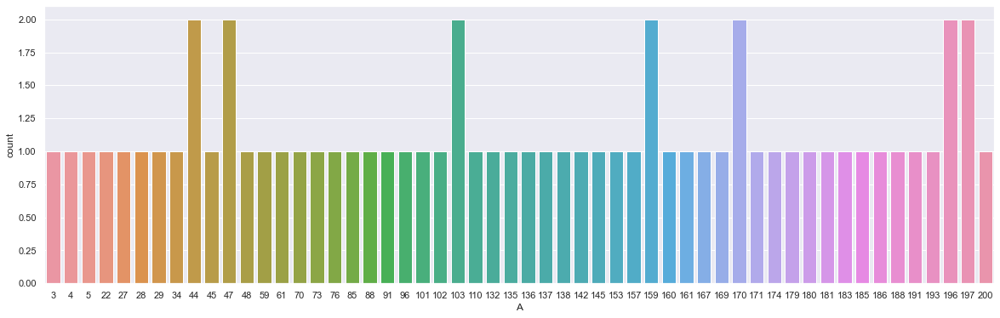

In [725]:
#count plot for A, B, C, D
#A
plt.figure(figsize=(20,6))
sns.countplot(codata['A'])

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='B', ylabel='count'>

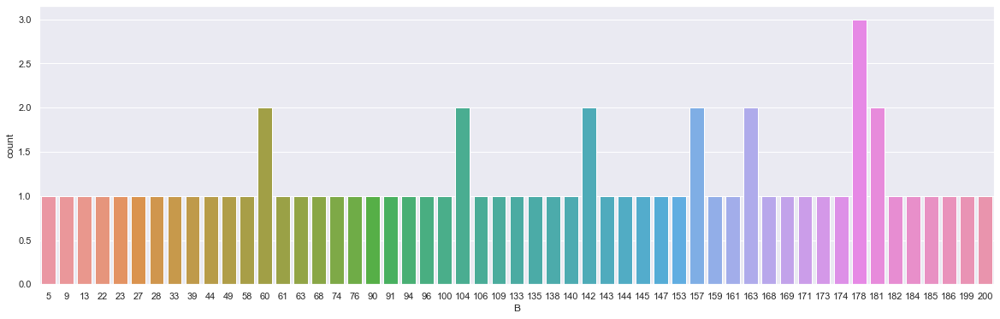

In [726]:
#B
plt.figure(figsize=(20,6))
sns.countplot(codata['B'])

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='C', ylabel='count'>

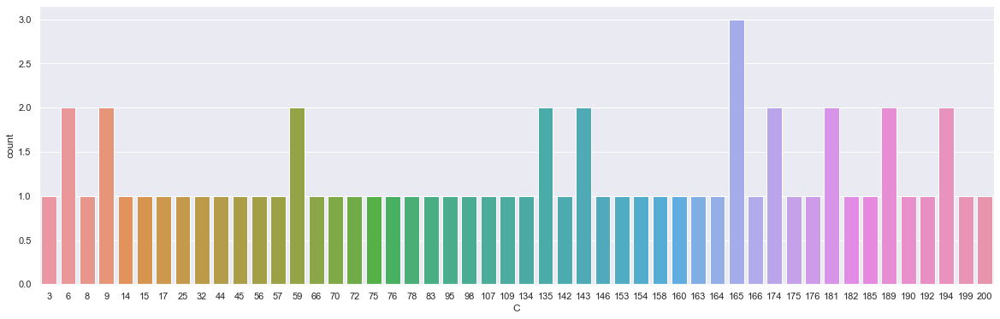

In [727]:
#C
plt.figure(figsize=(20,6))
sns.countplot(codata['C'])

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='D', ylabel='count'>

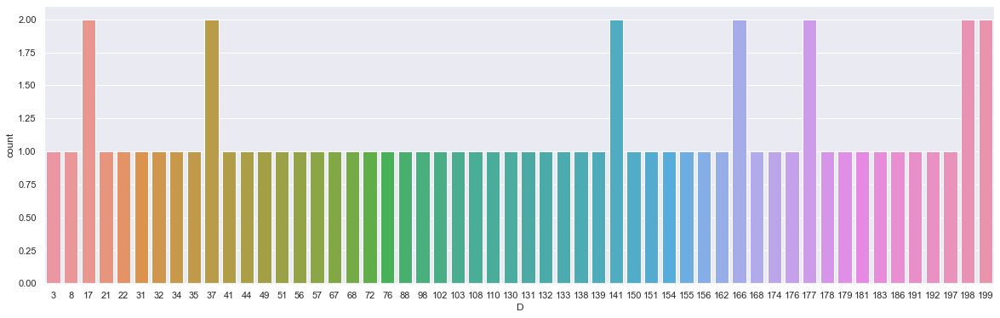

In [728]:
#D
plt.figure(figsize=(20,6))
sns.countplot(codata['D'])

In [729]:
#scaling the numeric variables
data = codata.apply(zscore)
data.head()

,A,B,C,D
0,-1.168034,-1.561080,-1.061569,-0.103138
1,0.904992,0.284923,0.306077,0.823013
2,0.660147,0.807376,0.321443,0.264129
3,-0.939512,-1.630740,-1.706975,-1.125099
4,-0.972158,-0.986381,-1.614775,-0.741864


In [730]:
#checking for the distribution of the target variables
codata1['Quality'].value_counts()

Quality A    26
Quality B    17
Name: Quality, dtype: int64

In [731]:
#applying kmeans with 2 centroids
k_means = KMeans(n_clusters = 2)
k_means.fit(data)
label = k_means.labels_

In [732]:
# Calculating silhouette_score
score=silhouette_score(data,label)
print("The silhouette score is:",score)

The silhouette score is: 0.6891674125195145


In [733]:
#attaching the cluster labels to the original dataset
codata1["Quality_k"] = label


In [734]:
#checking for the head observations
codata1.head(10)

,A,B,C,D,Quality,Quality_k
0,47,27,45,108,Quality A,0
1,174,133,134,166,Quality B,1
2,159,163,135,131,NaN,1
3,61,23,3,44,Quality A,0
4,59,60,9,68,Quality A,0
5,153,140,154,199,NaN,1
6,34,28,78,22,Quality A,0
7,191,144,143,154,NaN,1
8,160,181,194,178,Quality B,1
9,145,178,158,141,NaN,1


In [735]:
#renaming the cluster variables
codata1['Quality_k'] = codata1['Quality_k'].replace({0: 'Quality A', 1: 'Quality B'})

In [736]:
#checking the datatypes of the dataset codata1
codata1.dtypes

A             int64
B             int64
C             int64
D             int64
Quality      object
Quality_k    object
dtype: object

In [737]:
#checking for the null values and creating a new dataset without the null values
codata1.isnull().sum()

A             0
B             0
C             0
D             0
Quality      18
Quality_k     0
dtype: int64

In [738]:
cod=codata1.dropna()

In [739]:
cod.head()

,A,B,C,D,Quality,Quality_k
0,47,27,45,108,Quality A,Quality A
1,174,133,134,166,Quality B,Quality B
3,61,23,3,44,Quality A,Quality A
4,59,60,9,68,Quality A,Quality A
6,34,28,78,22,Quality A,Quality A


In [740]:
#shape and size of cod
shapec= cod.shape
sizec=cod.size
print("The shape of cod:",shapec)
print("The Size of cod:",sizec)

The shape of cod: (43, 6)
The Size of cod: 258


In [741]:
#using the cluster labels and actual target labels and compare themto check for accuracy
predicted = cod['Quality_k']
actual=cod['Quality']

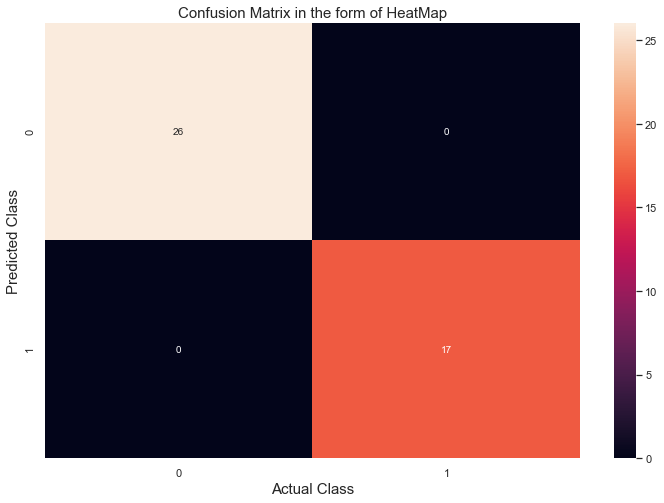

In [742]:
#visualization of confusion matrix in the form of a heatmap
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
cm= confusion_matrix(actual, predicted)
plt.figure(figsize = (12, 8))
sns.heatmap(cm, annot = True, fmt = 'd')
plt.xlabel('Actual Class', fontsize = 15)
plt.ylabel('Predicted Class', fontsize = 15)
plt.title('Confusion Matrix in the form of HeatMap', fontsize = 15);

From the above heatmap, it is clearly evident that there appears to be no misclassification when checking the it with the non missing target variables and the predicted clusters, Hence the new labels can be used as a target variable

In [743]:
#part 3
#Loading the required packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore

In [744]:
#1. Data
#Import, clean and pre-process the data
vehicle=pd.read_csv("Part3 - vehicle.csv")


In [745]:
vehicle.head()   #displays the first 5 elements of the data

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [746]:
#shape of the data
shapev=vehicle.shape
print("Shape of the dataset:",shapev)

Shape of the dataset: (846, 19)


In [747]:
#Size of the dataset
sizev=vehicle.size
print("Size of the dataset:",sizev)

Size of the dataset: 16074


In [748]:
#info of the dataset
vehicle.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

In [749]:
#datatypes of vehicle
vehicle.dtypes

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object

In [750]:
#Duplicated rows
print('Duplicated rows: ', vehicle[vehicle.duplicated()].shape[0])

Duplicated rows:  0


In [751]:
#Checking for missing values
vehicle.isnull().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64

From the above, it can be determined that there are few missing values in the dataset

In [752]:
#Median of the data
vehicle.median()

compactness                     93.0
circularity                     44.0
distance_circularity            80.0
radius_ratio                   167.0
pr.axis_aspect_ratio            61.0
max.length_aspect_ratio          8.0
scatter_ratio                  157.0
elongatedness                   43.0
pr.axis_rectangularity          20.0
max.length_rectangularity      146.0
scaled_variance                179.0
scaled_variance.1              363.5
scaled_radius_of_gyration      173.5
scaled_radius_of_gyration.1     71.5
skewness_about                   6.0
skewness_about.1                11.0
skewness_about.2               188.0
hollows_ratio                  197.0
dtype: float64

In [753]:
#Replacing the null values with the median
#Replacing null values in circularity
vehicle['circularity'].fillna((vehicle['circularity'].median()), inplace=True)



In [754]:
#Replacing null values in distance_circularity with median
vehicle['distance_circularity'].fillna((vehicle['distance_circularity'].median()), inplace=True)
#Replacing radius_ratio null values with its median
vehicle['radius_ratio'].fillna((vehicle['radius_ratio'].median()), inplace=True)


In [755]:
#Replacing the null values of pr.axis_aspect_ratio with its median
vehicle['pr.axis_aspect_ratio'].fillna((vehicle['pr.axis_aspect_ratio'].median()), inplace=True)
#Replacing the null values of scatter_ratio with its median
vehicle['scatter_ratio'].fillna((vehicle['scatter_ratio'].median()), inplace=True)
#Replacing the null values of elongatedness with its median
vehicle['elongatedness'].fillna((vehicle['elongatedness'].median()), inplace=True)
#Replacing the null values of pr.axis_rectangularity with its median
vehicle['pr.axis_rectangularity'].fillna((vehicle['pr.axis_rectangularity'].median()), inplace=True)
#Replacing the null values of scaled_variance with its median
vehicle['scaled_variance'].fillna((vehicle['scaled_variance'].median()), inplace=True)
#Replacing the null values of scaled_variance.1 with its median
vehicle['scaled_variance.1'].fillna((vehicle['scaled_variance.1'].median()), inplace=True)
#Replacing the null values of scaled_radius_of_gyration with its median
vehicle['scaled_radius_of_gyration'].fillna((vehicle['scaled_radius_of_gyration'].median()), inplace=True)
#Replacing the null values of scaled_radius_of_gyration.1 with its median
vehicle['scaled_radius_of_gyration.1'].fillna((vehicle['scaled_radius_of_gyration.1'].median()), inplace=True)
#Replacing the null values of skewness_about with its median
vehicle['skewness_about'].fillna((vehicle['skewness_about'].median()), inplace=True)
#Replacing the null values of skewness_about.1 with its median
vehicle['skewness_about.1'].fillna((vehicle['skewness_about.1'].median()), inplace=True)
#Replacing the null values of skewness_about.2 with its median
vehicle['skewness_about.2'].fillna((vehicle['skewness_about.2'].median()), inplace=True)

In [756]:
#Checking the missing values
vehicle.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

Hence, from the above, it cam be determined that all the missing values are replaced with their respective medians.

In [757]:
#Statistical analysis
# 5 point summary
vehicle.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


From the above, it can be determined that every numerical attribute of the dataset has its count, mean, standard deviation, 25%, min val, mean,75% value and its maximum value in it.

In [758]:
#imputing the outliers with mean
columns8=['compactness','circularity','distance_circularity','radius_ratio','pr.axis_aspect_ratio','max.length_aspect_ratio','scatter_ratio','elongatedness','pr.axis_rectangularity','max.length_rectangularity',
        'scaled_variance','scaled_variance.1','scaled_radius_of_gyration','scaled_radius_of_gyration.1','skewness_about','skewness_about.1',
        'skewness_about.2','hollows_ratio']
for c in columns8:
    #getting upper lower quartile 
    p25,p75=np.percentile(vehicle[c],25),np.percentile(vehicle[c],75) # p25- 25th percentile,p75-75th percentile
    IQR6=p75-p25 #IQR- InterQuartile Range 
    T=IQR*1.5  #threshold
    L,U=p25-T,p75+T  #lower and upper
    Out=[i for i in vehicle[c] if i < L or i > U] #outliers
    print('{}  Number of outliers in {} before imputing : {}'.format('\033[1m',c,len(Out)))
    print('\n')
    #taking mean of a column without outliers
    MWO = vehicle.loc[(vehicle[c] >= L) & (vehicle[c] <= U)] #mean without outliers
    mean2=int(MWO[c].mean()) #mean of the data excluding the outliers
    print('{} Mean of {} is {}'.format('\033[1m',c,mean2))
    print('\n')
    #imputing outliers with mean(replacing outliers with mean)
    vehicle[c]=np.where(vehicle[c]>U,mean2,vehicle[c]) #if greater than upper replace with mean
    vehicle[c]=np.where(vehicle[c]<L,mean2,vehicle[c]) #if less than lower then replace with mean
    Out=[i for i in vehicle[c] if i < L or i > U]
    print('{} Number of outliers in {} after imputing : {}'.format('\033[1m',c,len(Out)))  
    print('\n')

  Number of outliers in compactness before imputing : 27


 Mean of compactness is 93


 Number of outliers in compactness after imputing : 0


  Number of outliers in circularity before imputing : 1


 Mean of circularity is 44


 Number of outliers in circularity after imputing : 0


  Number of outliers in distance_circularity before imputing : 95


 Mean of distance_circularity is 82


 Number of outliers in distance_circularity after imputing : 0


  Number of outliers in radius_ratio before imputing : 263


 Mean of radius_ratio is 168


 Number of outliers in radius_ratio after imputing : 0


  Number of outliers in pr.axis_aspect_ratio before imputing : 16


 Mean of pr.axis_aspect_ratio is 61


 Number of outliers in pr.axis_aspect_ratio after imputing : 0


  Number of outliers in max.length_aspect_ratio before imputing : 11


 Mean of max.length_aspect_ratio is 8


 Number of outliers in max.length_aspect_ratio after imputing : 0


  Number of outliers in scatter_ratio befor

Hence, from the above it is clearly evident that all the outliers of the data are replaced with their means

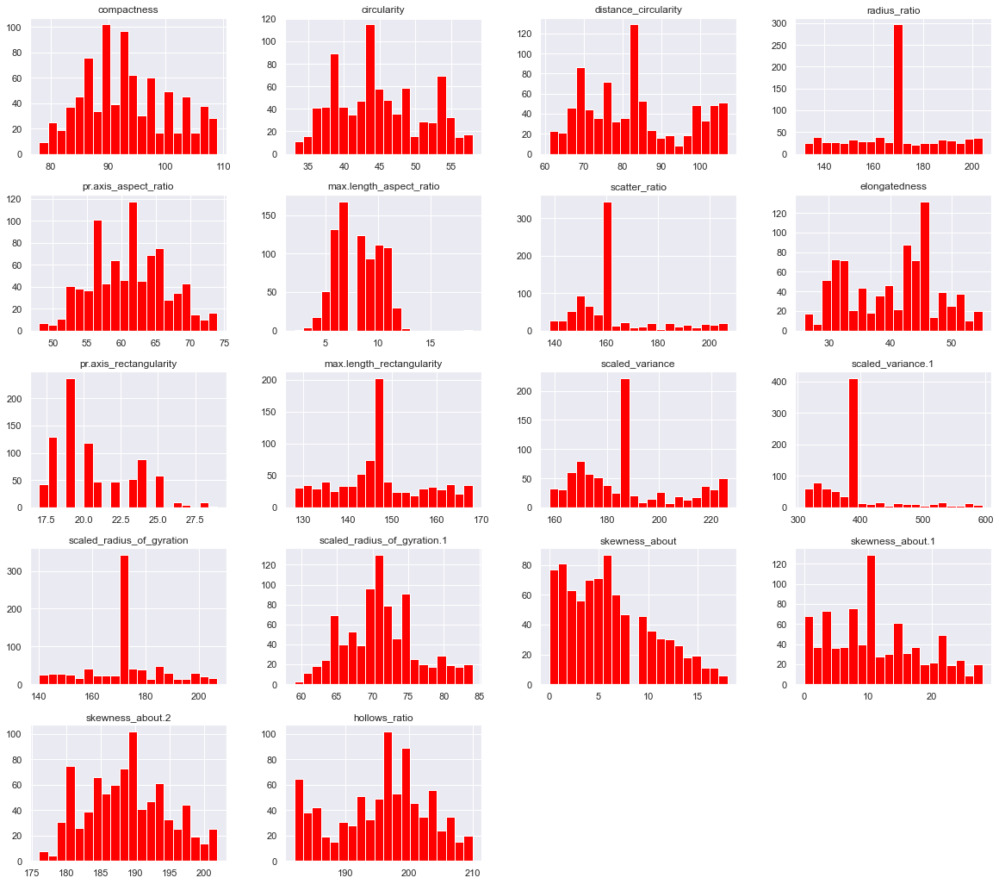

In [759]:
#plotting the distribution of the numerical variables
vehicle.hist(bins = 20, figsize = (20, 18), color = 'red')
plt.show()

From the above plot, it can be determined that the data is approximately normally distributed for the numeric attributes after replacing the outliers.

D:\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
D:\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings

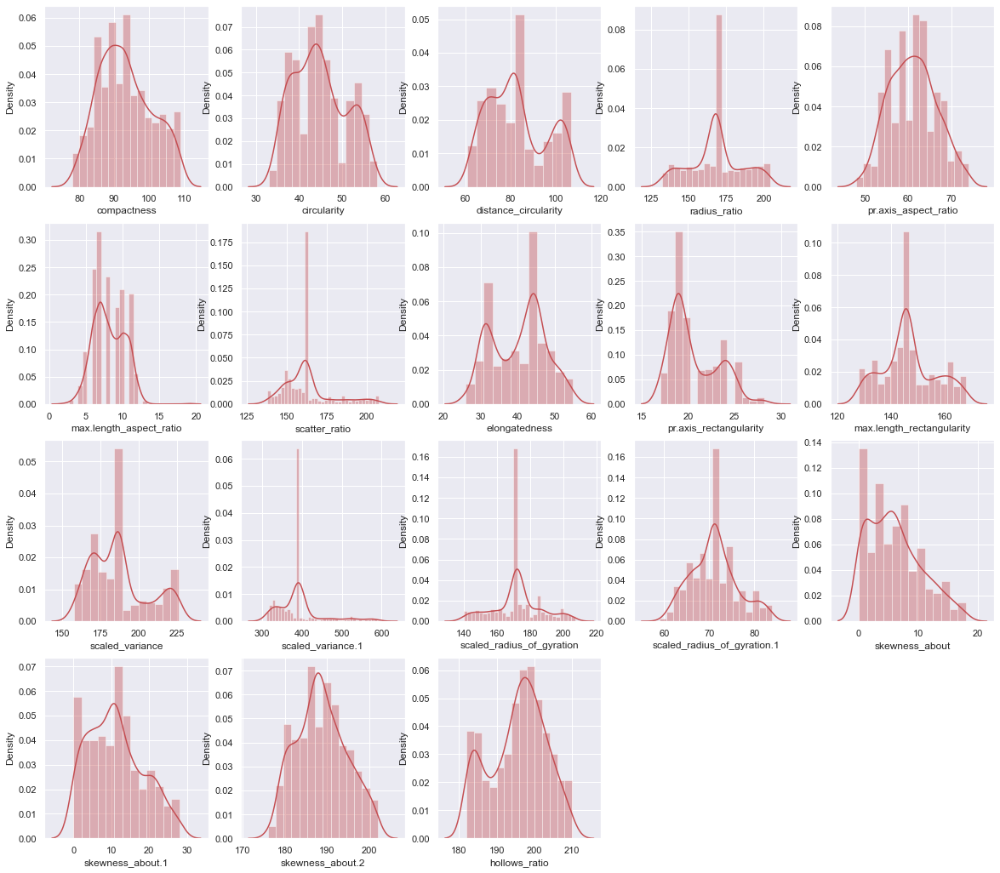

In [760]:
#Density plots
plt.figure(figsize=(20, 18))
col = 1
for i in vehicle.drop(columns='class').columns:
    plt.subplot(4, 5, col)
    sns.distplot(vehicle[i], color = 'r')
    col += 1 

From the above density plot, it can be determined that the plots are not skewed after replacing the outliers with mean.

In [761]:
#mean
print("Data mean:",vehicle.mean())
#median
print("Data Median:",vehicle.median())
#data quantile (25%)
print("Data quantile(25%):",vehicle.quantile(q=0.25)) 
#data quantile (50%)
print("Data quantile(50%):",vehicle.quantile(q=0.50)) 
#data quantile (75%)
print("Data quantile(75%):",vehicle.quantile(q=0.75))  

Data mean: compactness                     93.229314
circularity                     44.806147
distance_circularity            82.800236
radius_ratio                   168.121749
pr.axis_aspect_ratio            61.087470
max.length_aspect_ratio          8.124113
scatter_ratio                  162.526005
elongatedness                   40.381797
pr.axis_rectangularity          20.580378
max.length_rectangularity      146.586288
scaled_variance                187.027187
scaled_variance.1              392.047281
scaled_radius_of_gyration      172.215130
scaled_radius_of_gyration.1     71.117021
skewness_about                   6.086288
skewness_about.1                11.244681
skewness_about.2               188.735225
hollows_ratio                  195.589835
dtype: float64
Data Median: compactness                     93.0
circularity                     44.0
distance_circularity            82.0
radius_ratio                   168.0
pr.axis_aspect_ratio            61.0
max.length_aspect_ra

In [762]:
#range for all attributes
df2=vehicle[['compactness','circularity','distance_circularity','radius_ratio','pr.axis_aspect_ratio','max.length_aspect_ratio','scatter_ratio','elongatedness','pr.axis_rectangularity','max.length_rectangularity',
        'scaled_variance','scaled_variance.1','scaled_radius_of_gyration','scaled_radius_of_gyration.1','skewness_about','skewness_about.1',
        'skewness_about.2','hollows_ratio']]
df2
print('Range of data:',df2.max()-df2.min())
df2.info()

Range of data: compactness                     31.0
circularity                     25.0
distance_circularity            46.0
radius_ratio                    72.0
pr.axis_aspect_ratio            26.0
max.length_aspect_ratio         17.0
scatter_ratio                   69.0
elongatedness                   29.0
pr.axis_rectangularity          12.0
max.length_rectangularity       40.0
scaled_variance                 68.0
scaled_variance.1              285.0
scaled_radius_of_gyration       67.0
scaled_radius_of_gyration.1     25.0
skewness_about                  18.0
skewness_about.1                28.0
skewness_about.2                26.0
hollows_ratio                   28.0
dtype: float64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity         

In [763]:
#variance
print('variance:',df2.var())

variance: compactness                      56.243211
circularity                      37.391962
distance_circularity            163.390817
radius_ratio                    308.762674
pr.axis_aspect_ratio             29.637310
max.length_aspect_ratio           4.444933
scatter_ratio                   227.229500
elongatedness                    52.070627
pr.axis_rectangularity            6.700632
max.length_rectangularity        99.823906
scaled_variance                 342.949556
scaled_variance.1              3245.566401
scaled_radius_of_gyration       209.022895
scaled_radius_of_gyration.1      26.710550
skewness_about                   20.126273
skewness_about.1                 52.149528
skewness_about.2                 35.300225
hollows_ratio                    53.712039
dtype: float64


In [764]:
#standard deviation
print('std:',df2.std())

std: compactness                     7.499547
circularity                     6.114897
distance_circularity           12.782442
radius_ratio                   17.571644
pr.axis_aspect_ratio            5.444016
max.length_aspect_ratio         2.108301
scatter_ratio                  15.074133
elongatedness                   7.215998
pr.axis_rectangularity          2.588558
max.length_rectangularity       9.991191
scaled_variance                18.518897
scaled_variance.1              56.969873
scaled_radius_of_gyration      14.457624
scaled_radius_of_gyration.1     5.168225
skewness_about                  4.486232
skewness_about.1                7.221463
skewness_about.2                5.941399
hollows_ratio                   7.328850
dtype: float64


In [765]:
#covariance
df2.cov()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,56.243211,29.613737,65.226928,63.508143,9.872226,7.429493,54.878053,-40.305407,14.897523,35.264213,79.293167,164.420506,31.541733,-7.981304,5.084331,8.071635,14.484457,20.736772
circularity,29.613737,37.391962,52.233419,36.034280,7.099817,7.091544,30.145875,-34.370870,13.313825,41.985978,59.008827,63.984324,42.112759,3.936321,3.590712,0.574116,-2.865590,2.393767
distance_circularity,65.226928,52.233419,163.390817,100.122575,11.120453,13.089911,107.385674,-73.385179,26.017851,62.359861,163.765201,303.986971,46.385630,-4.691389,4.875246,13.450120,3.922193,17.291931
radius_ratio,63.508143,36.034280,100.122575,308.762674,23.101764,5.981321,120.774937,-73.148314,21.984877,38.494216,166.044023,472.605479,42.643600,-15.166927,5.189482,11.015145,27.589671,28.525736
pr.axis_aspect_ratio,9.872226,7.099817,11.120453,23.101764,29.637310,1.985581,17.029675,-10.605033,2.591778,6.554574,20.013004,57.575149,11.979977,-6.028591,-1.590989,-0.124386,13.640939,16.710476
max.length_aspect_ratio,7.429493,7.091544,13.089911,5.981321,1.985581,4.444933,7.486118,-6.310164,2.611906,9.649041,14.729166,14.650338,8.668534,-2.334659,0.668568,1.883205,1.222250,6.215464
scatter_ratio,54.878053,30.145875,107.385674,120.774937,17.029675,7.486118,227.229500,-55.253136,16.944061,50.156333,188.970298,612.267408,44.867180,-14.406597,1.065801,9.345701,22.456598,26.601803
elongatedness,-40.305407,-34.370870,-73.385179,-73.148314,-10.605033,-6.310164,-55.253136,52.070627,-17.202914,-37.137717,-90.603292,-158.506239,-39.292292,0.357636,-2.148960,-9.497079,-4.446719,-9.298836
pr.axis_rectangularity,14.897523,13.313825,26.017851,21.984877,2.591778,2.611906,16.944061,-17.202914,6.700632,13.849861,30.188936,45.733473,13.354285,0.623719,0.855186,3.460191,0.085213,2.052534
max.length_rectangularity,35.264213,41.985978,62.359861,38.494216,6.554574,9.649041,50.156333,-37.137717,13.849861,99.823906,62.068066,99.746803,70.342953,4.110601,5.432190,2.490696,-2.877718,5.918866


In [766]:
#correlation
df2.corr()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.645757,0.680422,0.481928,0.241802,0.469885,0.485435,-0.744787,0.767399,0.470632,0.570934,0.384836,0.290907,-0.205919,0.151118,0.149039,0.325071,0.377286
circularity,0.645757,1.000000,0.668260,0.335362,0.213274,0.550071,0.327044,-0.778942,0.841116,0.687223,0.521090,0.183670,0.476352,0.124555,0.130891,0.013001,-0.078874,0.053414
distance_circularity,0.680422,0.668260,1.000000,0.445765,0.159805,0.485725,0.557314,-0.795606,0.786321,0.488286,0.691819,0.417442,0.250999,-0.071014,0.085016,0.145709,0.051645,0.184584
radius_ratio,0.481928,0.335362,0.445765,1.000000,0.241498,0.161455,0.455966,-0.576893,0.483341,0.219263,0.510265,0.472108,0.167859,-0.167011,0.065831,0.086807,0.264268,0.221508
pr.axis_aspect_ratio,0.241802,0.213274,0.159805,0.241498,1.000000,0.172996,0.207517,-0.269958,0.183916,0.120506,0.198508,0.185640,0.152209,-0.214267,-0.065143,-0.003164,0.421732,0.418826
max.length_aspect_ratio,0.469885,0.550071,0.485725,0.161455,0.172996,1.000000,0.235555,-0.414774,0.478594,0.458073,0.377251,0.121975,0.284391,-0.214264,0.070686,0.123692,0.097575,0.402258
scatter_ratio,0.485435,0.327044,0.557314,0.455966,0.207517,0.235555,1.000000,-0.507958,0.434237,0.333024,0.676934,0.712957,0.205873,-0.184922,0.015760,0.085853,0.250740,0.240792
elongatedness,-0.744787,-0.778942,-0.795606,-0.576893,-0.269958,-0.414774,-0.507958,1.000000,-0.920975,-0.515112,-0.678004,-0.385571,-0.376629,0.009590,-0.066382,-0.182250,-0.103718,-0.175831
pr.axis_rectangularity,0.767399,0.841116,0.786321,0.483341,0.183916,0.478594,0.434237,-0.920975,1.000000,0.535513,0.629760,0.310121,0.356834,0.046622,0.073641,0.185105,0.005541,0.108192
max.length_rectangularity,0.470632,0.687223,0.488286,0.219263,0.120506,0.458073,0.333024,-0.515112,0.535513,1.000000,0.335456,0.175241,0.486975,0.079606,0.121193,0.034521,-0.048478,0.080832


car    429
bus    218
van    199
Name: class, dtype: int64


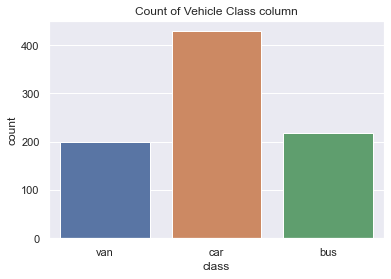

In [767]:
#2. EDA and visualization
#checking the distribution of the class variable
print(vehicle['class'].value_counts())
plt.title('Count of Vehicle Class column')
sns.countplot(x = 'class', data = vehicle);

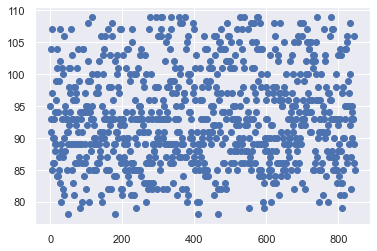

In [768]:
#univariate plot
#scatter plot
#compactness
plt.scatter(vehicle.index,vehicle['compactness']) # scatter plot for continuous data
plt.show()

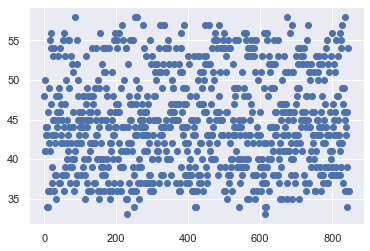

In [769]:
#circularity
plt.scatter(vehicle.index,vehicle['circularity']) # scatter plot for continuous data
plt.show()

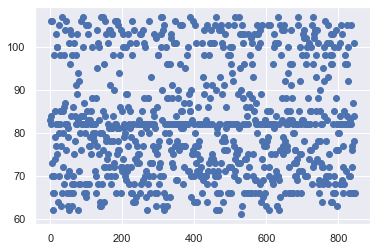

In [770]:
#distance_circularity
plt.scatter(vehicle.index,vehicle['distance_circularity']) # scatter plot for continuous data
plt.show()

D:\anaconda\lib\site-packages\seaborn\distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


<AxesSubplot:xlabel='radius_ratio', ylabel='Density'>

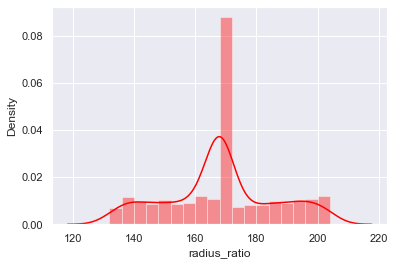

In [771]:
#dist plot
#radius_ratio
#graph for radius_ratio (univariate graph) and it depicts the distribution of the data points.
sns.distplot(vehicle['radius_ratio'],color='Red')

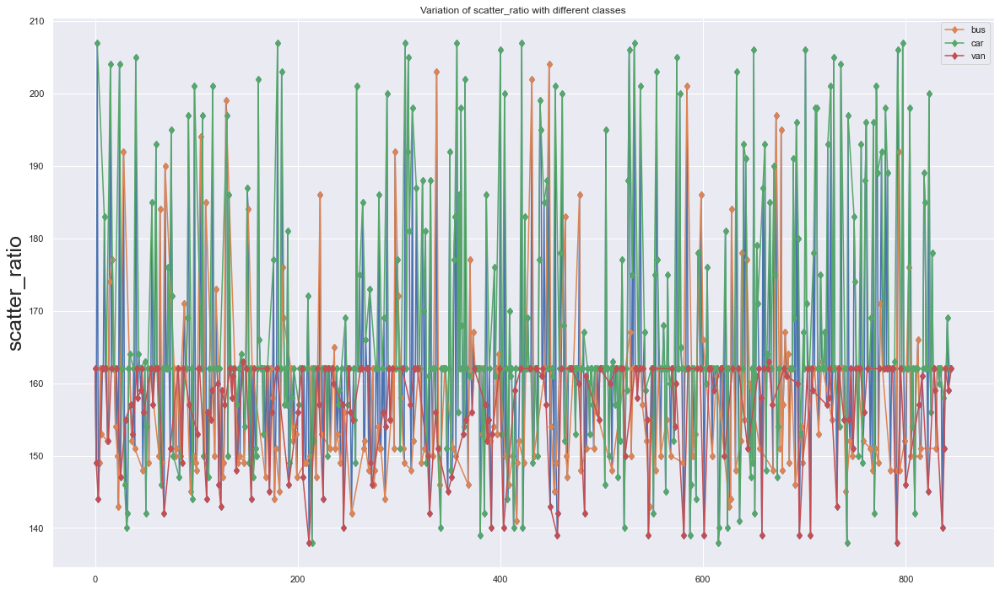

In [772]:
#line plot
# graph- scatter_ratio vs index and hue= Class
plt.figure(figsize=(20,12))
plt.title('Variation of scatter_ratio with different classes')
plt.ylabel('scatter_ratio',fontsize=25)
plt.plot(vehicle.index,vehicle['scatter_ratio'],markevery=1,marker='d')
for name1,group in vehicle.groupby('class'):
    plt.plot(group.index,group['scatter_ratio'],label=name1,markevery=1,marker='d')
plt.legend()
plt.show()

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='elongatedness'>

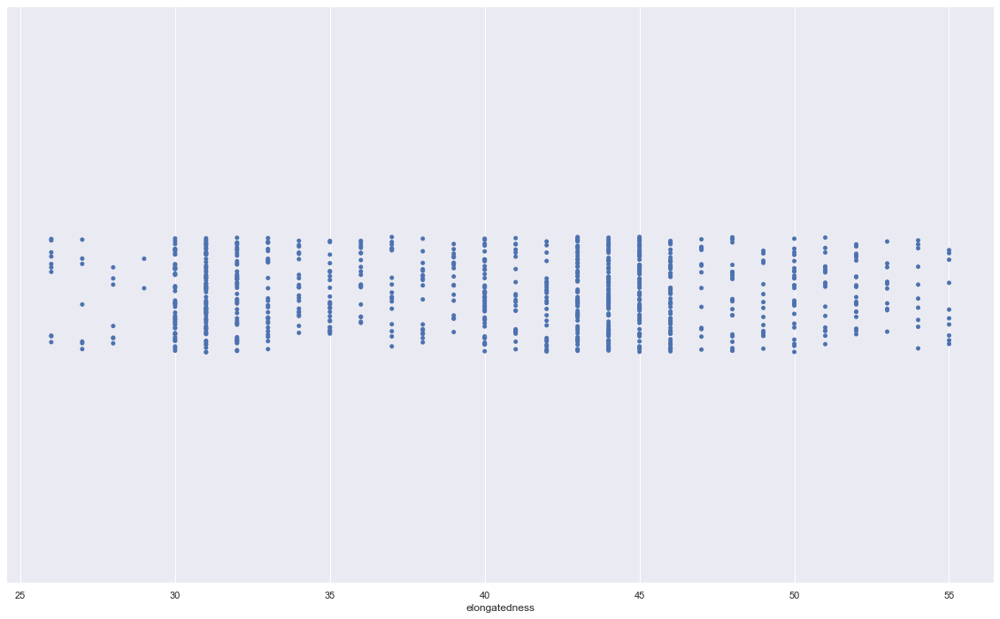

In [773]:
#stripplot
#graph for elongatedness(univariate graph) and it depicts the distribution of the data points.
plt.figure(figsize=(20,12))
sns.stripplot(vehicle['elongatedness'])

<AxesSubplot:xlabel='hollows_ratio'>

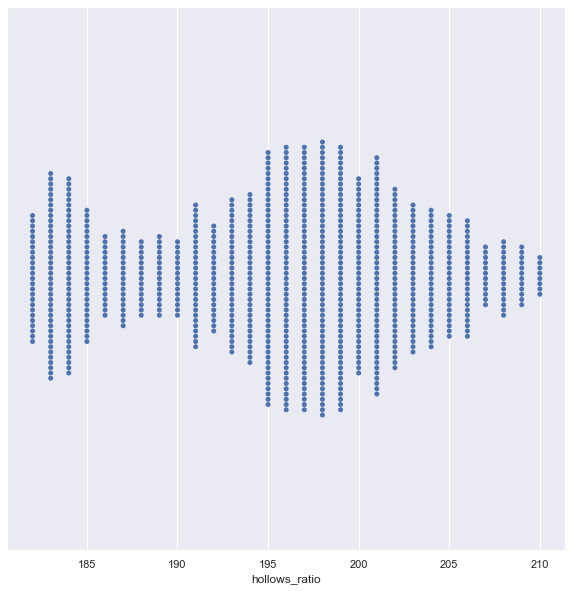

In [774]:
#swarm plot
# hollows_ratio distribution (univariate) 
sns.set(rc={'figure.figsize':(10,10)})
sns.swarmplot(x=vehicle['hollows_ratio'])


(array([158., 119., 141., 147.,  47.,  82.,  61.,  44.,  30.,  17.]),
 array([ 0. ,  1.8,  3.6,  5.4,  7.2,  9. , 10.8, 12.6, 14.4, 16.2, 18. ]),
 <BarContainer object of 10 artists>)

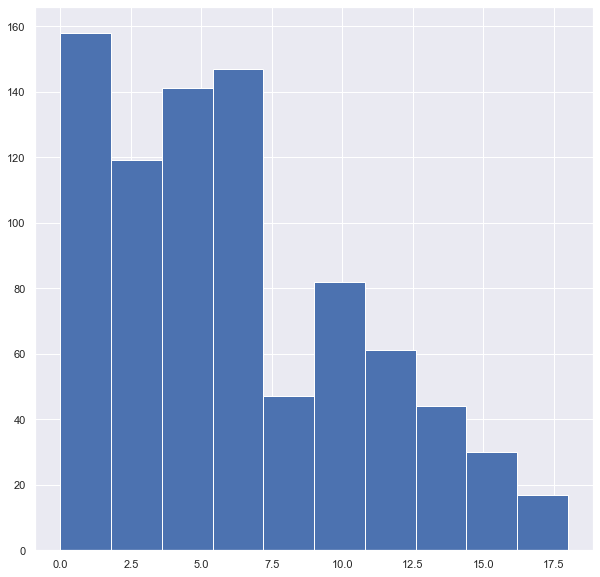

In [775]:
#histogram
plt.hist(x=vehicle['skewness_about']) # distribution of skewness_about

<AxesSubplot:ylabel='Density'>

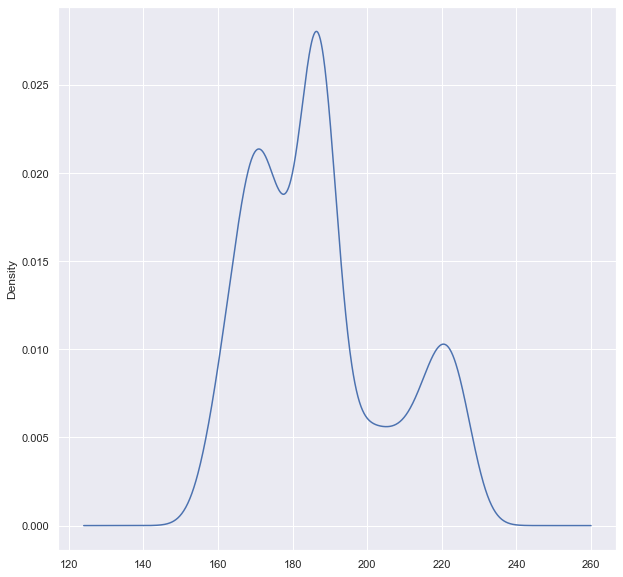

In [776]:
#density plot
plt.figure(figsize=(10,10))
vehicle['scaled_variance'].plot(kind='density')

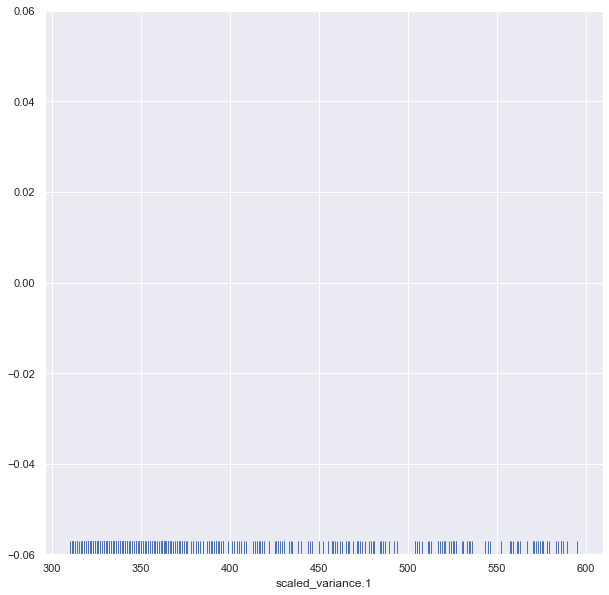

In [777]:
#rug plot
fig,ax=plt.subplots()
sns.rugplot(vehicle['scaled_variance.1'])
plt.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x1ec6b0e2d30>,
 'caps': [<matplotlib.lines.Line2D at 0x1ec6b0f0430>,
 'boxes': [<matplotlib.lines.Line2D at 0x1ec6b0e29d0>],
 'medians': [<matplotlib.lines.Line2D at 0x1ec6b0f0af0>],
 'fliers': [<matplotlib.lines.Line2D at 0x1ec6b0f0e50>],
 'means': []}

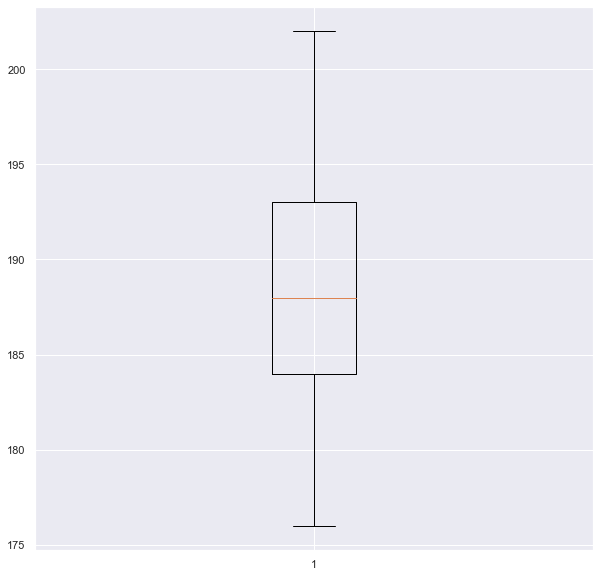

In [778]:
#box plot
plt.boxplot(vehicle['skewness_about.2'])

<AxesSubplot:>

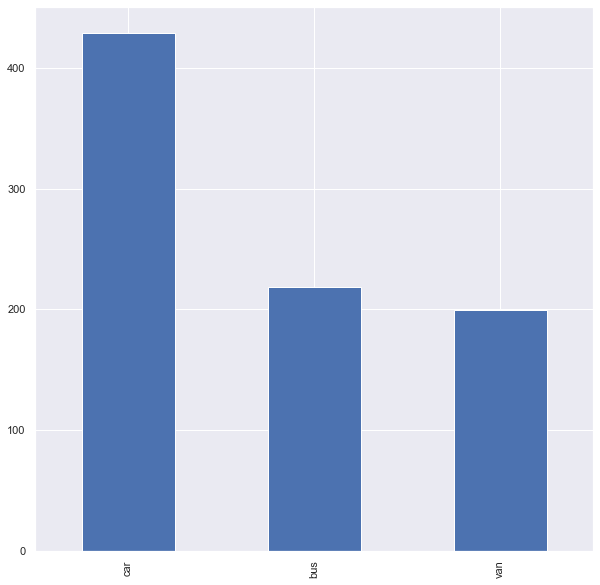

In [779]:
#univariate graphs for categorical variables
#Class
vehicle['class'].value_counts().plot.bar()


From the above plot, it can be determined that cars are more than the bus and van.

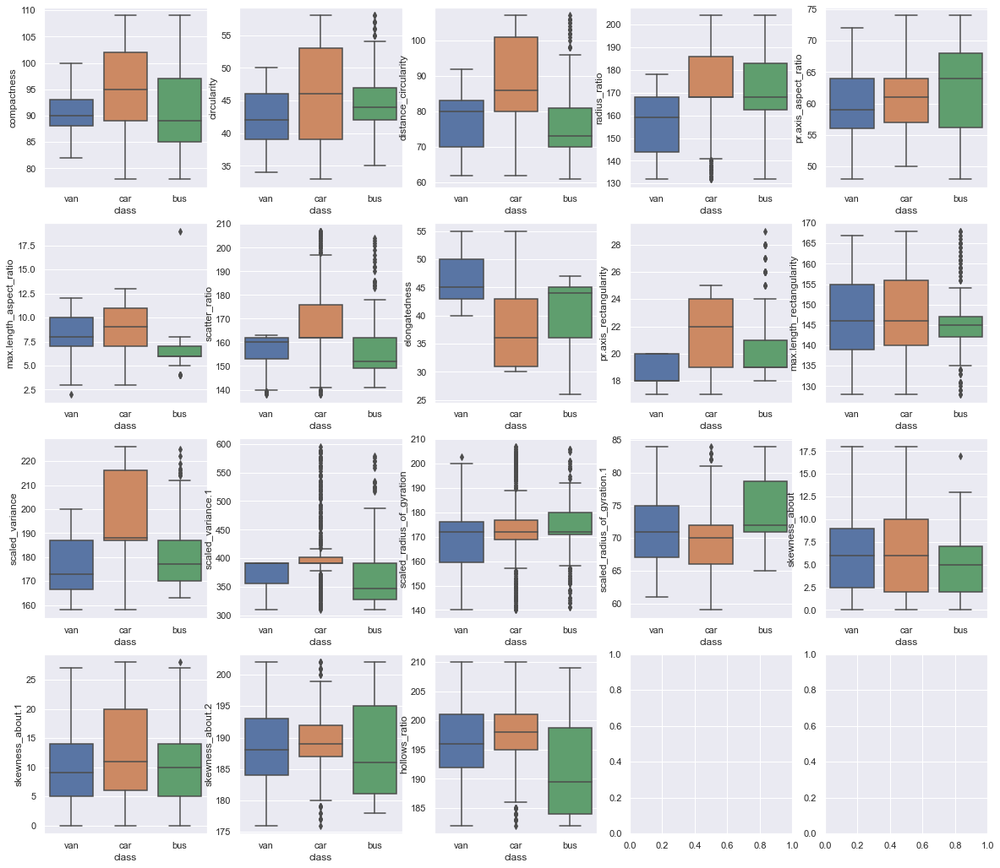

In [780]:
#bivariate plots
ig,axs = plt.subplots(4,5,figsize=(20,18))
sns.boxplot(x="class", y="compactness",data=vehicle,ax=axs[0,0]);
sns.boxplot(x="class", y="circularity",data=vehicle,ax=axs[0,1]);
sns.boxplot(x="class", y="distance_circularity",data=vehicle,ax=axs[0,2]);
sns.boxplot(x="class", y="radius_ratio",data=vehicle,ax=axs[0,3]);
sns.boxplot(x="class", y="pr.axis_aspect_ratio",data=vehicle,ax=axs[0,4]);
sns.boxplot(x="class", y="max.length_aspect_ratio",data=vehicle,ax=axs[1,0]);
sns.boxplot(x="class", y="scatter_ratio",data=vehicle,ax=axs[1,1]);
sns.boxplot(x="class", y="elongatedness",data=vehicle,ax=axs[1,2]);
sns.boxplot(x="class", y="pr.axis_rectangularity",data=vehicle,ax=axs[1,3]);
sns.boxplot(x="class", y="max.length_rectangularity",data=vehicle,ax=axs[1,4]);
sns.boxplot(x="class", y="scaled_variance",data=vehicle,ax=axs[2,0]);
sns.boxplot(x="class", y="scaled_variance.1",data=vehicle,ax=axs[2,1]);
sns.boxplot(x="class", y="scaled_radius_of_gyration",data=vehicle,ax=axs[2,2]);
sns.boxplot(x="class", y="scaled_radius_of_gyration.1",data=vehicle,ax=axs[2,3]);
sns.boxplot(x="class", y="skewness_about",data=vehicle,ax=axs[2,4]);
sns.boxplot(x="class", y="skewness_about.1",data=vehicle,ax=axs[3,0]);
sns.boxplot(x="class", y="skewness_about.2",data=vehicle,ax=axs[3,1]);
sns.boxplot(x="class", y="hollows_ratio",data=vehicle,ax=axs[3,2]);
fig.tight_layout()

From, the above box plots it can be determined that there is a significant different between the values for different classes.For instance, the compactness is greater for the class car.


<AxesSubplot:xlabel='compactness', ylabel='hollows_ratio'>

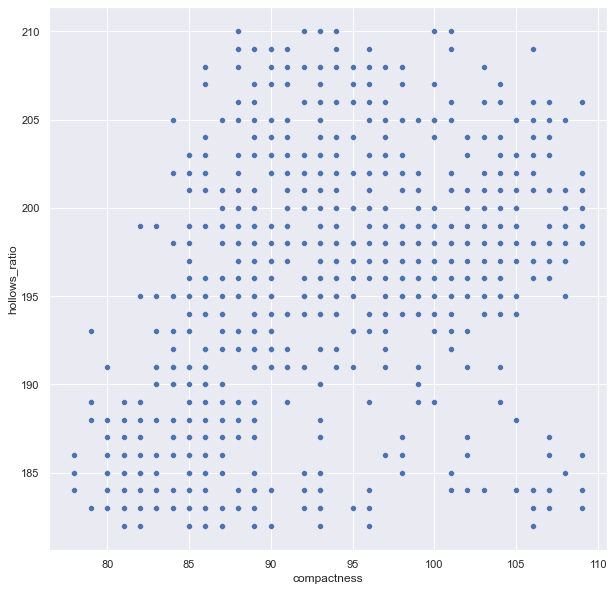

In [781]:
#compactness vs hollows_ratio
sns.scatterplot(data=vehicle, x="compactness", y="hollows_ratio")

From the above plot, it can be determined that there is no relationship between the variables hollows_ratio and compactness.

<AxesSubplot:xlabel='skewness_about', ylabel='skewness_about.1'>

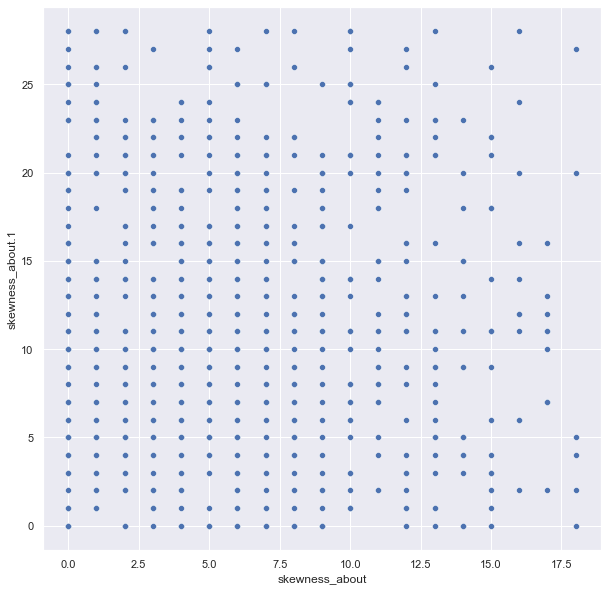

In [782]:
#skewness_about vs skewness_about.1
sns.scatterplot(data=vehicle, x="skewness_about", y="skewness_about.1")

From the above plot, it can be determined that there is no relationship between the variables above 

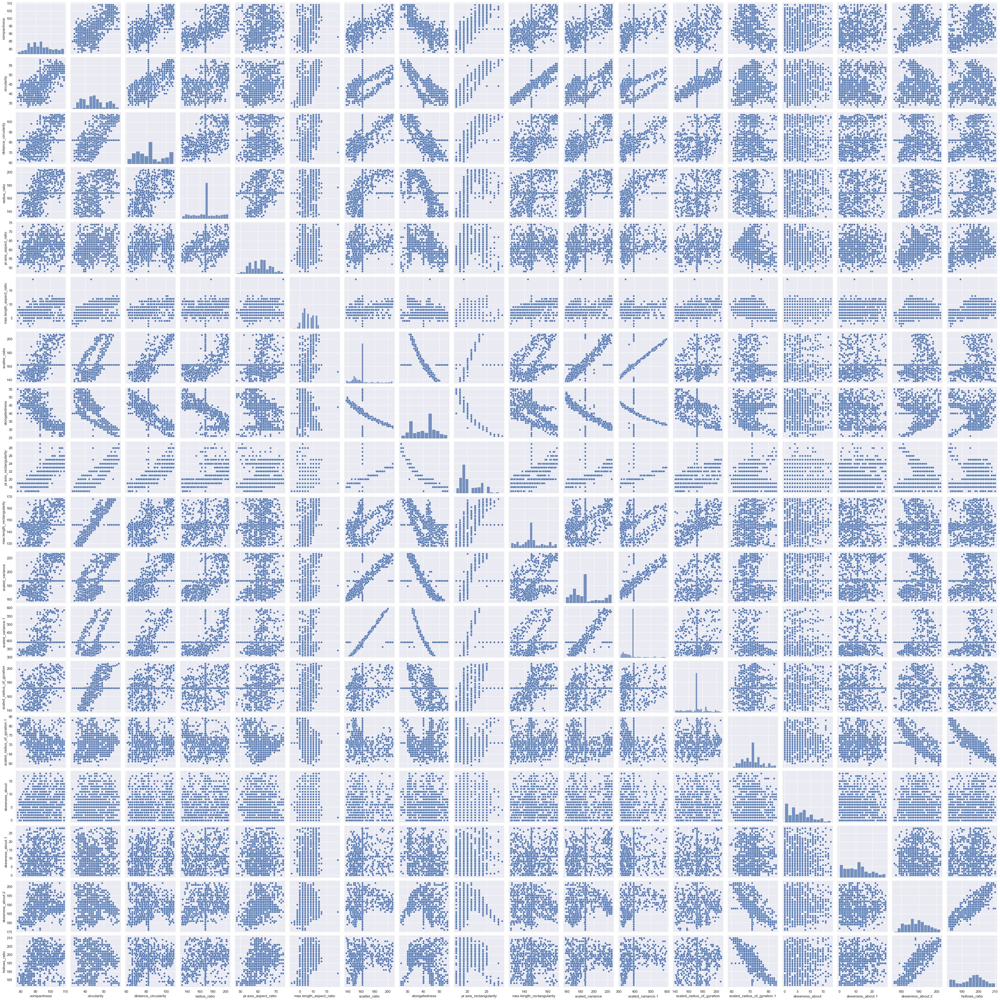

In [783]:
#multivariate plot
#pair plot
sns.pairplot(vehicle)

The above pair plot displays the relationship between all the variables of the dataset.

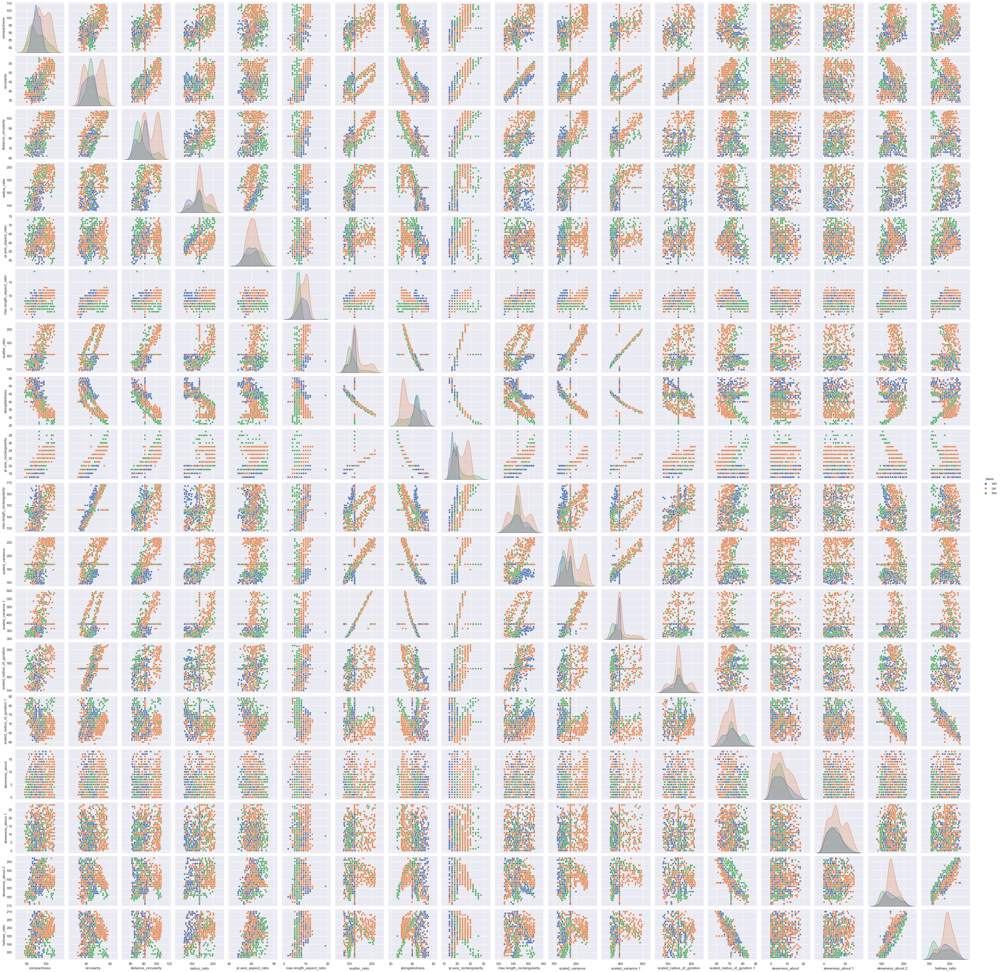

In [784]:
#pair plot for class
sns.pairplot(vehicle,hue='class')

From the above plot it is evident that the distribution of the variables for the three classes is not same

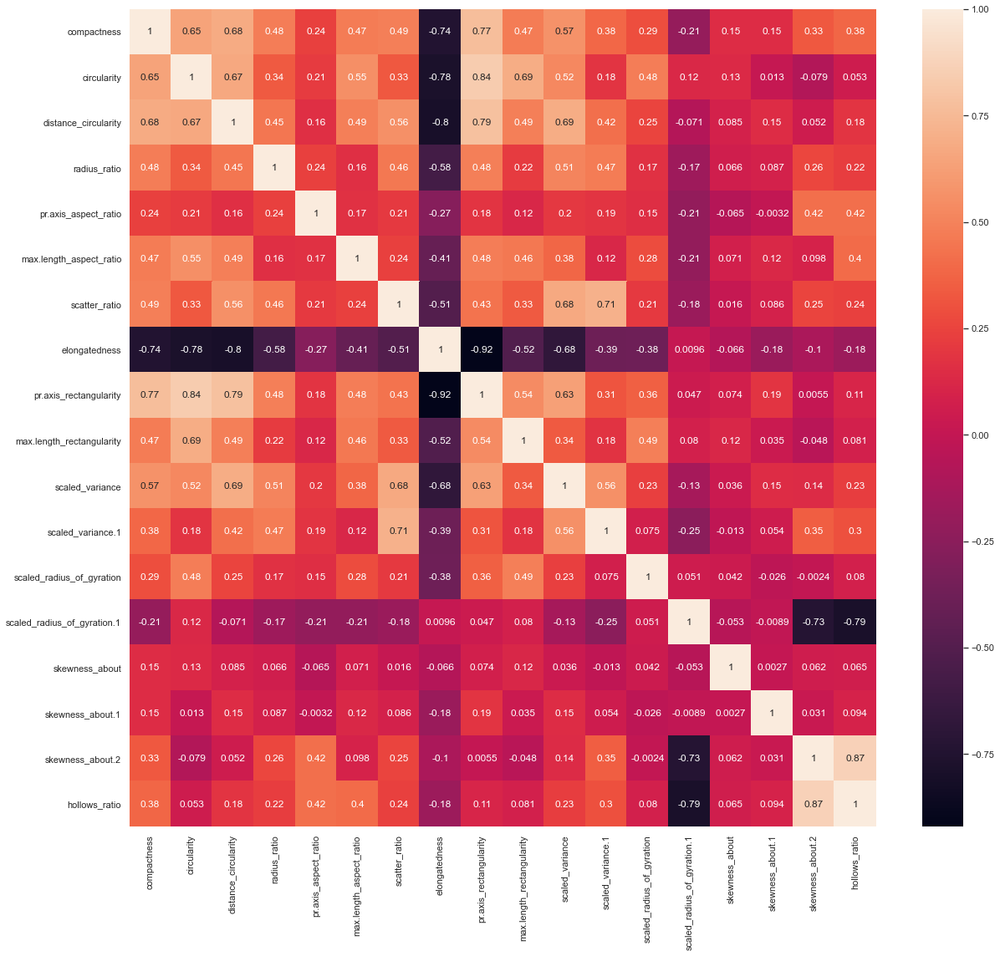

In [785]:
#checking for correlation
plt.figure(figsize=(20,18))
corr=vehicle.corr()
sns.heatmap(corr,annot=True);


In [786]:
#3. Classifier
#SVM 
#segregate predictors vs target variables
X=vehicle.drop(columns='class') #independent variables
y=vehicle['class'] #target variable

In [787]:
#scaling the muerical variables
XScaled=X.apply(zscore)
XScaled.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.236245,0.522616,0.015637,0.562503,2.005686,0.890289,-0.034915,0.224385,-0.224342,1.243201,-0.595808,-0.229156,0.815614,-0.216260,-0.019245,0.658888,-0.292229,0.192527
1,-0.297436,-0.622807,0.093916,-1.544408,-0.751263,0.415692,-0.897830,0.640374,-0.610886,-0.359157,-0.919993,-1.089769,-0.983809,0.170949,0.649863,0.381772,0.044591,0.465582
2,1.437028,0.849880,1.816045,-0.006933,0.902906,0.890289,2.952097,-1.162245,0.935290,1.143053,1.943641,-0.000830,-0.014889,0.364553,1.765043,-0.311019,-0.123819,0.055999
3,-0.030595,-0.622807,-0.062641,-0.519425,0.351516,0.415692,-1.229720,0.779037,-0.610886,-0.359157,-1.460302,-0.000830,-0.014889,-1.571492,-0.019245,-0.172461,1.728692,1.557804
4,-1.097957,-0.131911,-1.001984,-0.006933,-0.016077,-0.058904,-0.897830,0.640374,-0.610886,-0.259010,-0.001469,-1.177586,1.092448,-0.022656,0.649863,-0.033902,-1.471100,-1.718862


In [788]:
#splitting the original data into train and test 70:30
X_train, X_test, y_train, y_test = train_test_split(XScaled, y, test_size = 0.3, random_state = 10)

In [789]:
row, col = X_train.shape
print('The training set comprises of', row, 'rows and', col, 'columns.')

The training set comprises of 592 rows and 18 columns.


In [790]:
row1, col1 = X_test.shape
print('The test set comprises of', row1, 'rows and', col1, 'columns.')

The test set comprises of 254 rows and 18 columns.


In [791]:
# Building a Support Vector Machine on train data
from sklearn.svm import SVC
svc_model = SVC(C= 4, kernel='rbf', gamma='scale')
svc_model.fit(X_train, y_train)

SVC(C=4)

In [792]:
#predicting on train data
from sklearn.metrics import confusion_matrix, classification_report,accuracy_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import confusion_matrix
from sklearn import metrics
svm_train_predict = svc_model .predict(X_train)
print("Model Accuracy on train data: {0:.4f}".format(metrics.accuracy_score(y_train, svm_train_predict)))
print()

Model Accuracy on train data: 0.9966



In [793]:
#predicting on the test data
sv_test_data = svc_model .predict(X_test)
print("Model Accuracy on test data: {0:.4f}".format(metrics.accuracy_score(y_test, sv_test_data)))
print()

Model Accuracy on test data: 0.9449



From the above, it can be determined that the accuracy on training data is nearly 99% and the accuracy on the testing data is nearly 94.8%.

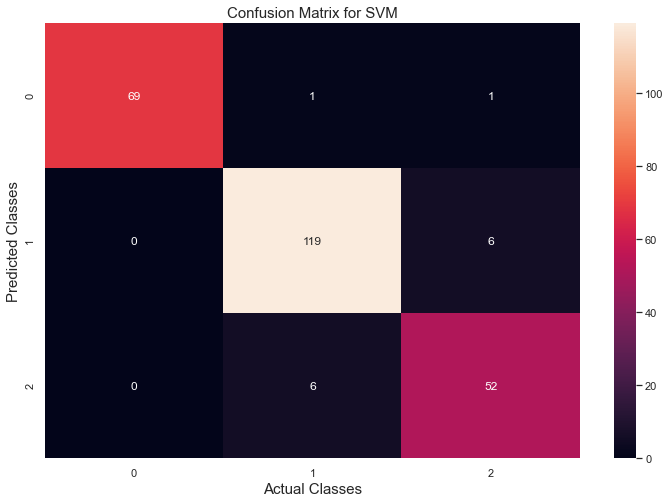

In [794]:
#visualization of confusion matrix in the form of a heatmap
cm= confusion_matrix(y_test,sv_test_data)
plt.figure(figsize = (12, 8))
sns.heatmap(cm, annot = True, fmt = 'd')
plt.xlabel('Actual Classes', fontsize = 15)
plt.ylabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for SVM', fontsize = 15);

In [795]:
#Classification report
print("Classification Report")
print(metrics.classification_report(y_test,sv_test_data))

Classification Report
              precision    recall  f1-score   support

         bus       1.00      0.97      0.99        71
         car       0.94      0.95      0.95       125
         van       0.88      0.90      0.89        58

    accuracy                           0.94       254
   macro avg       0.94      0.94      0.94       254
weighted avg       0.95      0.94      0.95       254



In [796]:
#Explanation

True Positives (TP) - These are the correctly predicted positive values which implies that the value of actual class is True and the value of predicted class is also True.

True Negatives (TN) - These are the correctly predicted negative values which means that the value of actual class is false and value of predicted class is also false.

False Positives (FP) – When actual class is no and predicted class is yes.

False Negatives (FN) – When actual class is yes but predicted class in no

precision- Precision is the ratio of correctly predicted positive observations to the total predicted positive observations.

Precision = TP/TP+FP

Here, precision for bus is 99%, car is 96% and van is 88%

Here,it calculates the ratio of predicted positive normal class to the total predicted observations

Recall- Recall is the ratio of correctly predicted positive observations to the all observations in actual class - yes.

Recall= TP/TP+FN

Here, the recall for bus class is 0.97,car- 0.85 and van-0.91

F1 score- F1 Score is the weighted average of Precision and Recall or harmonic mean of Precision and recall

F1score= 2*(Recall * Precision) / (Recall + Precision)

The F1score for bus class- 0.98

car- 0.96

van-0.90

From the above precision, recall and F1score it can be determined that the bus has high values of precision, recall and F1 score

In [797]:
precision_or, recall_or, f1_score_or, support = precision_recall_fscore_support(y_test, sv_test_data,average='macro')
print('Precision Score :', '%0.2f' % precision_or)
print('Recall Score :', '%0.2f' % recall_or)
print('F1-Score:', '%0.2f' % f1_score_or)
Acc= accuracy_score(y_test, sv_test_data)
print('Accuracy Score :','%0.2f' % Acc)

Precision Score : 0.94
Recall Score : 0.94
F1-Score: 0.94
Accuracy Score : 0.94


In [798]:
#Tuning-GridsearchCV
from sklearn.model_selection import GridSearchCV
param_grid = {'C': [0.1,1, 10, 100], 'gamma': [1,0.1,0.01,0.001],'kernel': ['rbf', 'poly', 'sigmoid']}
grid = GridSearchCV(SVC(),param_grid,refit=True,verbose=2)
grid.fit(X_train,y_train)


Fitting 5 folds for each of 48 candidates, totalling 240 fits
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END .........................C=0.1, gamma=1, kernel=rbf; total time=   0.0s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.0s
[CV] END ........................C=0.1, gamma=1, kernel=poly; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, kernel=sigmoid; total time=   0.0s
[CV] END .....................C=0.1, gamma=1, k

[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END ....................C=1, gamma=0.01, kernel=sigmoid; total time=   0.0s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END .......................C=1, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END ......................C=1, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END ......................C=1, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END ......................C=1, gamma=0.001, kernel=poly; total time=   0.0s
[CV] END ...................

[CV] END ...................C=100, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=100, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=100, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ...................C=100, gamma=0.1, kernel=sigmoid; total time=   0.0s
[CV] END ......................C=100, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=100, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=100, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=100, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END ......................C=100, gamma=0.01, kernel=rbf; total time=   0.0s
[CV] END .....................C=100, gamma=0.01, kernel=poly; total time=   0.0s
[CV] END .....................C=100, gamma=0.01, kernel=poly; total time=   0.0s
[CV] END .....................C=100, gamma=0.01, kernel=poly; total time=   0.0s
[CV] END ...................

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100], 'gamma': [1, 0.1, 0.01, 0.001],
                         'kernel': ['rbf', 'poly', 'sigmoid']},
             verbose=2)

In [799]:
print(grid.best_estimator_)


SVC(C=100, gamma=0.1)


In [800]:
grid_predictions = grid.predict(X_test)
print(confusion_matrix(y_test,grid_predictions))
print(classification_report(y_test,grid_predictions))

[[ 69   2   0]
 [  0 120   5]
 [  0   6  52]]
              precision    recall  f1-score   support

         bus       1.00      0.97      0.99        71
         car       0.94      0.96      0.95       125
         van       0.91      0.90      0.90        58

    accuracy                           0.95       254
   macro avg       0.95      0.94      0.95       254
weighted avg       0.95      0.95      0.95       254



In [801]:
print("Model Accuracy on test data: {0:.4f}".format(metrics.accuracy_score(y_test,grid_predictions )))

Model Accuracy on test data: 0.9488


From the above, it is clearly evident that the accuracy on the testing data is 94.88%.

In [802]:
precision_score, recall_score, f1_score, support = precision_recall_fscore_support(y_test, grid_predictions,average='macro')
print('Precision Score :', '%0.2f' % precision_score)
print('Recall Score :', '%0.2f' % recall_score)
print('F1-Score:', '%0.2f' % f1_score)
Accuracy= accuracy_score(y_test, grid_predictions)
print('Accuracy Score :','%0.2f' % Accuracy)

Precision Score : 0.95
Recall Score : 0.94
F1-Score: 0.95
Accuracy Score : 0.95


In [803]:
#4.Dimensional reduction
#PCA
#scaling the numerical variables
Xscaled=X.apply(zscore)
Xscaled.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
0,0.236245,0.522616,0.015637,0.562503,2.005686,0.890289,-0.034915,0.224385,-0.224342,1.243201,-0.595808,-0.229156,0.815614,-0.216260,-0.019245,0.658888,-0.292229,0.192527
1,-0.297436,-0.622807,0.093916,-1.544408,-0.751263,0.415692,-0.897830,0.640374,-0.610886,-0.359157,-0.919993,-1.089769,-0.983809,0.170949,0.649863,0.381772,0.044591,0.465582
2,1.437028,0.849880,1.816045,-0.006933,0.902906,0.890289,2.952097,-1.162245,0.935290,1.143053,1.943641,-0.000830,-0.014889,0.364553,1.765043,-0.311019,-0.123819,0.055999
3,-0.030595,-0.622807,-0.062641,-0.519425,0.351516,0.415692,-1.229720,0.779037,-0.610886,-0.359157,-1.460302,-0.000830,-0.014889,-1.571492,-0.019245,-0.172461,1.728692,1.557804
4,-1.097957,-0.131911,-1.001984,-0.006933,-0.016077,-0.058904,-0.897830,0.640374,-0.610886,-0.259010,-0.001469,-1.177586,1.092448,-0.022656,0.649863,-0.033902,-1.471100,-1.718862


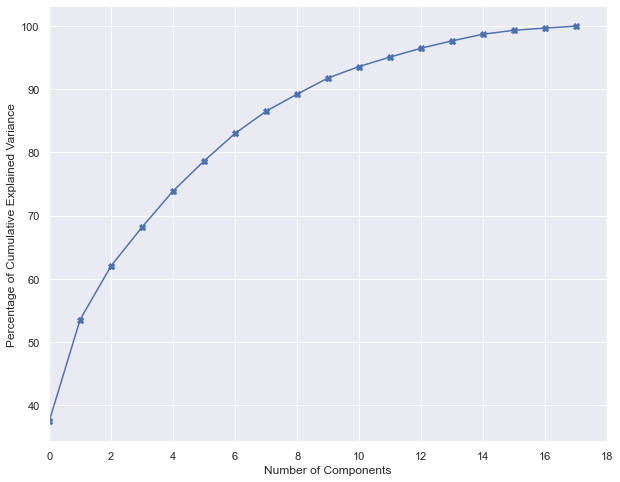

In [804]:
#plotting the cummulative variance explained by the principal components
from sklearn.decomposition import PCA
pca = PCA()
X_pca = pca.fit_transform(Xscaled)
plt.figure(figsize = (10, 8))
plt.plot((np.cumsum(pca.explained_variance_ratio_) * 100), marker = 'X')
plt.xlim(0, 18)
plt.xlabel('Number of Components')
plt.ylabel('Percentage of Cumulative Explained Variance');


In [805]:
#printing pca explained variance  
print(pca.explained_variance_)

[6.74187577 2.90751764 1.5332006  1.10641624 1.03031176 0.85669918
 0.78594219 0.63230673 0.48680848 0.46165928 0.32677692 0.27064254
 0.25217383 0.20905705 0.18987911 0.11192945 0.06311371 0.0549913 ]


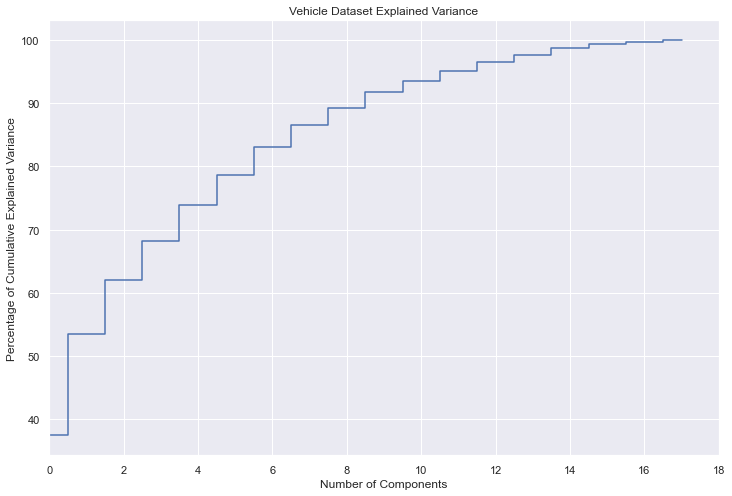

In [806]:
#plotting the graph
plt.figure(figsize = (12, 8))
plt.step(list(range(18)), (np.cumsum(pca.explained_variance_ratio_) * 100), where = 'mid')
plt.xlim(0, 18)
plt.xlabel('Number of Components')
plt.ylabel('Percentage of Cumulative Explained Variance')
plt.title('Vehicle Dataset Explained Variance');


It is evident that the first six components has more than 95% of variation. Between first 5 components, more than 91% of the information is captured. The above plot shows almost 95% variance by the first 6 components. Therefore we can drop 7th component onwards.

In [807]:
#Using 6 components and printing the eigen vectors
p3 = PCA(n_components=6)
p3.fit(Xscaled)
print(p3.components_)
print(p3.explained_variance_ratio_)
xp3 = p3.transform(Xscaled)

[[ 0.32367313  0.30163747  0.32343965  0.23969514  0.13655485  0.227038
   0.26286503 -0.3439162   0.33319209  0.237633    0.30263965  0.2162386
   0.16701233 -0.08410233  0.04462189  0.06530207  0.11381917  0.15684646]
 [-0.01830986  0.24650814  0.10555854 -0.07456258 -0.21456869  0.00812841
  -0.0855692  -0.12664139  0.18705087  0.19705616  0.00746987 -0.17959626
   0.13922005  0.48567501  0.00702271 -0.00466531 -0.51306629 -0.47752493]
 [-0.06729916 -0.22049255  0.08210185  0.26964399 -0.14334367 -0.37356838
   0.37008335 -0.04078318 -0.02258151 -0.26800097  0.2684319   0.44533347
  -0.30215056  0.14243045 -0.18065631  0.08589553 -0.10139266 -0.25316187]
 [-0.12505233  0.07133491 -0.11750738  0.05366731  0.35828135 -0.15580142
   0.13459139  0.03839038 -0.10215134  0.13497964 -0.02048235  0.1428396
   0.36128581  0.09135074 -0.36173197 -0.68293507  0.0302789  -0.06196938]
 [ 0.03726515  0.0085959  -0.00604272  0.08302008 -0.29680955 -0.12717083
   0.11274246  0.07780677 -0.08357447 

In [808]:
#displaying the original and the reduced features
p_6 = PCA(n_components = 6)
x_6 = p_6.fit_transform(Xscaled)
print(' Total original number of features:', X.shape[1])
print(' Total reduced number of features:', x_6.shape[1])

 Total original number of features: 18
 Total reduced number of features: 6


In [809]:
#viewing the first 5 observations of the pca components
dfp = pd.DataFrame(data = x_6)
dfp.head()


,0,1,2,3,4,5
0,0.947980,-0.061310,-1.446707,0.601207,-0.846901,-0.629962
1,-1.938021,-0.155265,-1.164986,-1.517355,0.128811,0.463236
2,3.999640,0.723962,0.444165,-0.181898,1.442935,0.186629
3,-0.963685,-2.777589,-1.780999,-0.160215,-0.128345,0.127016
4,-1.938794,1.648588,-0.626157,0.254363,0.382986,-0.322495


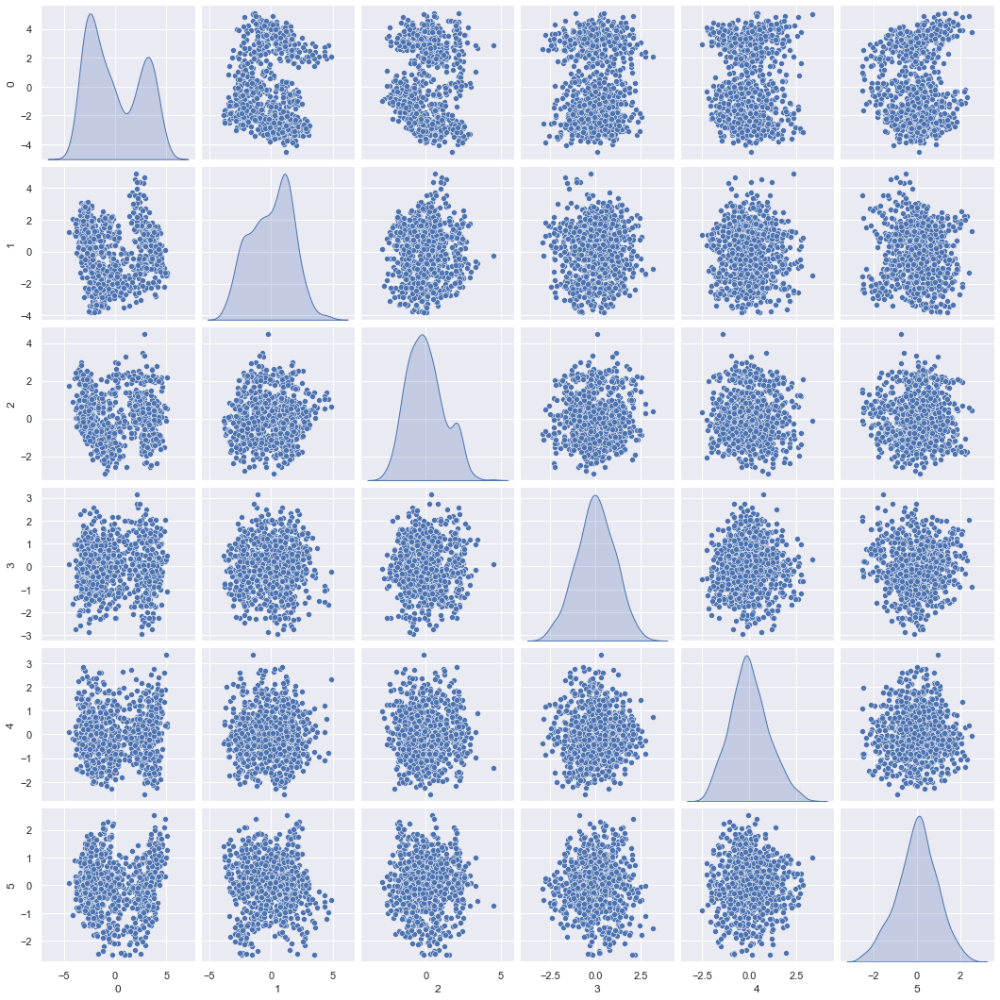

In [810]:
#pair plot for dfp
sns.pairplot(dfp, diag_kind = 'kde');

In [811]:
#5. classifier
#SVM after dimensionality reduction
#splitting the pca data into train and test 70:30
X_t, X_te, y_t, y_te = train_test_split(x_6, y, test_size = 0.3, random_state = 10)

In [812]:
#Shape of X_t
shapet=X_t.shape
print("The shape of X_t(Training data after dimensionality reduction):",shapet)

The shape of X_t(Training data after dimensionality reduction): (592, 6)


From the above, it is clearly evident that the X_t consists of 592 rows and 6 columns.

In [813]:
#shape of X_te
shapete=X_te.shape
print("The shape of X_te(Testing data after dimensionality reduction):",shapete)

The shape of X_te(Testing data after dimensionality reduction): (254, 6)


From the above, it is clearly evident that the testing data consists of 254 rows and 6 columns

In [814]:
#SVM on the pca data
svm_Pca = SVC(C= 4, kernel='rbf', gamma='scale')
svm_Pca.fit(X_t, y_t)

SVC(C=4)

In [815]:
#predicting on training data
svtr_predict = svm_Pca .predict(X_t)
print("Model Accuracy on training data: {0:.4f}".format(metrics.accuracy_score(y_t, svtr_predict)))
print()

Model Accuracy on training data: 0.9088



In [816]:
#predicting on test data
svte_predict = svm_Pca .predict(X_te)
print("Model Accuracy on testing data: {0:.4f}".format(metrics.accuracy_score(y_te, svte_predict)))
print()

Model Accuracy on testing data: 0.8346



In [817]:
precision, recall, f1, support = precision_recall_fscore_support(y_test, svte_predict,average='macro')
print('Precision Score :', '%0.2f' % precision)
print('Recall Score :', '%0.2f' % recall)
print('F1-Score:', '%0.2f' % f1)
accuracyte= accuracy_score(y_test,svte_predict)
print('Accuracy Score :','%0.2f' % accuracyte)

Precision Score : 0.83
Recall Score : 0.83
F1-Score: 0.83
Accuracy Score : 0.83


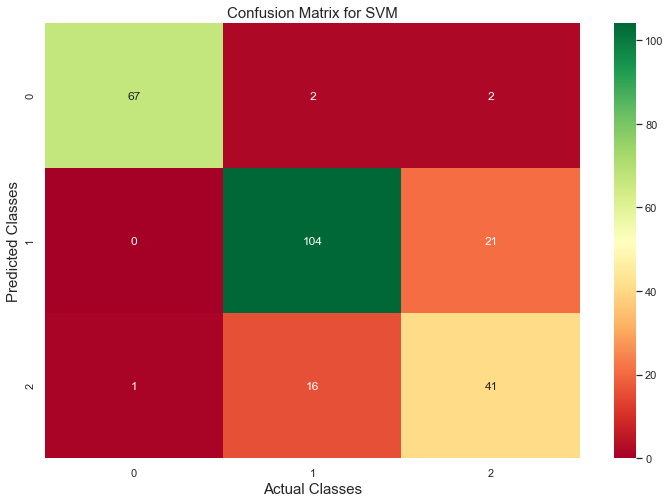

In [818]:
#visualization of confusion matrix in the form of a heatmap
cm= confusion_matrix(y_te, svte_predict)
plt.figure(figsize = (12, 8))
sns.heatmap(cm, annot = True, cmap = 'RdYlGn', fmt = 'd')
plt.xlabel('Actual Classes', fontsize = 15)
plt.ylabel('Predicted Classes', fontsize = 15)
plt.title('Confusion Matrix for SVM', fontsize = 15);

In [819]:
modellists1 = []
modellists1.append(['Support Vector Classifier without PCA', Acc* 100, recall_or* 100, precision_or* 100,f1_score_or*100])
modellists1.append(['Support Vector Classifier with PCA', accuracyte* 100, recall * 100, precision * 100,f1_score*100])
mdl_df1 = pd.DataFrame(modellists1, columns = ['Model','Accuracy Score of Test Data', 'Recall Score', 'Precision Score','F1 Score'])
mdl_df1

,Model,Accuracy Score of Test Data,Recall Score,Precision Score,F1 Score
0,Support Vector Classifier without PCA,94.488189,94.012757,94.193346,94.093678
1,Support Vector Classifier with PCA,83.464567,82.751951,82.612604,94.622624


In [820]:
#conclusion

conclusion

The model without PCA has the accuracy of 94.88% with about 18 columns, but the SVM with PCA reduction has the accuracy of about 84% with only about 6 attributes.the difference can be illustrated even better if the dataset had been cursed with dimensionality, since its 18 variable in the original data the difference is very subtle.

In [821]:
#Part 4
#loading the required packages
import numpy as np   
import pandas as pd    
import matplotlib.pyplot as plt 
from sklearn.cluster import KMeans
from scipy.stats import zscore
from sklearn.metrics import silhouette_samples, silhouette_score
import seaborn as sns
%matplotlib inline 

In [822]:
#importing and reading the dataset
ipl1=pd.read_csv("Part4 - batting_bowling_ipl_bat.csv")

In [823]:
#Exploring the shape and size of the dataset
shapeipl=ipl1.shape
sizeipl=ipl1.size
print("The shape of the dataset:",shapeipl)
print("The size of the dataset:",sizeipl)

The shape of the dataset: (180, 7)
The size of the dataset: 1260


In [824]:
#making a copy of the original data
bb=ipl1.copy()

In [825]:
#checking for missing values
ipl1.isnull().sum()

Name     90
Runs     90
Ave      90
SR       90
Fours    90
Sixes    90
HF       90
dtype: int64

In [826]:
ipl1.head()  #displays the first 5 values

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [827]:
#dropping the null values
ipl1.dropna(inplace=True)

In [828]:
ipl1.isnull().sum()

Name     0
Runs     0
Ave      0
SR       0
Fours    0
Sixes    0
HF       0
dtype: int64

In [829]:
#checking the datatype
ipl1.dtypes

Name      object
Runs     float64
Ave      float64
SR       float64
Fours    float64
Sixes    float64
HF       float64
dtype: object

In [830]:
#EDA
#statistical analysis
#mean
print("Data mean:",ipl1.mean())
#median
print("Data Median:",ipl1.median())
#data quantile (25%)
print("Data quantile(25%):",ipl1.quantile(q=0.25)) 
#data quantile (50%)
print("Data quantile(50%):",ipl1.quantile(q=0.50)) 
#data quantile (75%)
print("Data quantile(75%):",ipl1.quantile(q=0.75))  

Data mean: Runs     219.933333
Ave       24.729889
SR       119.164111
Fours     19.788889
Sixes      7.577778
HF         1.188889
dtype: float64
Data Median: Runs     196.500
Ave       24.440
SR       120.135
Fours     16.000
Sixes      6.000
HF         0.500
dtype: float64
Data quantile(25%): Runs      98.000
Ave       14.665
SR       108.745
Fours      6.250
Sixes      3.000
HF         0.000
Name: 0.25, dtype: float64
Data quantile(50%): Runs     196.500
Ave       24.440
SR       120.135
Fours     16.000
Sixes      6.000
HF         0.500
Name: 0.5, dtype: float64
Data quantile(75%): Runs     330.7500
Ave       32.1950
SR       131.9975
Fours     28.0000
Sixes     10.0000
HF         2.0000
Name: 0.75, dtype: float64


In [831]:
#lower fence,upperfence,median,IQR,lower quartile,upperquartile of the data for Runs
import numpy as np

runs = np.median(ipl1['Runs']) #Runs median
runs_UQ=np.percentile(ipl1['Runs'],75) #Runs_UQ= runs Upperquartile
runs_LQ=np.percentile(ipl1['Runs'],25) #runs_LQ= runs lowequartile
runs_IQR= runs_UQ-runs_LQ #runs_IQR= IQR of runs
runs_LF=runs_LQ-(1.5*runs_IQR) #runs_LF=lower fence of runs
runs_UF=runs_UQ+(1.5*runs_IQR) #runs_UF= upperfence of runs
Outliers_runs=[i for i in ipl1['Runs'] if i < runs_LF or i >runs_UF] #outliers of runs

In [832]:
print("Median of runs:",runs)
print("Upperquartile of runs:",runs_UQ)
print("Lowequartile of runs:",runs_LQ)
print("IQR of runs:",runs_IQR)
print("Lowerfence of runs:",runs_LF)
print("Upperfence of runs:",runs_UF)
print("Outliers of runs:",Outliers_runs)


Median of runs: 196.5
Upperquartile of runs: 330.75
Lowequartile of runs: 98.0
IQR of runs: 232.75
Lowerfence of runs: -251.125
Upperfence of runs: 679.875
Outliers of runs: [733.0]


In [833]:
#lower fence,upperfence,median,IQR,lower quartile,upperquartile of the data for ave
import numpy as np

ave = np.median(ipl1['Ave']) # median
ave_UQ=np.percentile(ipl1['Ave'],75) #ave_UQ= ave Upperquartile
ave_LQ=np.percentile(ipl1['Ave'],25) #ave_LQ= ave lowequartile
ave_IQR= ave_UQ-ave_LQ #ave_IQR= IQR of ave
ave_LF=ave_LQ-(1.5*ave_IQR) #ave_LF=lower fence of ave
ave_UF=ave_UQ+(1.5*ave_IQR) #ave_UF= upperfence of ave
Outliers_ave=[i for i in ipl1['Ave'] if i < ave_LF or i >ave_UF] #outliers of ave

In [834]:
print("Median of ave:",ave)
print("Upperquartile of ave:",ave_UQ)
print("Lowequartile of ave:",ave_LQ)
print("IQR of ave:",ave_IQR)
print("Lowerfence of ave:",ave_LF)
print("Upperfence of ave:",ave_UF)
print("Outliers of ave:",Outliers_ave)


Median of ave: 24.44
Upperquartile of ave: 32.195
Lowequartile of ave: 14.665
IQR of ave: 17.53
Lowerfence of ave: -11.630000000000003
Upperfence of ave: 58.49
Outliers of ave: [61.08, 61.0, 81.33]


In [835]:
#Removing the outliers and replacing with means
columns8=['Runs','Ave','SR','Fours','Sixes','HF']

In [836]:
for col in columns8:
    #getting upper lower quartile values
    q25,q75=np.percentile(ipl1[col],25),np.percentile(ipl1[col],75)
    IQR8=q75-q25
    Threshold8=IQR8*1.5
    lower4,upper4=q25-Threshold8,q75+Threshold8
    Outliersipl=[i for i in ipl1[col] if i < lower4 or i > upper4]
    print('{} Total Number of outliers in {} Before Imputing : {}'.format('\033[1m',col,len(Outliersipl)))
    print('\n')
    #taking mean of a column without considering outliers
    ipl_mean = ipl1.loc[(ipl1[col] >= lower4) & (ipl1[col] <= upper4)]
    mean8=int(ipl_mean[col].mean())
    print('{} Mean of {} is {}'.format('\033[1m',col,mean8))
    print('\n')
    #imputing  the outliers with the mean
    ipl1[col]=np.where(ipl1[col]>upper4,mean8,ipl1[col])
    ipl1[col]=np.where(ipl1[col]<lower4,mean8,ipl1[col])
    Outliersipl=[i for i in ipl1[col] if i < lower4 or i > upper4]
    print('{} Total Number of outliers in {} After Imputing : {}'.format('\033[1m',col,len(Outliersipl)))  
    print('\n')

 Total Number of outliers in Runs Before Imputing : 1


 Mean of Runs is 214


 Total Number of outliers in Runs After Imputing : 0


 Total Number of outliers in Ave Before Imputing : 3


 Mean of Ave is 23


 Total Number of outliers in Ave After Imputing : 0


 Total Number of outliers in SR Before Imputing : 5


 Mean of SR is 123


 Total Number of outliers in SR After Imputing : 0


 Total Number of outliers in Fours Before Imputing : 3


 Mean of Fours is 18


 Total Number of outliers in Fours After Imputing : 0


 Total Number of outliers in Sixes Before Imputing : 1


 Mean of Sixes is 7


 Total Number of outliers in Sixes After Imputing : 0


 Total Number of outliers in HF Before Imputing : 2


 Mean of HF is 1


 Total Number of outliers in HF After Imputing : 0




In [837]:
#range for all attributes
df3=ipl1[['Runs', 'Ave','Fours','Sixes','HF']]
df3
print('Range of data:',df3.max()-df3.min())
df3.info()


Range of data: Runs     588.00
Ave       45.87
Fours     58.00
Sixes     20.00
HF         5.00
dtype: float64
<class 'pandas.core.frame.DataFrame'>
Int64Index: 90 entries, 1 to 179
Data columns (total 5 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Runs    90 non-null     float64
 1   Ave     90 non-null     float64
 2   Fours   90 non-null     float64
 3   Sixes   90 non-null     float64
 4   HF      90 non-null     float64
dtypes: float64(5)
memory usage: 4.2 KB


In [838]:
#variance
df3.var()

Runs     21424.252809
Ave        117.705700
Fours      191.646067
Sixes       33.977528
HF           1.885643
dtype: float64

In [839]:
#covariance
df3.cov()

,Runs,Ave,Fours,Sixes,HF
Runs,21424.252809,1204.468914,1668.353933,662.640449,153.711610
Ave,1204.468914,117.705700,94.033970,44.953933,8.884542
Fours,1668.353933,94.033970,191.646067,47.752809,13.958801
Sixes,662.640449,44.953933,47.752809,33.977528,5.247191
HF,153.711610,8.884542,13.958801,5.247191,1.885643


In [840]:
#correlation
df3.corr()

,Runs,Ave,Fours,Sixes,HF
Runs,1.000000,0.758480,0.823352,0.776657,0.764758
Ave,0.758480,1.000000,0.626089,0.710842,0.596357
Fours,0.823352,0.626089,1.000000,0.591770,0.734291
Sixes,0.776657,0.710842,0.591770,1.000000,0.655543
HF,0.764758,0.596357,0.734291,0.655543,1.000000


In [841]:
#describe function
ipl1.describe().T

,count,mean,std,min,25%,50%,75%,max
Runs,90.0,214.166667,146.370259,2.0,98.000,196.500,322.7500,590.00
Ave,90.0,23.236444,10.849226,0.5,14.665,23.560,30.5850,46.37
SR,90.0,123.020222,16.819736,80.0,111.670,122.925,131.9975,164.10
Fours,90.0,18.166667,13.843629,0.0,6.250,16.000,26.0000,58.00
Sixes,90.0,7.000000,5.829025,0.0,3.000,6.000,10.0000,20.00
HF,90.0,1.044444,1.373187,0.0,0.000,0.500,2.0000,5.00


From, the above it can be determined that

1.The mean of runs is greater than median

2.The mean of ave is nearly equal to its median

3.The mean of SR attribute is nearly same as its median

4.The mean of Fours attribute is greater than its median

5.The mean of Sixes attribute is some what greater than its median

6.The mean of HF attribute is some what greater than its median.

In [842]:
print('Duplicated rows: ', ipl1[ipl1.duplicated()].shape[0])

Duplicated rows:  0


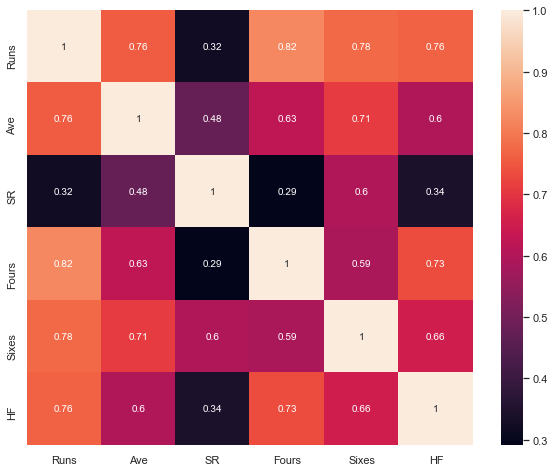

In [843]:
plt.figure(figsize=(10,8))
corr1=ipl1.corr()
sns.heatmap(corr1,annot=True);

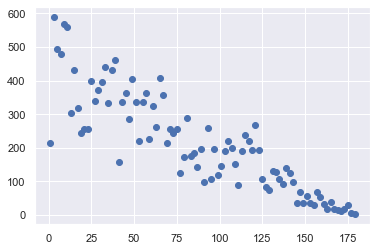

In [844]:
#Visualization
#univariate analysis
#Scatter plot
plt.scatter(ipl1.index,ipl1['Runs']) # scatter plot for continuous data
plt.show()

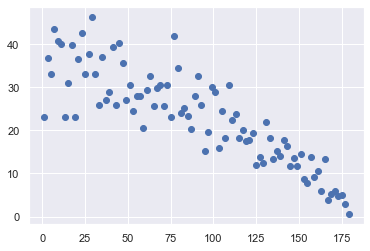

In [845]:
#scatter plot for ave
plt.scatter(ipl1.index,ipl1['Ave']) # scatter plot for continuous data
plt.show()

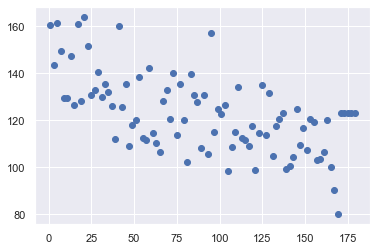

In [846]:
#scatter plot for SR
plt.scatter(ipl1.index,ipl1['SR']) # scatter plot for continuous data
plt.show()

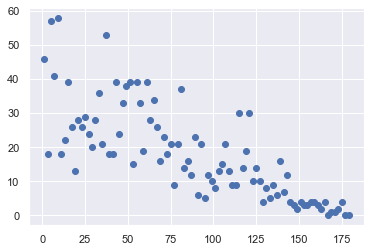

In [847]:
#scatter plot for fours
plt.scatter(ipl1.index,ipl1['Fours']) # scatter plot for continuous data
plt.show()

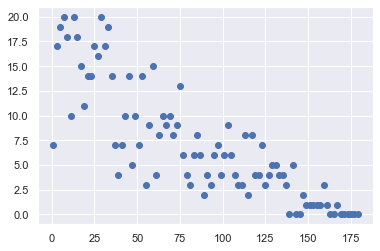

In [848]:
#scatter plot for sixes
plt.scatter(ipl1.index,ipl1['Sixes']) # scatter plot for continuous data
plt.show()

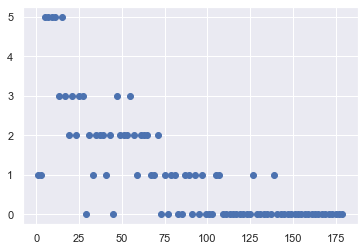

In [849]:
#scatter plot for HF
plt.scatter(ipl1.index,ipl1['HF']) # scatter plot for continuous data
plt.show()

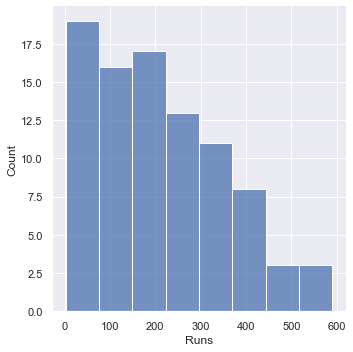

In [850]:
#distplot for Runs
sns.displot(ipl1, x="Runs")

The above histogram depicts the count of the runs 

D:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Fours'>

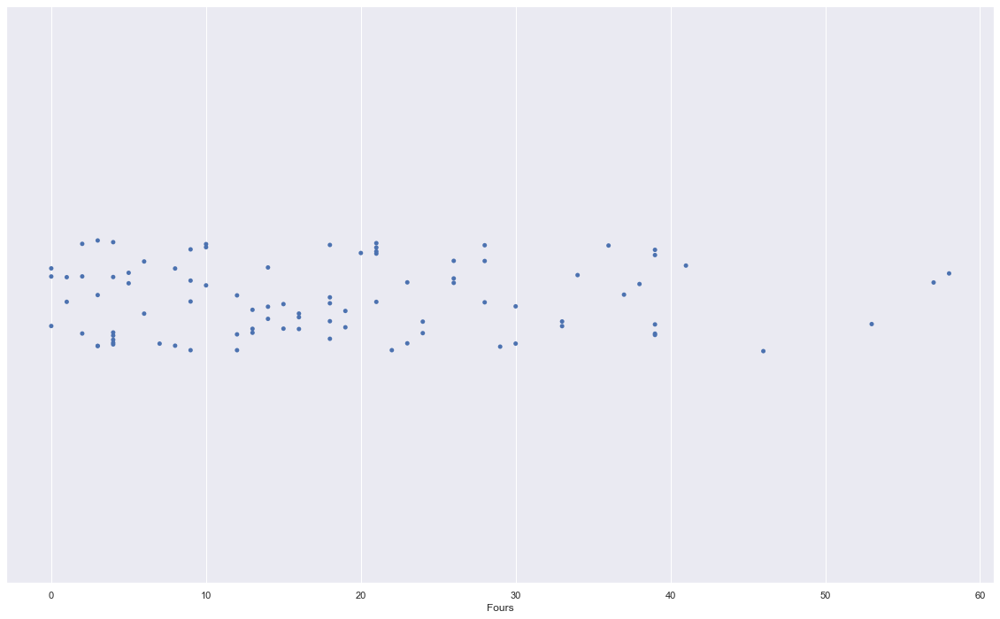

In [851]:
#strip plot
#graph for Fours(univariate graph) and it depicts the distribution of the data points.
plt.figure(figsize=(20,12))
sns.stripplot(ipl1['Fours'])

<AxesSubplot:xlabel='Ave'>

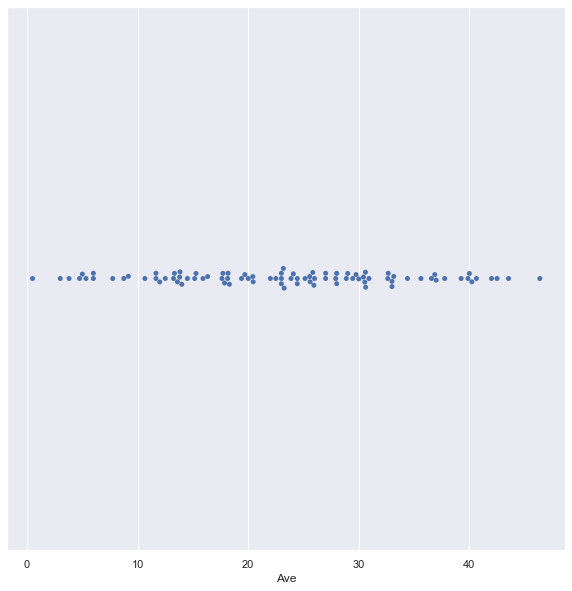

In [852]:
#swarm plot
# Ave distribution (univariate) 
sns.set(rc={'figure.figsize':(10,10)})
sns.swarmplot(x=ipl1['Ave'])


<AxesSubplot:ylabel='Density'>

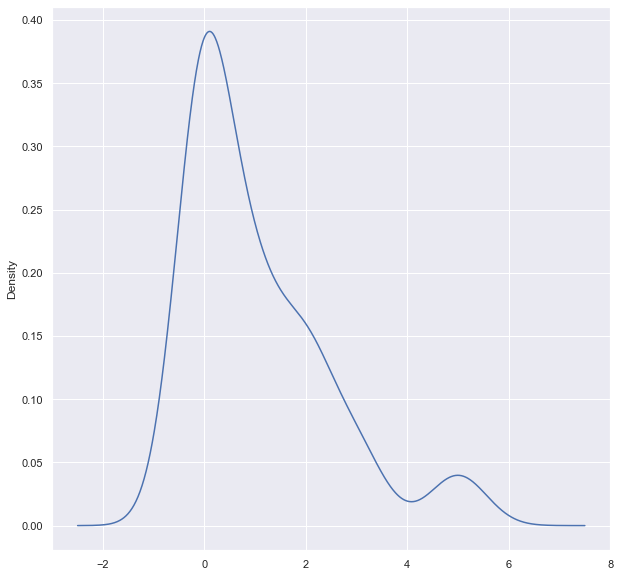

In [853]:
#density plot for HF
plt.figure(figsize=(10,10))
ipl1['HF'].plot(kind='density')

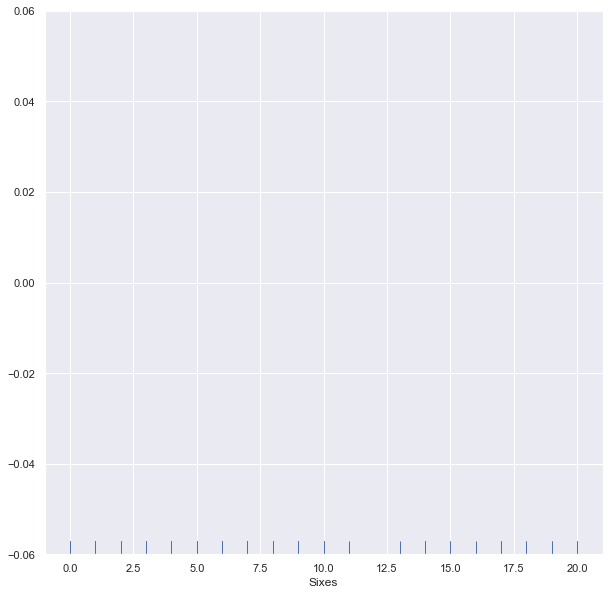

In [854]:
#Rug plot
fig,ax=plt.subplots()
sns.rugplot(ipl1['Sixes'])
plt.show()

{'whiskers': [<matplotlib.lines.Line2D at 0x1eca22f2f40>,
 'caps': [<matplotlib.lines.Line2D at 0x1eca0ca7670>,
 'boxes': [<matplotlib.lines.Line2D at 0x1eca22f2be0>],
 'medians': [<matplotlib.lines.Line2D at 0x1eca0ca7d30>],
 'fliers': [<matplotlib.lines.Line2D at 0x1eca0cda0d0>],
 'means': []}

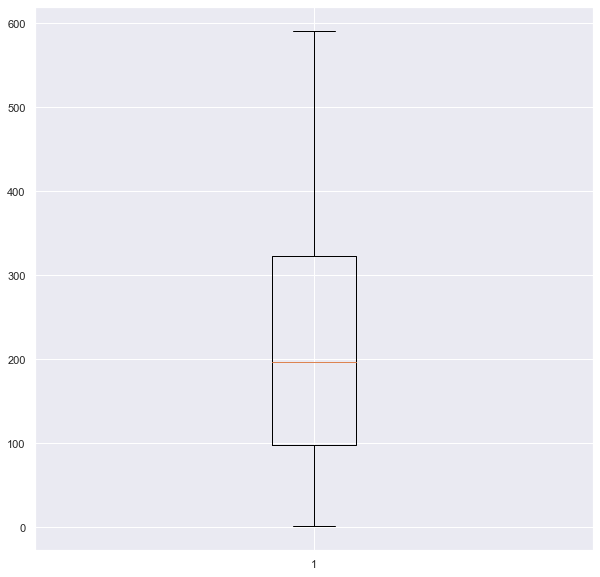

In [855]:
#box plot
plt.boxplot(ipl1['Runs'])

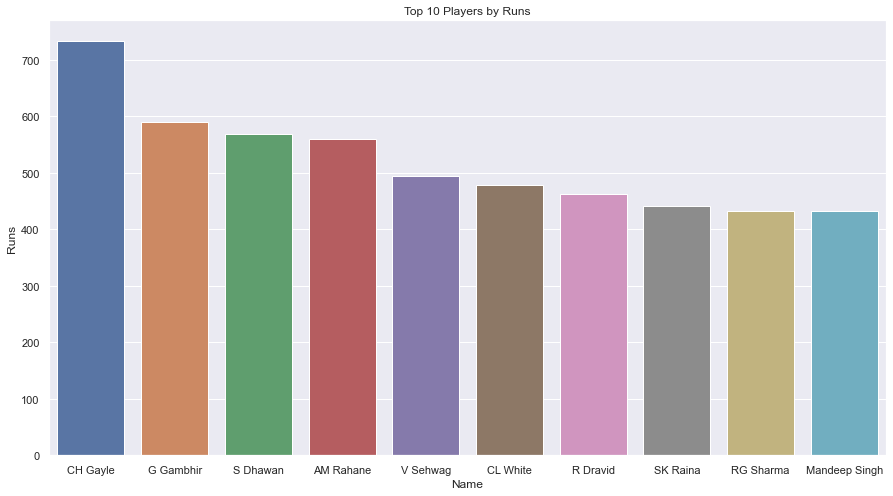

In [856]:
#bivariate analysis
#top 10 players by Runs
plt.figure(figsize=(15,8))
runs1=bb.groupby('Name')['Runs'].sum().sort_values(ascending = False ).head(10)
runs1= runs1.reset_index() 
runs1.columns = ['Name' ,'Runs']
sns.barplot(data= runs1, x= 'Name' , y ='Runs');
plt.title("Top 10 Players by Runs");


From the above plot, it can be determined that CH gayle has scored the highest runs and ManideepSingh has scored the least runs.

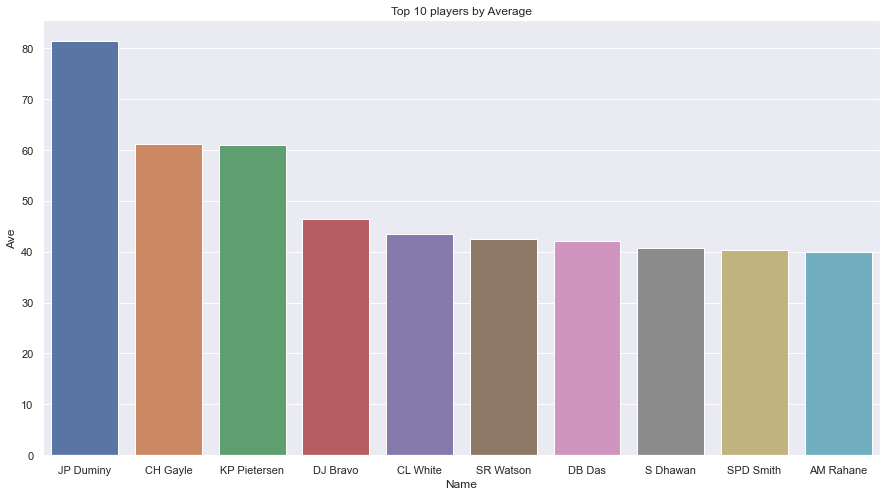

In [857]:
#Top 10 players by their average
plt.figure(figsize=(15,8))
b2=bb.groupby('Name')['Ave'].sum().sort_values(ascending = False ).head(10)
b2= b2.reset_index() 
b2.columns = ['Name' ,'Ave']
sns.barplot(data= b2 , x= 'Name' , y ='Ave')
plt.title("Top 10 players by Average");

From the above bar plot, it can be determined that Jp Duminy has the highest average and Am Rahane has the least average.

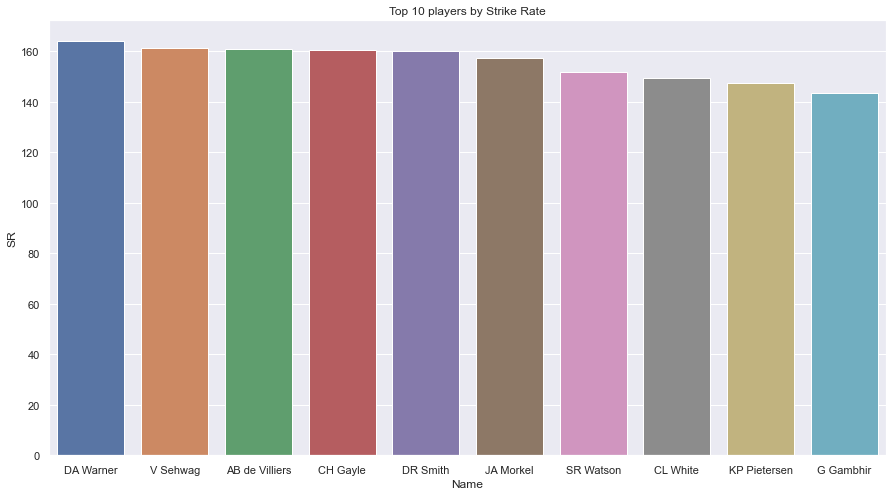

In [858]:
plt.figure(figsize=(15,8))
b6=bb.groupby('Name')['SR'].sum().sort_values(ascending = False ).head(10)
b6= b6.reset_index() 
b6.columns = ['Name' ,'SR']
sns.barplot(data= b6 , x= 'Name' , y ='SR')
plt.title("Top 10 players by Strike Rate");

From the above plot, it is clearly evident that DA warner has the highest strike rate and G.gambhir has the least strike rate.

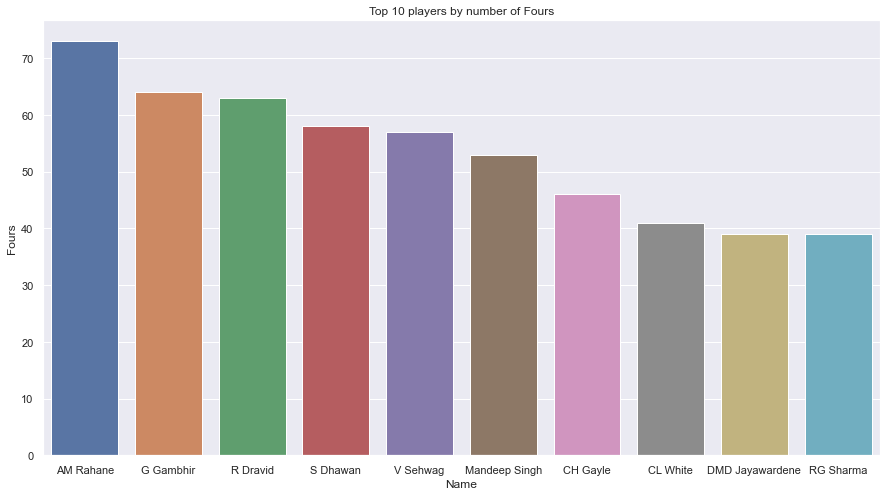

In [859]:
#Top 10 players by their number of fours
plt.figure(figsize=(15,8))
b8=bb.groupby('Name')['Fours'].sum().sort_values(ascending = False ).head(10)
b8= b8.reset_index() 
b8.columns = ['Name' ,'Fours']
sns.barplot(data= b8 , x= 'Name' , y ='Fours')
plt.title("Top 10 players by number of Fours");

From the above plot, it is clearly evident that AM Rahane has the highest number of fours and RG sharma has scored the least number of fours.

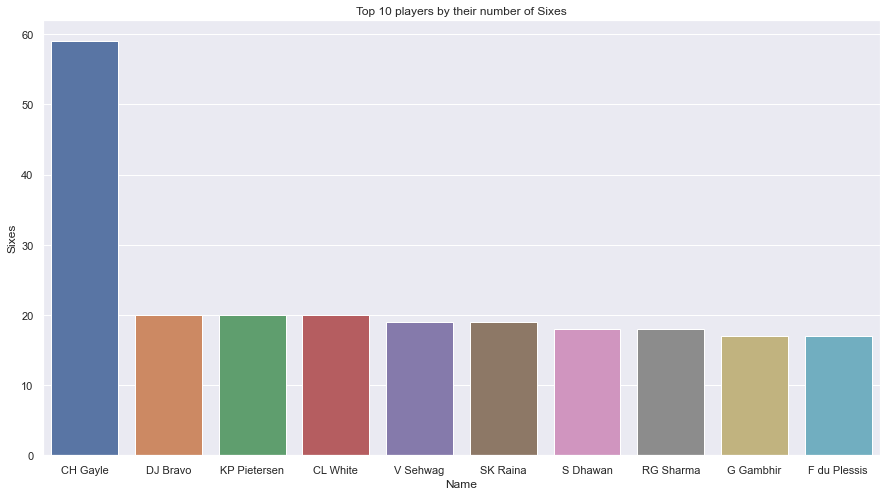

In [860]:
#Top 10 players with their number of Sixes
plt.figure(figsize=(15,8))
sixes=bb.groupby('Name')['Sixes'].sum().sort_values(ascending = False ).head(10)
sixes= sixes.reset_index() 
sixes.columns = ['Name' ,'Sixes']
sns.barplot(data= sixes , x= 'Name' , y ='Sixes')
plt.title("Top 10 players by their number of Sixes");


From the above plot, it is clearly evident that CH gayle has scored the maximum number of sixes and F du Plessis has scored the least number of sixes.

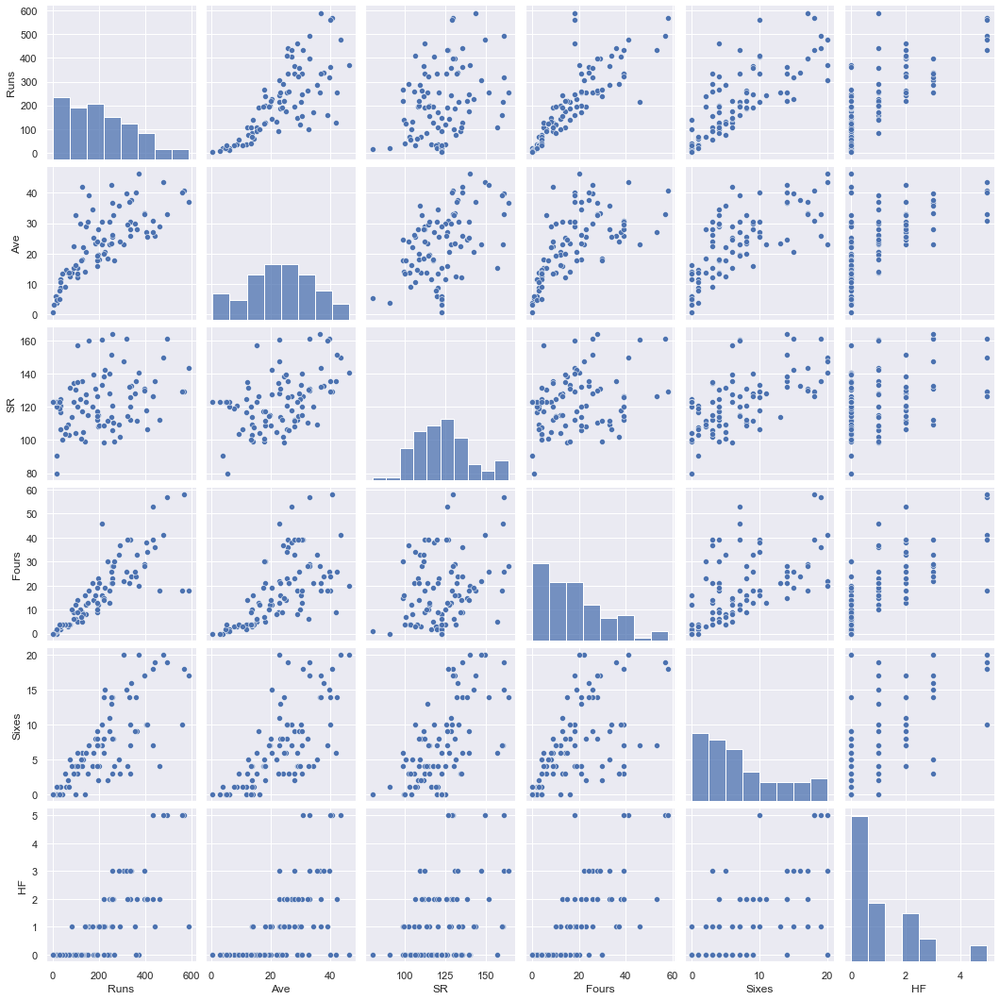

In [861]:
#pairplot
sns.pairplot(ipl1)

From the above pairplot, it is clearly evident that many few variables are very highly correlated with other variables.

In [867]:
#2.Build a data driven model to rank all the players in the dataset using all or the most important performance features.
#scaling the numeric variables
c = bb.iloc[:,1:7] 
c1 = c.apply(zscore)
c1.head()


,Runs,Ave,SR,Fours,Sixes,HF
1,3.301945,2.683984,1.767325,1.607207,6.462679,4.651551
3,2.381639,0.896390,1.036605,2.710928,1.184173,2.865038
5,1.770248,0.610640,1.788154,2.281703,1.435530,2.269533
7,1.667276,1.388883,1.297182,1.300618,1.561209,2.269533
9,2.246490,1.174755,0.444038,2.343021,1.309851,2.269533


In [868]:
#checking for the within sum of squares
wss1 =[] 
for i in range(1,6):
    KM1 = KMeans(n_clusters=i)
    KM1.fit(c1)
    wss1.append(KM1.inertia_)
wss1

D:\anaconda\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


[540.0000000000001,
 296.26135354732025,
 223.36518460916952,
 178.1750796759041,
 144.68430051153075]

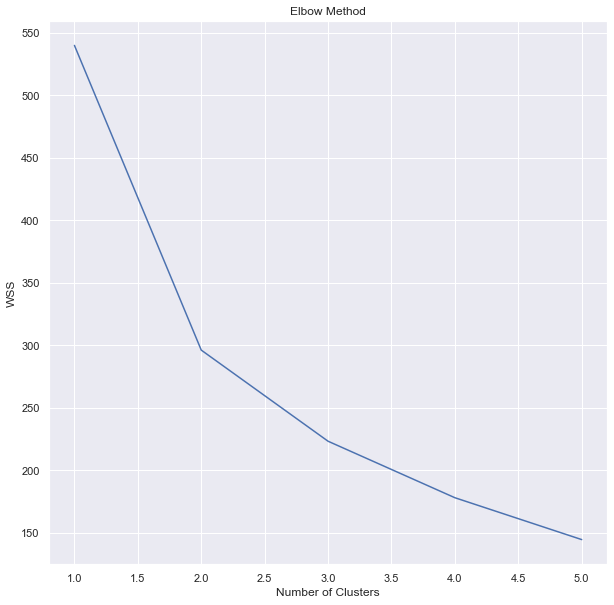

In [869]:
#plotting to check for optimal clustres 
plt.plot(range(1,6), wss1);
plt.title('Elbow Method');
plt.xlabel("Number of Clusters")
plt.ylabel("WSS");

From the above plot, it is evident that number of clusters which is optimal is 2.

In [870]:
#using 2 centroids
k_means1 = KMeans(n_clusters = 2)
k_means1.fit(c1)
labels1 = k_means1.labels_

In [871]:
# Calculating silhouette_score 

score3=silhouette_score(c1,labels1)
print("The silhouette score is:",score3)

The silhouette score is: 0.41111085574076756


In [891]:
#plotting silhouette score for different centroids
kmeans_kwargs = {
   "init": "random",
   "n_init": 10,
   "max_iter": 300,
   "random_state": 42,
}


silhouette_coefficients1 = []

 # Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 6):
    kmeans2 = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans2.fit(c1)
    score5 = silhouette_score(c1,kmeans2.labels_)
    silhouette_coefficients1.append(score5)

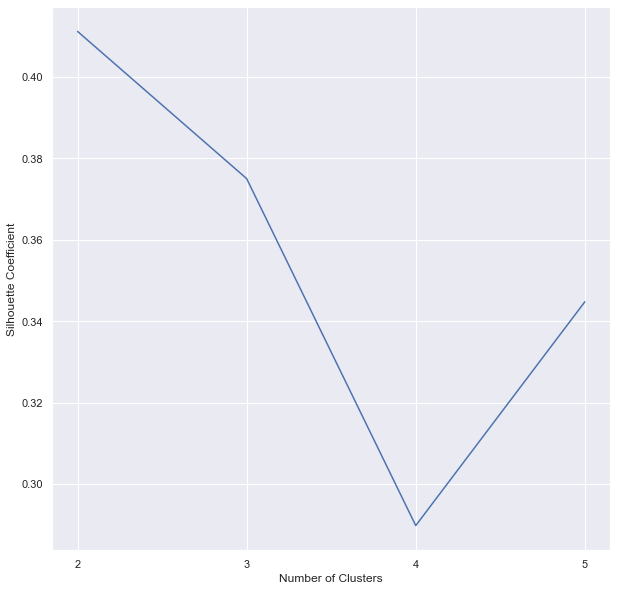

In [892]:
plt.plot(range(2,6), silhouette_coefficients1)
plt.xticks(range(2, 6))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

From the above plot, it is clearly evident that optimal number of clusters is 2 as it has the highest silhouette coefficient.

In [893]:
#attaching the labels to the original data
bb['cluster']=labels1
bb.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF,cluster
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,0
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,0
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,0
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0,0
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,0


In [894]:
#veiwing the distribution of the clusters
bb.cluster.value_counts().sort_index()

0    35
1    55
Name: cluster, dtype: int64

In [895]:
#aggregating the clusters with the numeric variables with their mean
aggdata4=bb.iloc[:,0:9].groupby('cluster').mean()
aggdata4['Freq']=bb.cluster.value_counts().sort_index()
aggdata4

,Runs,Ave,SR,Fours,Sixes,HF,Freq
cluster,,,,,,,
0,372.657143,35.962286,132.808286,34.685714,13.771429,2.714286,35
1,122.745455,17.582000,110.481455,10.309091,3.636364,0.218182,55


In [896]:
#based on the above table ranking the players in A and B
bb['cluster'] = bb['cluster'].replace({0: 'Grade A', 1: 'Grade B'})


In [897]:

#list of Grade A players
GradeA= bb[bb['cluster'] =='Grade A']
GradeA.head(10)

,Name,Runs,Ave,SR,Fours,Sixes,HF,cluster
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0,Grade A
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0,Grade A
5,V Sehwag,495.0,33.00,161.23,57.0,19.0,5.0,Grade A
7,CL White,479.0,43.54,149.68,41.0,20.0,5.0,Grade A
9,S Dhawan,569.0,40.64,129.61,58.0,18.0,5.0,Grade A
11,AM Rahane,560.0,40.00,129.33,73.0,10.0,5.0,Grade A
13,KP Pietersen,305.0,61.00,147.34,22.0,20.0,3.0,Grade A
15,RG Sharma,433.0,30.92,126.60,39.0,18.0,5.0,Grade A
17,AB de Villiers,319.0,39.87,161.11,26.0,15.0,3.0,Grade A
19,JP Duminy,244.0,81.33,128.42,13.0,11.0,2.0,Grade A


In [898]:
#list of Grade B players
GradeB= bb[bb['cluster'] =='Grade B']
GradeB.head(10)

,Name,Runs,Ave,SR,Fours,Sixes,HF,cluster
69,MS Bisla,213.0,30.42,133.12,16.0,10.0,1.0,Grade B
73,BJ Hodge,245.0,30.62,140.00,18.0,9.0,0.0,Grade B
75,NV Ojha,255.0,23.18,113.83,21.0,13.0,1.0,Grade B
77,DB Das,126.0,42.00,135.48,9.0,6.0,0.0,Grade B
79,AC Gilchrist,172.0,34.40,120.27,21.0,4.0,1.0,Grade B
81,BB McCullum,289.0,24.08,102.12,37.0,3.0,1.0,Grade B
83,IK Pathan,176.0,25.14,139.68,14.0,6.0,0.0,Grade B
85,Azhar Mahmood,186.0,23.25,130.98,16.0,8.0,0.0,Grade B
87,MK Pandey,143.0,20.42,127.67,12.0,6.0,1.0,Grade B
89,S Badrinath,196.0,28.00,108.28,23.0,2.0,1.0,Grade B


In [899]:
#part 5
#1 List down all possible dimensionality reduction techniques that can be implemented using python



1.Principal Components Analysis

2.Singular Value Decomposition

3.Non-Negative Matrix Factorization

4.Isomap Embedding

5.Locally Linear Embedding

6.Multidimensional Scaling

7.Spectral Embedding

8.t-distributed Stochastic Neighbor Embedding

In [900]:
#2. So far you have used dimensional reduction on numeric data. Is it possible to do the same on a multimedia data [images and video] and text data ? Please illustrate your findings using a simple implementation on python

(156, 194, 3)


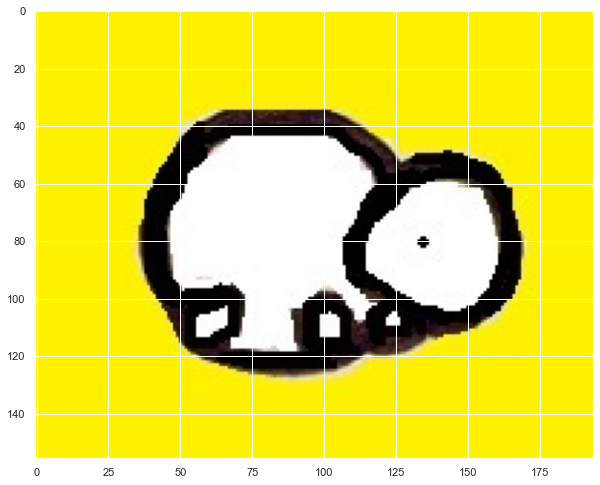

In [901]:
#image compression using PCA
import matplotlib.image as mplib 
import matplotlib.pyplot as plt
import numpy as np
from sklearn.decomposition import PCA
img = mplib.imread('opengenus_logo.png')
print(img.shape)
plt.imshow(img)

In [902]:
img_c = np.reshape(img, (156,582)) 

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(156, 32)
0.9874802
(156, 582)
(156, 194, 3)


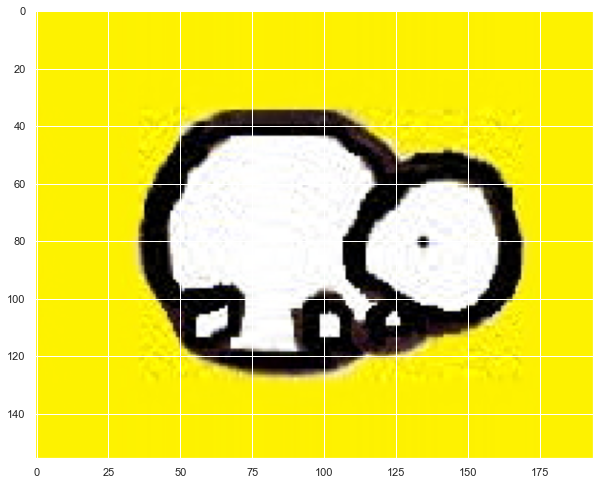

In [903]:
pca = PCA(32).fit(img_c) 
img_transform = pca.transform(img_c) 
print(img_transformed.shape)
print(np.sum(pca.explained_variance_ratio_) )

temp = pca.inverse_transform(img_transformed) 
print(temp.shape)
temp = np.reshape(temp, (156,194,3)) 
print(temp.shape) 
plt.imshow(temp)


In [904]:
print(img_transform.shape)

(156, 32)


Hence, from the above, it is clearly evident that the dimension of the image has decreased after applying PCA

In [905]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.decomposition import PCA

X = np.load('UnsupervisedProject/Sign-language-digits-dataset/X.npy')
Y = np.load('UnsupervisedProject/Sign-language-digits-dataset/Y.npy')

X.shape

(2062, 64, 64)

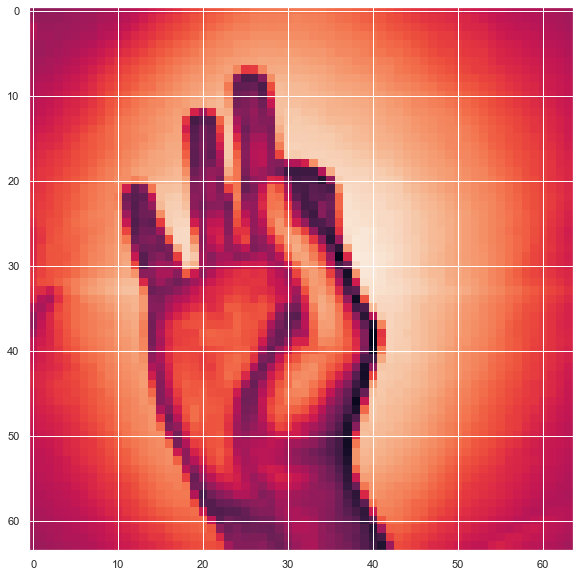

In [906]:
plt.imshow(X[0])

In [907]:
shape3= X.shape
print("Shape of the dataset:",shape3)

Shape of the dataset: (2062, 64, 64)


In [908]:
#the Y dataset here gives us the labels for these images, it is kind of weirdly ordered and this image represents the number

In [909]:
9 - np.argmax(Y[0])

9

In [910]:
#Flattening our dataset to (2062,64*64)
X_flat1 = np.array(X).reshape((2062, 64*64))
#70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X_flat1, Y, test_size=0.3, random_state=42)

In [911]:
clf1 = MLPClassifier(solver='adam', alpha=1e-5, hidden_layer_sizes=(20, 20, 20), random_state=1)
clf1.fit(X_train, y_train)

D:\anaconda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier(alpha=1e-05, hidden_layer_sizes=(20, 20, 20), random_state=1)

In [912]:
#accuracy of training data

y_h1 = clf1.predict(X_train)

print("accuracy on training data: " + str(accuracy_score(y_train, y_h1)))

accuracy on training data: 0.39015939015939016


In [913]:
#accuracy on testing data
y_h = clf1.predict(X_test)

print("accuracy on testing data: " + str(accuracy_score(y_test, y_h)))

accuracy on testing data: 0.3344103392568659


In [914]:
precision_b_pca, recall_b_pca, f1_score_b_pca, support_b_pca1 = precision_recall_fscore_support(y_test, y_h,average='macro')
print('Precision Score :', '%0.2f' % precision_b_pca)
print('Recall Score :', '%0.2f' % recall_b_pca)
print('F1-Score:', '%0.2f' % f1_score_b_pca)
Acc_b_pca= accuracy_score(y_test,y_h)
print('Accuracy Score :','%0.2f' % Acc_b_pca)

Precision Score : 0.59
Recall Score : 0.36
F1-Score: 0.39
Accuracy Score : 0.33


D:\anaconda\lib\site-packages\sklearn\metrics\_classification.py:1245: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


hence, from above it can be determined that the accuracy on the testing data is very low

In [915]:
#finding the number of dimensions that keeps 95% of the variance of the original images.
pca7 = PCA()
pca7.fit(X_train)
cumsum1 = np.cumsum(pca7.explained_variance_ratio_)
d1 = np.argmax(cumsum1 >= 0.95) + 1

In [916]:
d1

292

we've gone from 4096 dimensions to 292

In [917]:
pca_r = PCA(n_components=d1)
X_reduce = pca_r.fit_transform(X_train)
X_recover = pca_r.inverse_transform(X_reduce)

In [918]:
#shape of reduced and recovered images
print("The shape of reduced image: " + str(X_reduce.shape))
print("The shape of recovered image: " + str(X_recover.shape))

The shape of reduced image: (1443, 292)
The shape of recovered image: (1443, 4096)


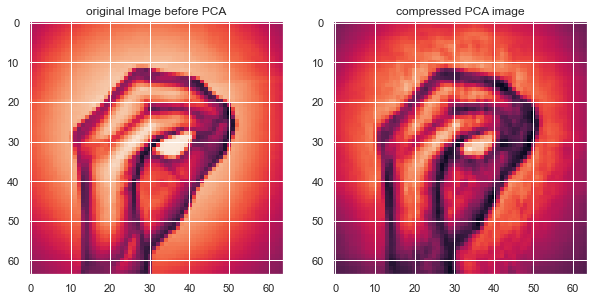

In [919]:
f = plt.figure()
f.add_subplot(1,2, 1)
plt.title("original Image before PCA")
plt.imshow(X_train[0].reshape((64,64)))
f.add_subplot(1,2, 2)

plt.title("compressed PCA image")
plt.imshow(X_recover[0].reshape((64,64)))
plt.show(block=True)

In [920]:
clf_PCA = MLPClassifier(solver='adam', alpha=1e-5, hidden_layer_sizes=(20, 20, 20))
clf_PCA.fit(X_reduce, y_train)

D:\anaconda\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:614: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


MLPClassifier(alpha=1e-05, hidden_layer_sizes=(20, 20, 20))

In [921]:
X_test_r = pca_r.transform(X_test)

y_reduced = clf_PCA.predict(X_test_r)

print("accuracy on testing data: " + str(accuracy_score(y_test, y_reduced)))

accuracy on testing data: 0.6575121163166397


In [922]:
X_train_r = pca_r.transform(X_train)

y_reduced_train = clf_PCA.predict(X_train_r)

print("accuracy on training data: " + str(accuracy_score(y_train, y_reduced_train)))

accuracy on training data: 1.0


In [923]:
precision_pca, recall_pca, f1_score_pca, support_pca1 = precision_recall_fscore_support(y_test, y_reduced,average='macro')
print('Precision Score :', '%0.2f' % precision_pca)
print('Recall Score :', '%0.2f' % recall_pca)
print('F1-Score:', '%0.2f' % f1_score_pca)
Acc_pca= accuracy_score(y_test,y_reduced)
print('Accuracy Score :','%0.2f' % Acc_pca)

Precision Score : 0.78
Recall Score : 0.72
F1-Score: 0.75
Accuracy Score : 0.66


In [924]:
modellists3 = []
modellists3.append([' without PCA',Acc_b_pca*100,precision_b_pca*100,recall_b_pca*100,f1_score_b_pca*100 ])
modellists3.append([' with PCA',Acc_pca*100,precision_pca*100,recall_pca*100,f1_score_pca*100 ])
mdl_df5 = pd.DataFrame(modellists3, columns = ['Model','Accuracy Score of Test Data','Precision','Recall','F1 score'])
mdl_df5

,Model,Accuracy Score of Test Data,Precision,Recall,F1 score
0,without PCA,33.441034,58.877905,35.714099,39.262880
1,with PCA,65.751212,78.327881,71.848468,74.700227


Hence, from the above, it is clearly evident that the accuracy of the testing data has increased after applying PCA to 65.4% from 33.44%

In [925]:
#Dimensionality reduction on Text data
from sklearn.datasets import load_digits
digits1 = load_digits()
digits1.images.shape

(1797, 8, 8)

In [926]:
X2 = digits1.data
X2.shape

(1797, 64)

In [927]:
y2 = digits1.target
y2.shape

(1797,)

In [928]:
#transforming the data to two dimensions using manifold learning algorithm called Isomap
from sklearn.manifold import Isomap
iso1 = Isomap(n_components=2)
iso1.fit(digits1.data)
data_t = iso1.transform(digits1.data)
data_t.shape

(1797, 2)

In [929]:
from sklearn.model_selection import train_test_split
 # Split X and y into training and test set in 70:30 ratio

X_train2, X_test2, y_train2, y_test2 = train_test_split(X2, y2, test_size=0.30, random_state=15)

In [930]:
#fit a Gaussian naive Bayes model
from sklearn.naive_bayes import GaussianNB
model1 = GaussianNB()
model1.fit(X_train2, y_train2)
predict2 = model1.predict(X_test2)

In [931]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test2, predict2)

0.8407407407407408

In [932]:
#after isomap, using this data and then splitting the data into 70:30
X_train5, X_test5, y_train5, y_test5 = train_test_split(data_t, y2, test_size=0.30, random_state=15)

In [933]:
#after Isomap fitting a gaussian naive bayes model
from sklearn.naive_bayes import GaussianNB
model7 = GaussianNB()
model7.fit(X_train5, y_train2)
predict6 = model7.predict(X_test5)

In [934]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test5, predict6)

0.674074074074074

From the above 2 accuracy scores it can be determined that Gaussian naive bayes model without isomap has the highest accuracy. but, the accuracy of the model with isomap after dimensionality reduction from 64 attributes to 2 attributes is 67%.the difference can be illustrated even better if the dataset had been cursed with dimensionality, since its 64 variable in the original data the difference is very subtle.